In [1]:
import os
import numpy as np
import scipy as sp 
import matplotlib.pyplot as plt
import pandas as pd
import analyze
from analyze import SPE
from scipy.stats import norm
from tqdm import tqdm
%matplotlib inline

In [2]:
# read in data from a single run

datadir = "/project/lgrandi/xenon1t/spe_acceptance/data"

def get_filepath(run):
    return os.path.join(datadir, "run_%05d.h5" % run)

S = SPE(get_filepath(18930))

#fake_acc, fake_errs=S.acceptance(4, space='amplitude', errors=True)
#print(*fake_errs[0, 0, :])

/home/awalsh272/SPE/SPE/analyze.py:85: RuntimeWarning: invalid value encountered in true_divide
  sigma_corr_noise=corr_noise*np.sqrt( (sigma_corr/corrections)**2 + (sigma_noise/noise)**2)


In [3]:
noise = S.data['noise_charge']
noise_errs = np.sqrt(noise)

led = S.data['LED_charge']
led_errs = np.sqrt(led)

led_amp = S.data['LED_amplitude']
noise_amp = S.data['noise_amplitude']
amp_noise_errs=np.sqrt(noise_amp)
amp_led_errs=np.sqrt(led_amp)

#all of the above have shape (1099, 248)

bins = S.data['bin_centers']



In [4]:
def correction_threshold(f, hist):
    """returns bin to correct to, given an f value and a noise spectrum"""
    fs = np.cumsum(hist)/np.sum(hist)
    return np.where(np.absolute(fs - f) == min(np.absolute(fs - f)))[0]

In [5]:
def find_f(ch, amp_noise, q_noise, plot=True):
    f=np.arange(0.01,1,0.001)
    q_thresh=correction_threshold(0.333, q_noise[:, ch])
    q_corr, q_corr_err = S.make_correction(val2corr2=bins[q_thresh]+0.5, space='charge')
    q_occ=-np.log(q_corr)
    occ_diffs=[]
    for fs in f:
        amp_thresh=correction_threshold(fs, amp_noise[:, ch])
        amp_corr, amp_corr_err=S.make_correction(val2corr2=bins[amp_thresh]+0.5, space='amplitude')
        amp_occ=-np.log(amp_corr)
        occ_diff=(q_occ[ch]-amp_occ[ch])/q_occ[ch]
        occ_diffs.append(abs(occ_diff))
    if plot==True:
        plt.figure()
        plt.plot(f, occ_diffs, linestyle='None', marker='.')
        plt.title("f vs occ_diffs, ch %d" %ch)
        plt.xlabel("f")
        plt.ylabel("Fractional difference in occupancy")
        plt.show()
    min_diff=np.where(occ_diffs==min(occ_diffs))[0]
    return f[min_diff][0]
        

In [6]:
def A_func(residual):
    return 1 - residual.cumsum(axis=0) / residual.sum(axis=0)

def acc_MC(residual, sigma_res, total_curves):
    new_res=np.zeros((total_curves, len(residual)), dtype=float)
    new_accs=np.zeros((total_curves, len(residual)), dtype=float)
    samples=np.zeros((len(residual), total_curves), dtype=float)
    for b, res in enumerate(residual):
        mu=res
        sigma=abs(sigma_res[b])
        #print('sig res: ', np.shape(sigma_res))
        #print("shape: ", np.shape(sigma))
        #print("Residual: ", np.shape(residual))
        #print("Res: ", np.shape(res))
        #print('sigma: ',sigma)
        if np.isnan(sigma):
            new_res[:,b]=mu
        else:
            sample=norm.rvs(loc=mu, scale=sigma, size=total_curves)
            samples[b]=sample
            
        new_res=np.transpose(samples)       
    new_accs =  A_func(new_res.T)
    #clip to prevent unphysical values
    new_acc=np.clip(new_accs, -0.1, 1.1)
    
    return new_accs


In [7]:
f_dict={}
for ch in tqdm(np.arange(248)):
    f_dict[ch]=find_f(ch, noise_amp, noise, plot=False)

 12%|█▎        | 31/248 [01:03<07:23,  2.05s/it]/home/awalsh272/SPE/SPE/analyze.py:62: RuntimeWarning: divide by zero encountered in true_divide
  corr=led_firstN / noise_firstN
/home/awalsh272/SPE/SPE/analyze.py:62: RuntimeWarning: invalid value encountered in true_divide
  corr=led_firstN / noise_firstN
/home/awalsh272/SPE/SPE/analyze.py:63: RuntimeWarning: invalid value encountered in true_divide
  sigma_corr=corr*np.sqrt((sigma_led_firstN/led_firstN)**2 + (sigma_noise_firstN/noise_firstN)**2)
/cvmfs/xenon.opensciencegrid.org/releases/anaconda/2.4/envs/pax_v6.8.0/lib/python3.4/site-packages/ipykernel/__main__.py:10: RuntimeWarning: divide by zero encountered in log
100%|██████████| 248/248 [08:27<00:00,  2.05s/it]


In [8]:
f_df=pd.DataFrame(f_dict)
pd.options.display.max_rows=248
f_df=f_df.transpose()
f_df

,0,1
0,0.384,0.662
1,0.983,0.993
2,0.385,0.609
3,0.520,0.795
4,0.827,0.898
5,0.999,0.999
6,0.576,0.783
7,0.820,0.955
8,0.274,0.617
9,0.785,0.893


In [11]:
def plot_thresh(ch, charge_noise, amp_noise, charge_errs, amp_errs, charge_led, amp_led, led_errs, amp_led_errs):
    q_noise=charge_noise[:, ch]
    a_noise=amp_noise[:, ch]
    
    q_led=charge_led[:, ch]
    a_led=amp_led[:, ch]
    
    q_nerrs=charge_errs[:, ch]
    a_nerrs=amp_errs[:,ch]
    
    q_lerrs=led_errs[:,ch]
    a_lerrs=amp_led_errs[:, ch]
    
    amp_thresh1=correction_threshold(np.mean(f_df.loc[:,0]), a_noise)
    amp_thresh2=correction_threshold(f_df.loc[ch, 0], a_noise)
    amp_thresh3=correction_threshold(np.median(f_df.loc[:,0]), a_noise)
    
    q_thresh=correction_threshold(0.333, q_noise)
    
    amp_corr1, amp_corr_err1=S.make_correction(val2corr2=bins[amp_thresh1]+0.5, space='charge')
    amp_corr2, amp_corr_err2=S.make_correction(val2corr2=bins[amp_thresh2]+0.5, space='amplitude')
    amp_corr3, amp_corr_err3=S.make_correction(val2corr2=bins[amp_thresh3]+0.5, space='amplitude')
    
    q_corr, q_corr_err=S.make_correction(val2corr2=bins[q_thresh]+0.5, space='charge')
    
    q_occ=-np.log(q_corr)
    
    res1=a_led-amp_corr1[ch]*a_noise
    res2=a_led-amp_corr2[ch]*a_noise
    res3=a_led-amp_corr3[ch]*a_noise
    
    sigma_acorr_anoise1=amp_corr1*noise_amp*np.sqrt( (amp_corr_err1/amp_corr1)**2 + (amp_noise_errs/noise_amp)**2)
    sigma_res1=np.sqrt( amp_led_errs**2 + sigma_acorr_anoise1**2).T
    
    sigma_acorr_anoise2=amp_corr2*noise_amp*np.sqrt( (amp_corr_err2/amp_corr2)**2 + (amp_noise_errs/noise_amp)**2)
    sigma_res2=np.sqrt( amp_led_errs**2 + sigma_acorr_anoise2**2).T
    
    sigma_acorr_anoise3=amp_corr3*noise_amp*np.sqrt( (amp_corr_err3/amp_corr3)**2 + (amp_noise_errs/noise_amp)**2)
    sigma_res3=np.sqrt( amp_led_errs**2 + sigma_acorr_anoise3**2).T
    
    acc1=1-res1.cumsum()/res2.sum()
    acc2=1-res2.cumsum()/res2.sum()
    acc3=1-res3.cumsum()/res3.sum()
    
    total_curves=1000
    acc1_curves=acc_MC(res1, sigma_res1[ch], total_curves)
    acc2_curves=acc_MC(res2, sigma_res2[ch], total_curves)
    acc3_curves=acc_MC(res3, sigma_res3[ch], total_curves)
    
    acc1_lower=np.percentile(acc1_curves, 16, axis=1)
    acc2_lower=np.percentile(acc2_curves, 16, axis=1)
    acc3_lower=np.percentile(acc3_curves, 16, axis=1)
    acc1_upper=np.percentile(acc1_curves, 84, axis=1)
    acc2_upper=np.percentile(acc2_curves, 84, axis=1)
    acc3_upper=np.percentile(acc3_curves, 84, axis=1)
    
    
    errs1=[acc1_lower-np.mean(acc1_curves, axis=1), acc1_upper-np.mean(acc1_curves, axis=1)]
    errs2=[acc2_lower-np.mean(acc2_curves, axis=1), acc2_upper-np.mean(acc2_curves, axis=1)]
    errs3=[acc3_lower-np.mean(acc3_curves, axis=1), acc3_upper-np.mean(acc3_curves, axis=1)]
    
    thresholds = analyze.get_thresholds(analyze.find_regular_run(18930))
    thresholds=np.array(thresholds[:248])
    
    bin0 = np.where(S.data['bin_centers'] == 0.5)[0][0]
    index=bin0+thresholds
    
    fs=f_df.loc[ch,0]
    
    #only plot on channels
    if q_occ[ch]>0.05:
        #LED/Noise spectra
        fig, (a1, a2) = plt.subplots(1, 2, figsize=(15,6))
        a1.errorbar(bins, q_noise, yerr=q_nerrs, linestyle='None', marker='.', color='k', label='Noise')
        a1.errorbar(bins, q_led, yerr=q_lerrs, linestyle='None', marker='.', color='r', label='LED')
        a1.axvline(x=bins[q_thresh])
        a1.set_xlabel("Charge")
        a1.set_ylabel("Counts/Bin")
        a1.set_xlim(-100, 100)
        a1.legend(loc='best')
        a1.set_title("Charge Noise, ch %d" %ch)

        a2.errorbar(bins, a_noise, yerr=a_nerrs, linestyle='None', marker='.', color='k', label='Noise')
        a2.errorbar(bins, a_led, yerr=a_lerrs, linestyle='None', marker='.', color='r', label='LED')
        a2.axvline(x=bins[amp_thresh2], label='f=%f' %f_df.loc[ch, 0], color='b')
        a2.axvline(x=bins[amp_thresh1], label='mean', color='g')
        a2.axvline(x=bins[amp_thresh3], label='median', color='y')
        a2.set_xlabel("Amplitude")
        a2.set_ylabel("Counts/Bin")
        a2.set_xlim(-10, 50)
        a2.set_yscale('log')
        a2.legend(loc='best')
        a2.set_title("Amp Noise, ch %d" %ch)

        #residuals
        fig, (a1, a2) = plt.subplots(1, 2, figsize=(15,6))
        a1.errorbar(bins, res3, yerr=sigma_res3[ch], linestyle='None', marker='.', label='median f', color='g')
        a1.errorbar(bins, res1, yerr=sigma_res1[ch], linestyle='None', marker='.', label='mean f', color='r')
        a1.errorbar(bins, res2, yerr=sigma_res2[ch], linestyle='None', marker='.', label='f= %f' %fs, color='b')
        a1.set_xlabel("Amplitude")
        a1.set_ylabel("Counts/Bin")
        a1.set_xlim(-5, 20)
        a1.legend(loc='best')
        #a1.set_yscale('log')
        a1.set_title("Residuals, ch %d" %ch)

        #acc curves
        a2.plot(bins, acc3, label='median f', color='g')
        a2.plot(bins, acc1,label='mean f', color='r')
        a2.plot(bins, acc2, label='f= %f' %fs, color='b')
        a2.set_xlabel("Amplitude")
        a2.set_ylabel("Acc Frac")
        a2.set_xlim(-10, 125)
        a2.legend(loc='best')
        a2.set_title("Acc Curves, ch %d" %ch)
        
        
        #MC Curves
        plt.figure()
        print('Mean: ',abs(errs1[0][index[ch]]), errs1[1][index[ch]])
        for curve in np.arange(total_curves):
            plt.plot(bins, acc1_curves[:, curve], color='k', alpha=0.05)
        plt.plot(bins, acc1, color='r', label='Mean f')
        plt.plot(bins, acc1_lower, color='b', label='16th Percentile')
        plt.plot(bins, acc1_upper, color='y', label='84th Percentile')
        plt.xlabel('Amplitude')
        plt.ylabel('Acc Frac')
        plt.title('Acc with mean f, ch %d' %ch)
        plt.legend(loc='best')
        plt.axvline(x=thresholds[ch])
        plt.xlim(0,50)
        plt.ylim(0.75, 1.2)
        
        plt.figure()
        print('Variable: ',abs(errs2[0][index[ch]]), errs2[1][index[ch]])
        for curve in np.arange(total_curves):
            plt.plot(bins, acc2_curves[:,curve], color='k', alpha=0.05)
        plt.plot(bins, acc2, color='r', label='f=%f' %f_df.loc[ch,0])
        plt.plot(bins, acc2_lower, color='b', label='16th Percentile')
        plt.plot(bins, acc2_upper, color='y', label='84th Percentile')
        plt.xlabel('Amplitude')
        plt.ylabel('Acc Frac')
        plt.title('Acc with variable f, ch %d' %ch)
        plt.legend(loc='best')
        plt.axvline(x=thresholds[ch])
        plt.xlim(0,50)
        plt.ylim(0.75, 1.2)
        
        plt.figure()
        print('Median: ', abs(errs3[0][index[ch]]), errs3[1][index[ch]])
        for curve in np.arange(total_curves):
            plt.plot(bins, acc3_curves[:,curve], color='k', alpha=0.05)
        plt.plot(bins, acc3, color='r', label='Median f')
        plt.plot(bins, acc3_lower, color='b', label='16th Percentile')
        plt.plot(bins, acc3_upper, color='y', label='84th Percentile')
        plt.xlabel('Amplitude')
        plt.ylabel('Acc Frac')
        plt.title('Acc with median f, ch %d' %ch)
        plt.legend(loc='best')
        plt.axvline(x=thresholds[ch])
        plt.xlim(0, 50)
        plt.ylim(0.75, 1.2)

        plt.show()
    else:
        print('ch %d is off' %ch)

/cvmfs/xenon.opensciencegrid.org/releases/anaconda/2.4/envs/pax_v6.8.0/lib/python3.4/site-packages/ipykernel/__main__.py:32: RuntimeWarning: invalid value encountered in true_divide
/cvmfs/xenon.opensciencegrid.org/releases/anaconda/2.4/envs/pax_v6.8.0/lib/python3.4/site-packages/ipykernel/__main__.py:35: RuntimeWarning: invalid value encountered in true_divide
/cvmfs/xenon.opensciencegrid.org/releases/anaconda/2.4/envs/pax_v6.8.0/lib/python3.4/site-packages/ipykernel/__main__.py:38: RuntimeWarning: invalid value encountered in true_divide


Mean:  0.0134564631254 0.0133872531461
Variable:  0.0103947041428 0.0104333510547
Median:  0.010712278034 0.0105754584205


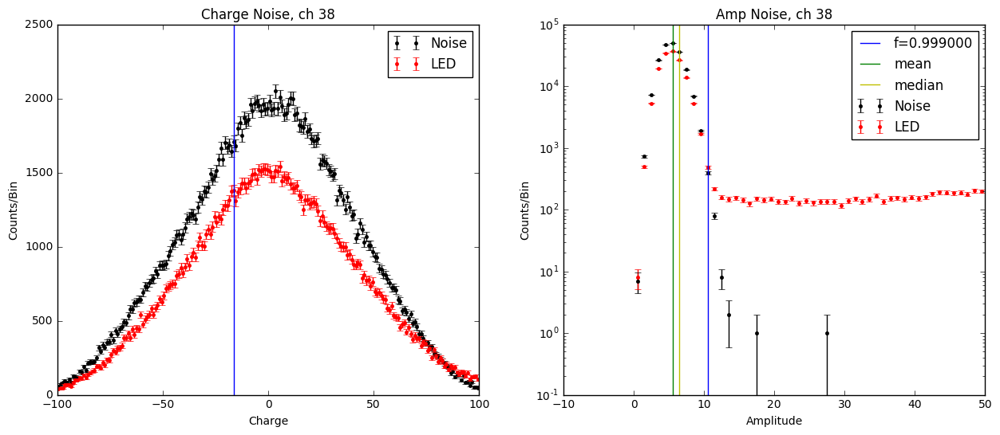

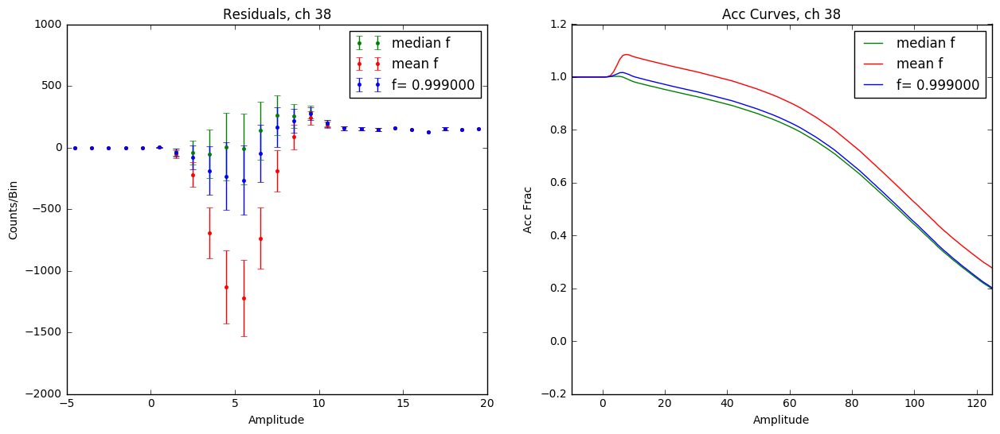

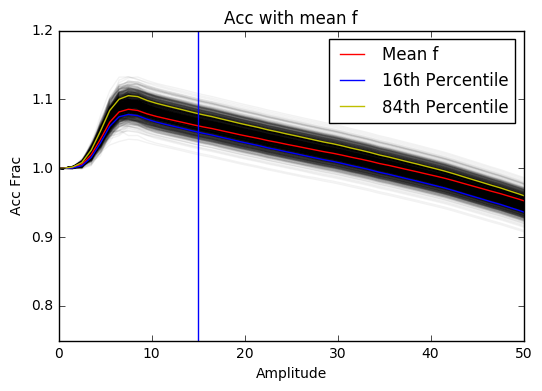

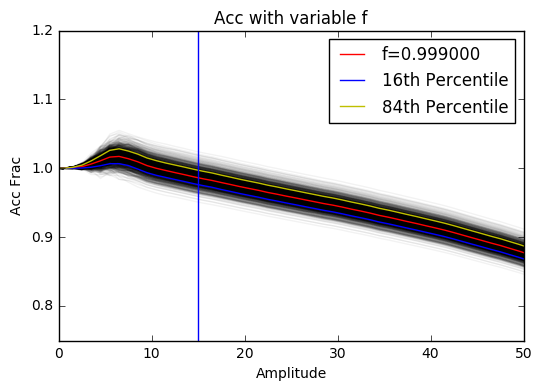

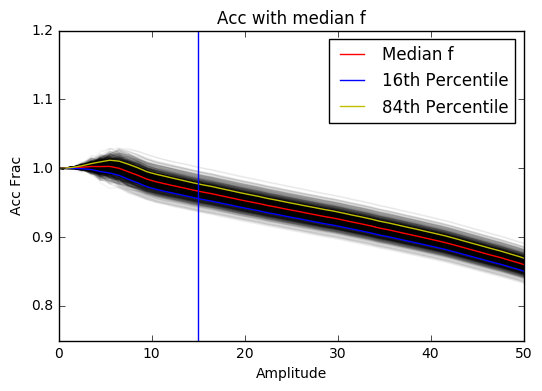

Mean:  0.0113907839891 0.0113593532902
Variable:  0.0117227850665 0.0114192681999
Median:  0.0104473999457 0.0103779637126


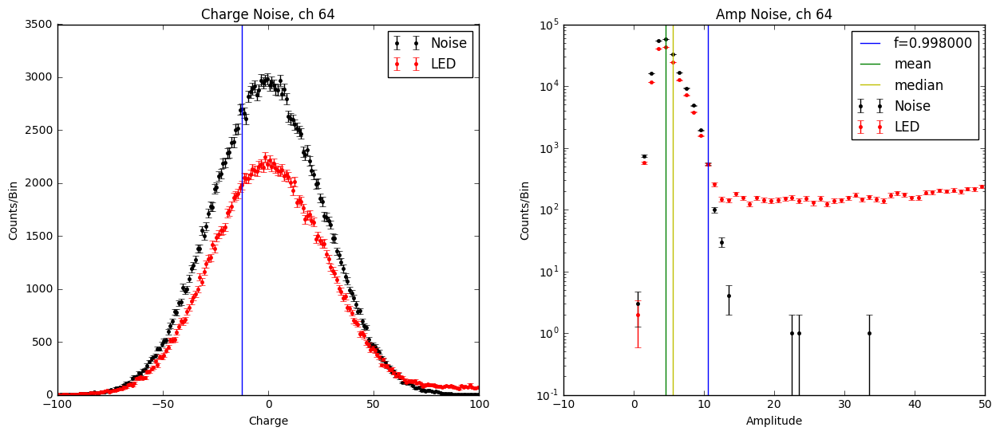

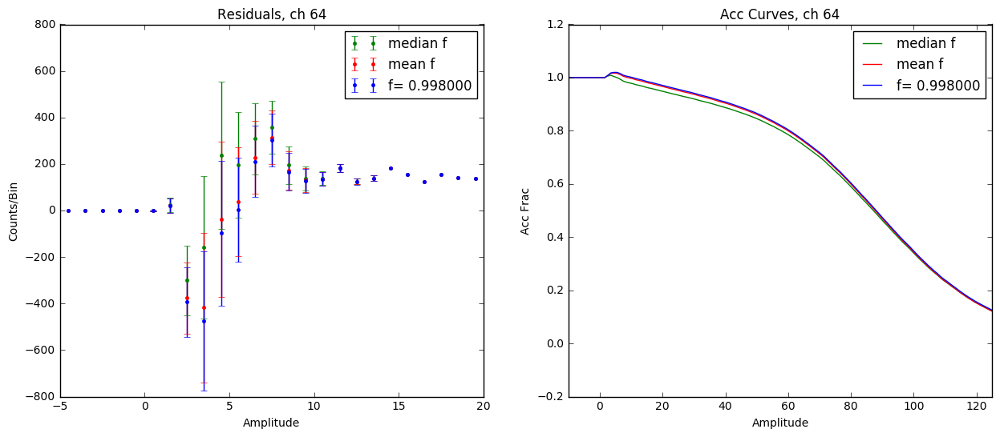

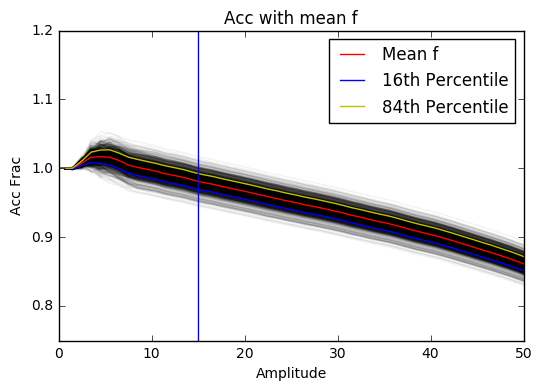

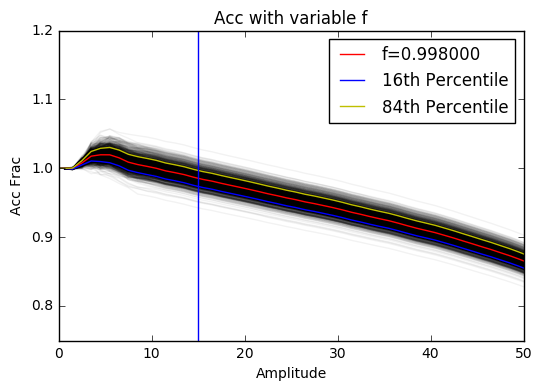

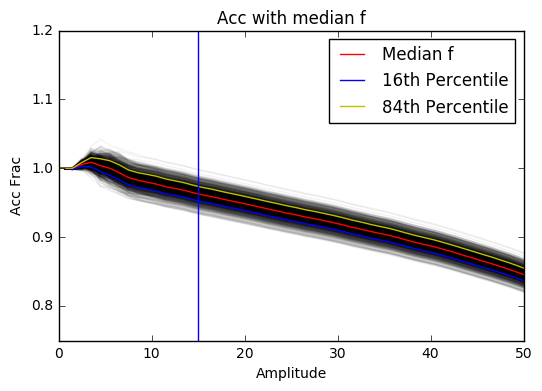

Mean:  0.0135878263336 0.0127353408947
Variable:  0.0108484489067 0.0106887098346
Median:  0.00935993555829 0.0094213652507


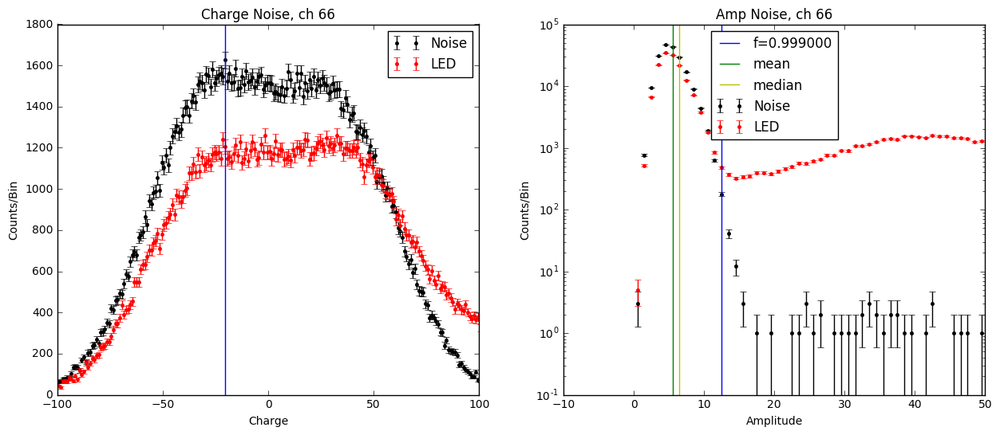

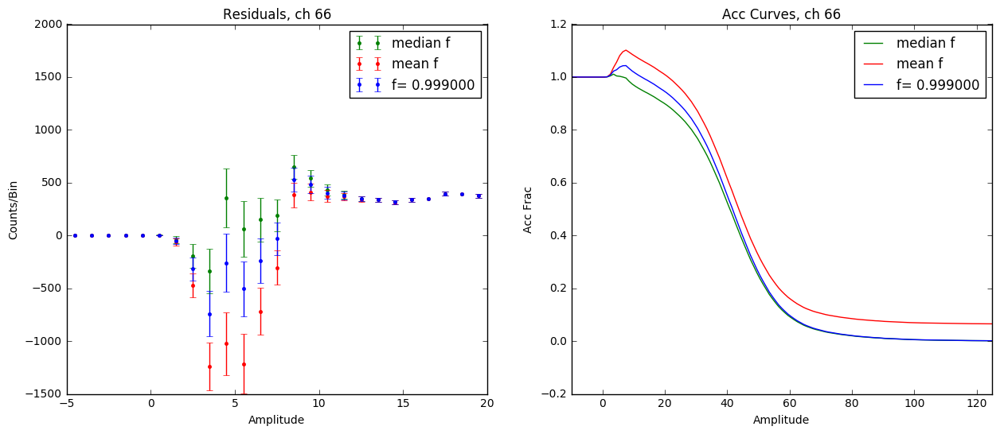

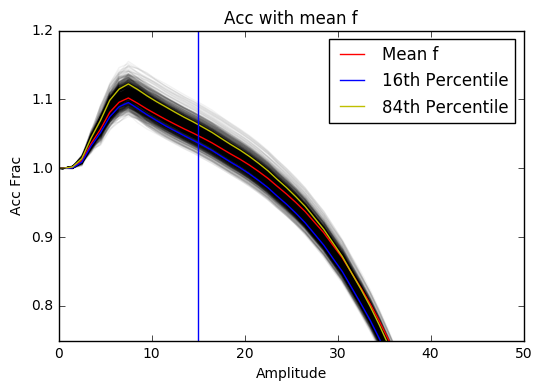

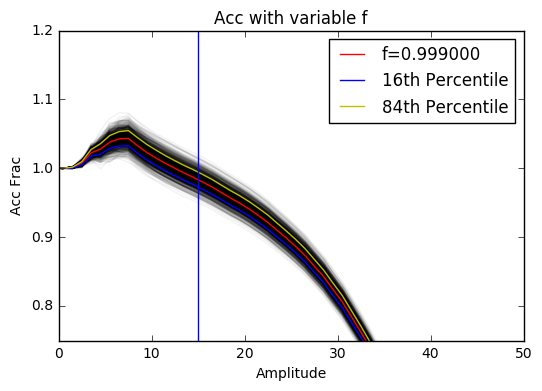

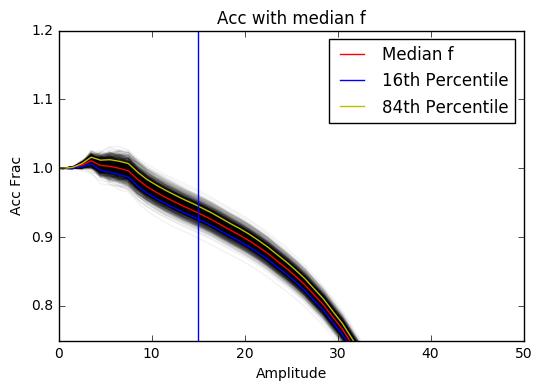

Mean:  0.0109087467508 0.0101071901117
Variable:  0.0104450095076 0.0103702459551
Median:  0.0097572785123 0.00988003443098


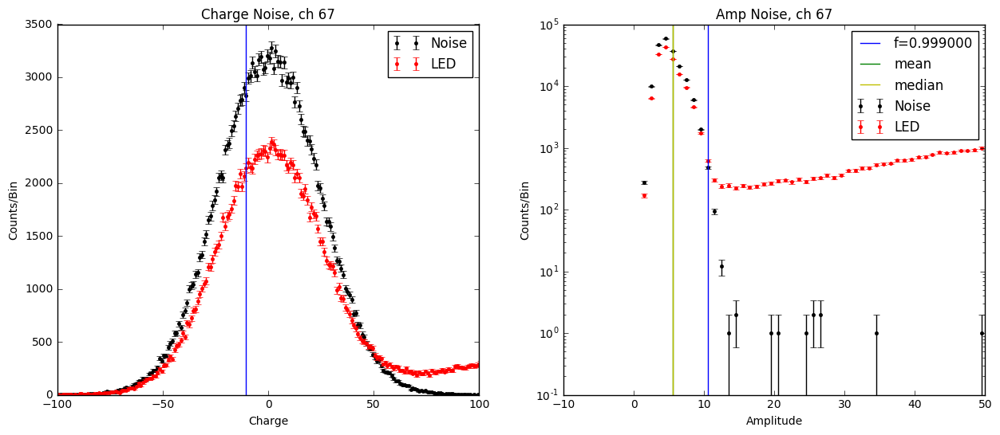

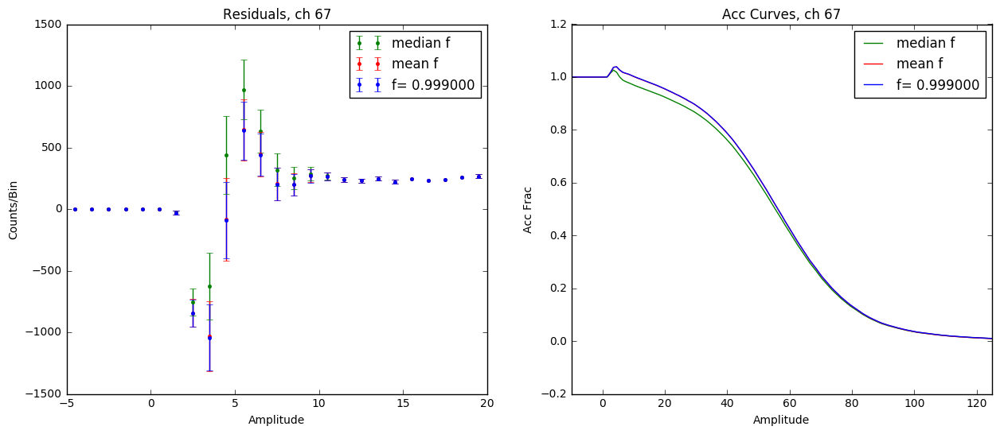

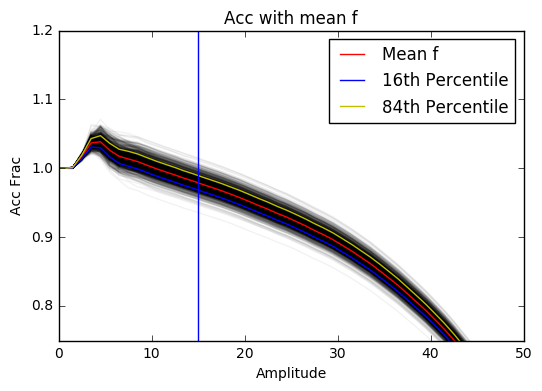

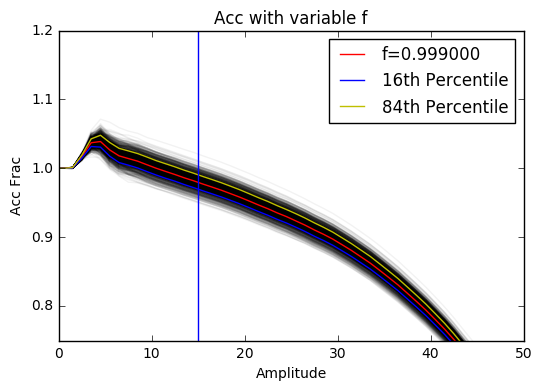

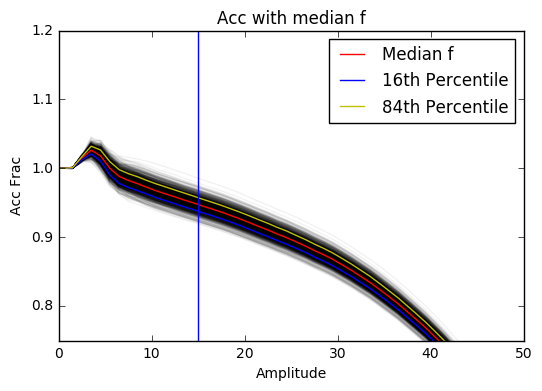

Mean:  0.0116993324582 0.0113969363158
Variable:  0.0102885937658 0.00981491709439
Median:  0.00943364660269 0.00964932093124


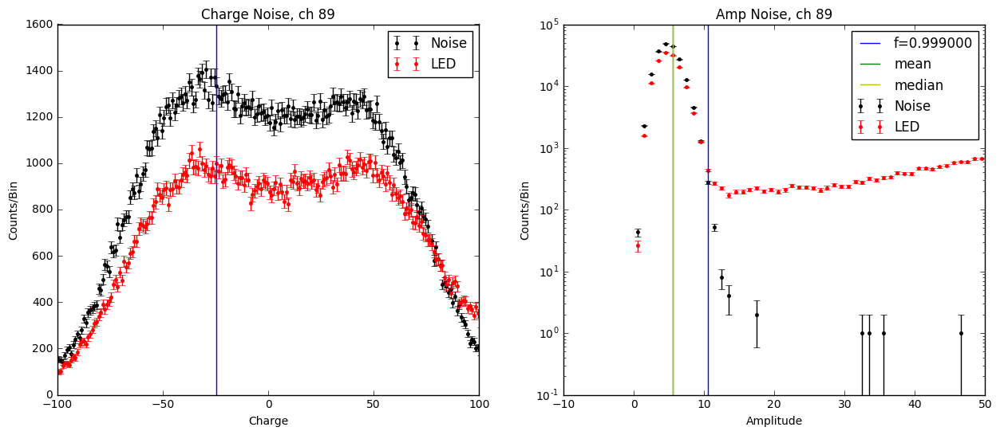

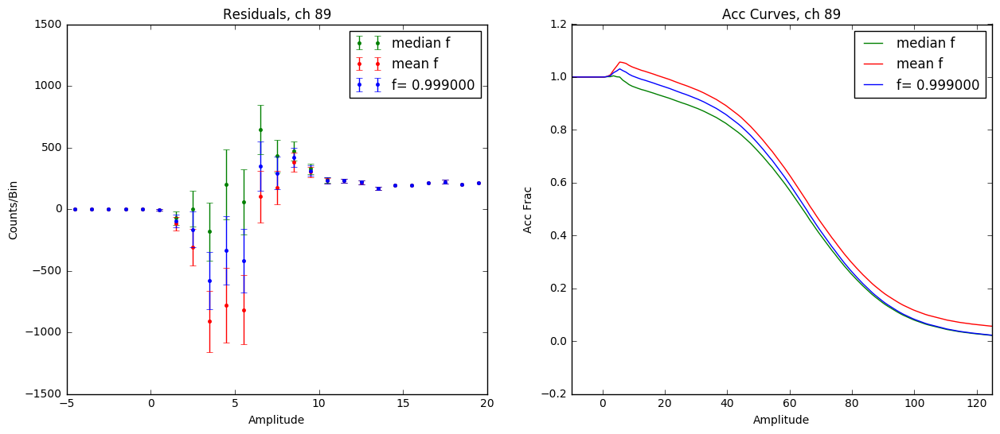

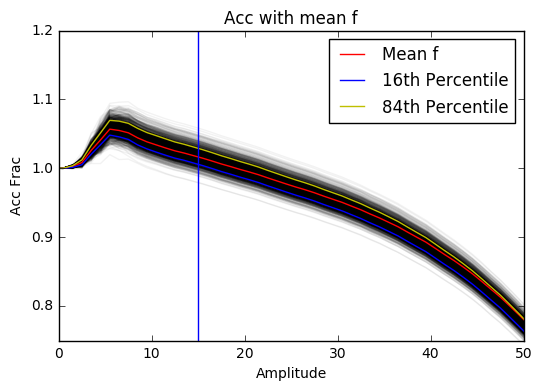

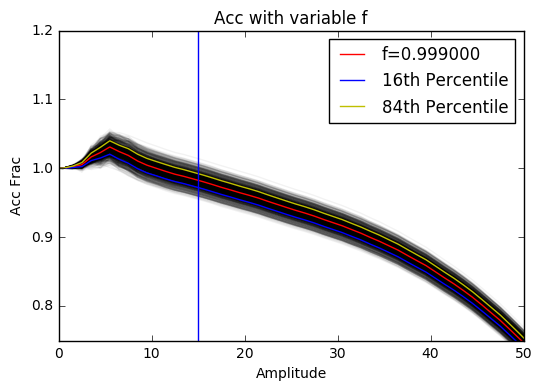

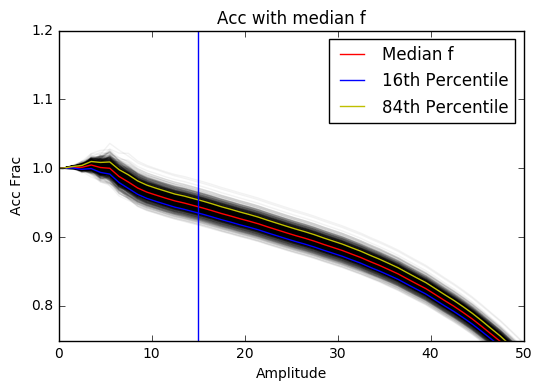

Mean:  0.0100141212815 0.00950635882429
Variable:  0.0095723387613 0.00910695643669
Median:  0.00919163765694 0.00934641493243


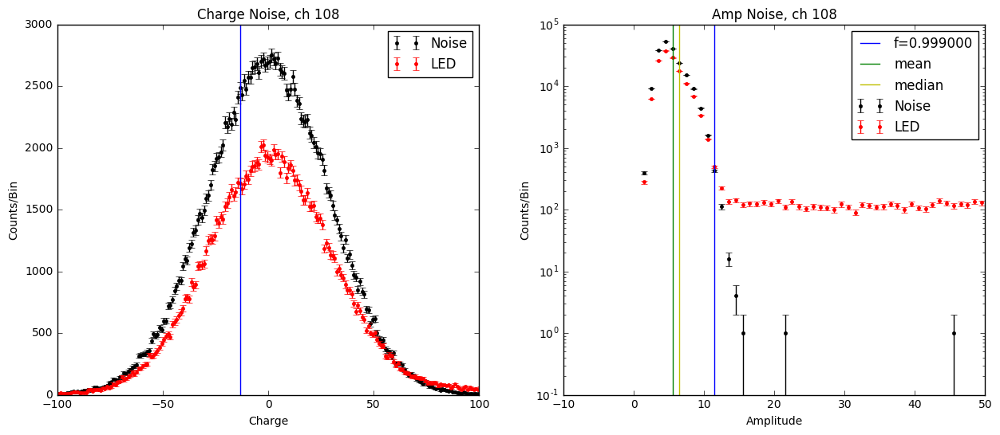

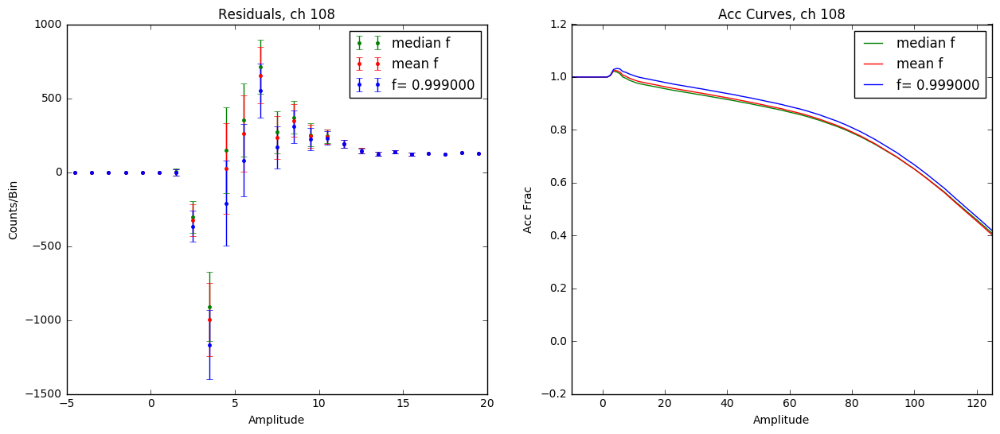

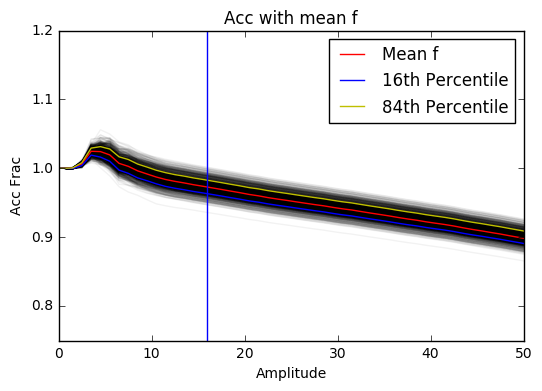

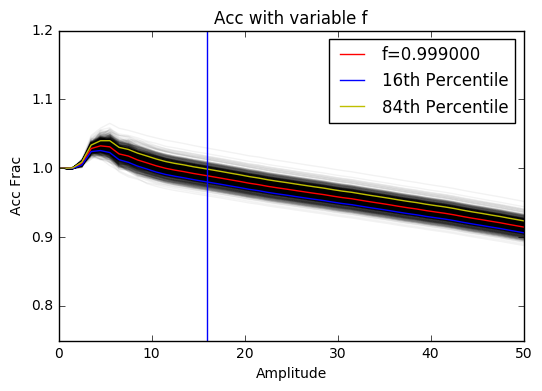

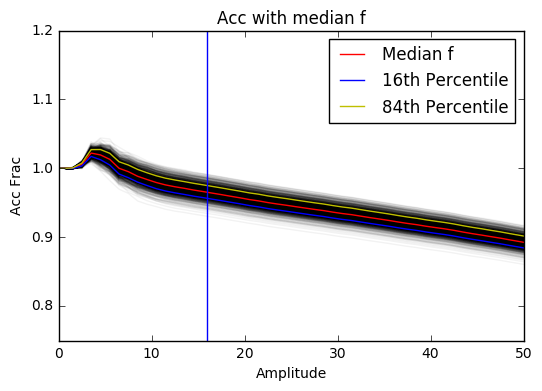

Mean:  0.010269068784 0.0103411269776
Variable:  0.0099647042806 0.00957351143284
Median:  0.0086286247194 0.00858000282666


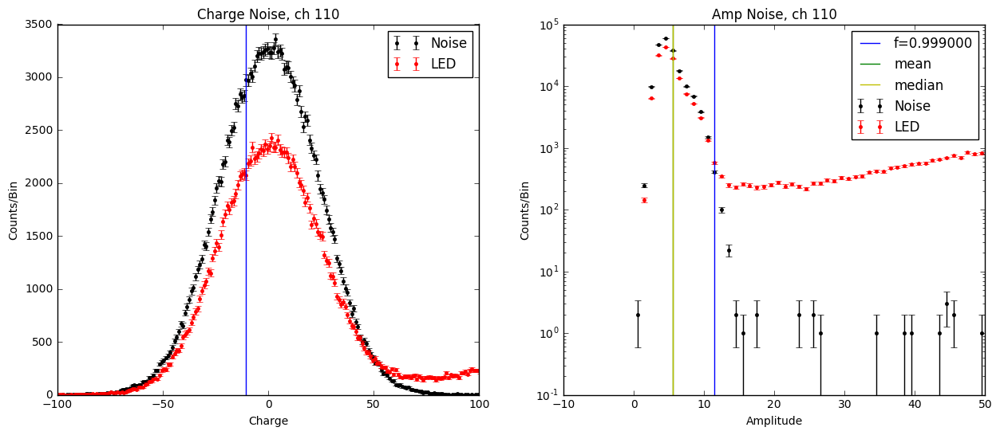

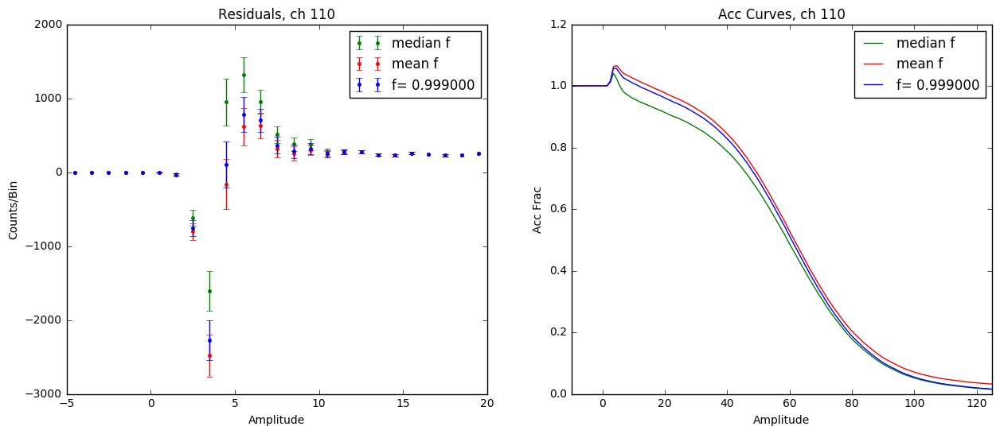

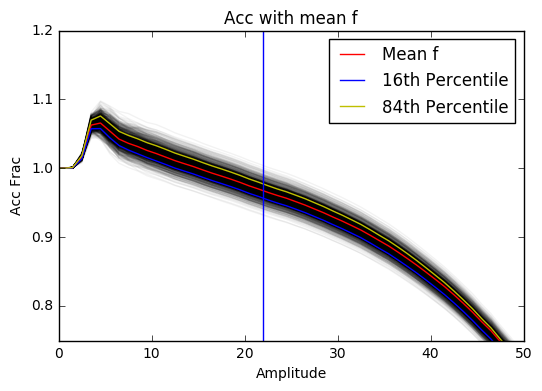

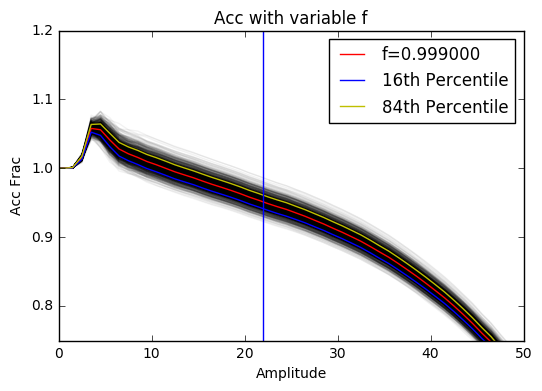

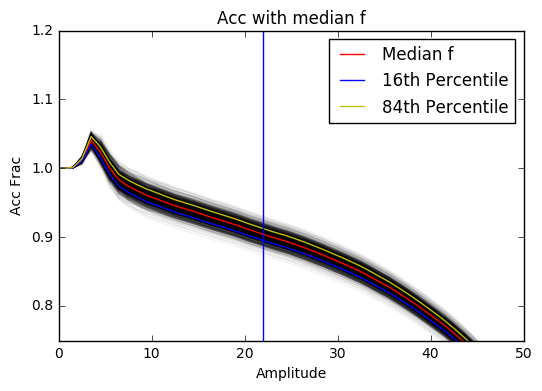

Mean:  0.0102466326391 0.00963863659676
Variable:  0.00979931635022 0.00975566029543
Median:  0.00913832179844 0.00901358724678


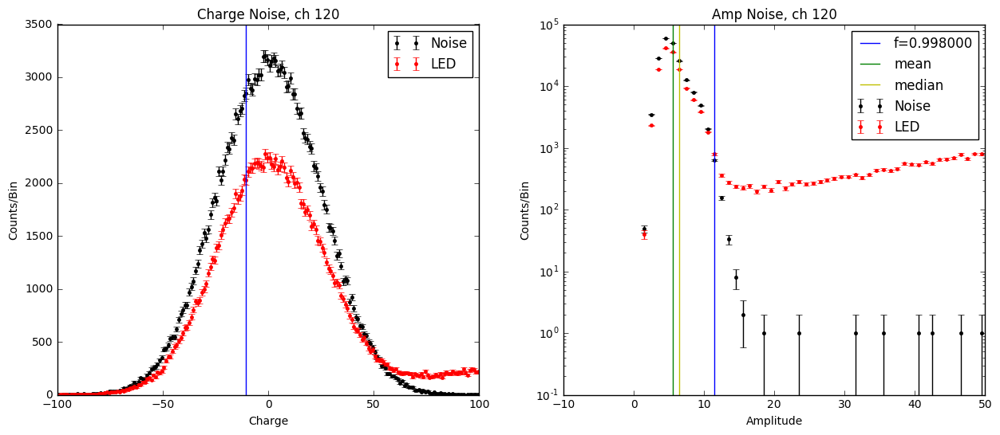

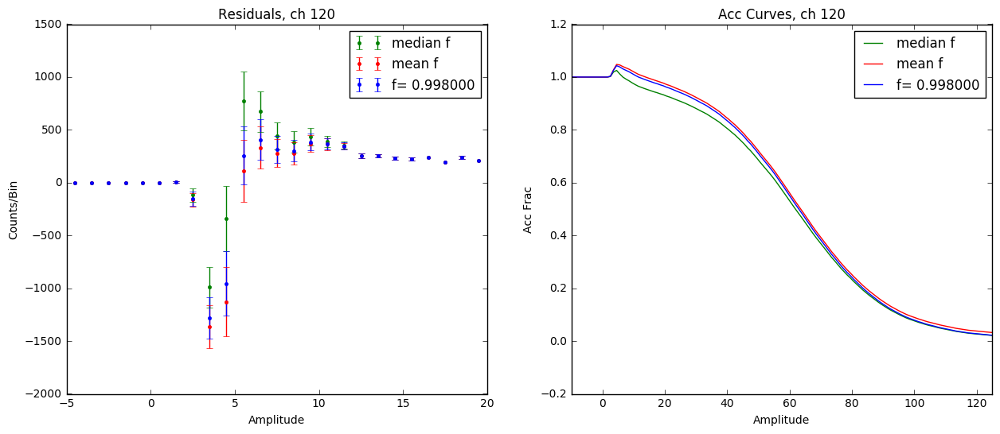

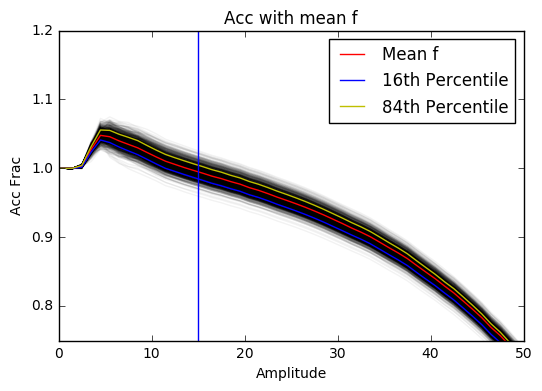

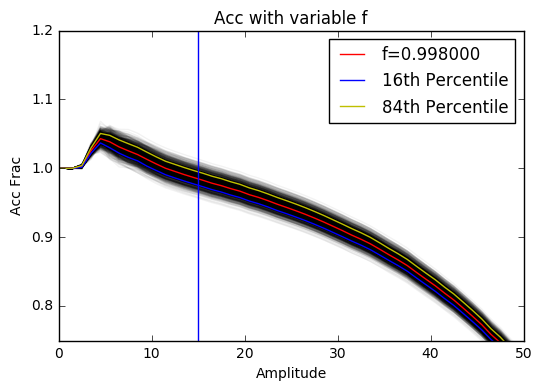

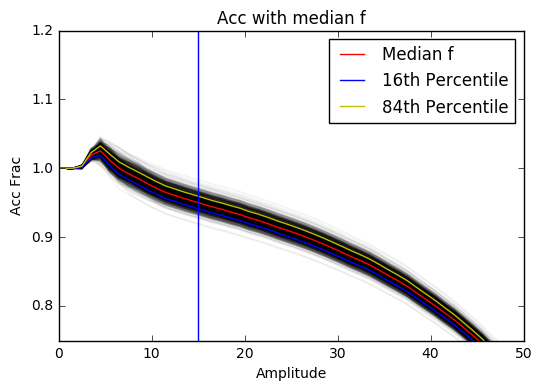

Mean:  0.0119284810836 0.0115878428975
Variable:  0.0114971738827 0.0113101641304
Median:  0.0104712711086 0.0102175359537


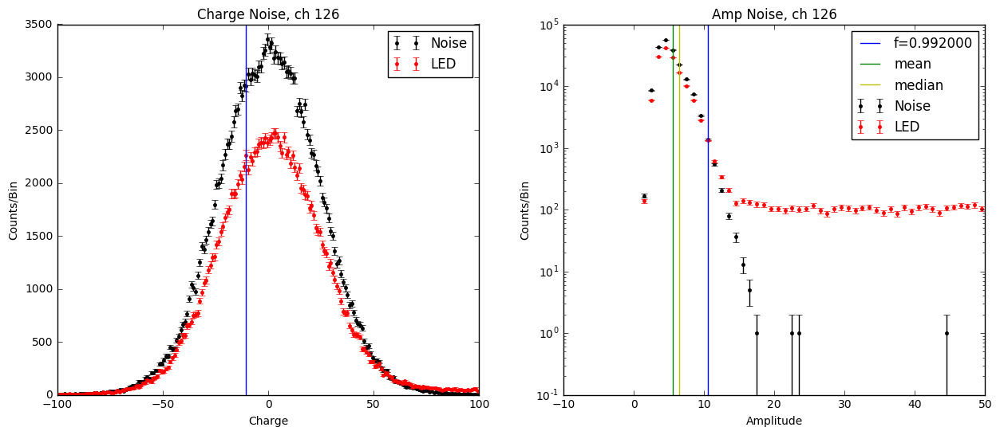

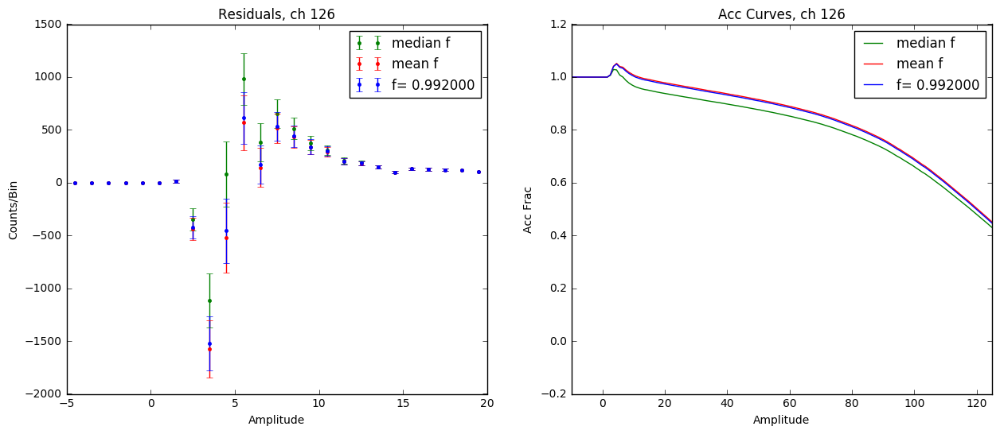

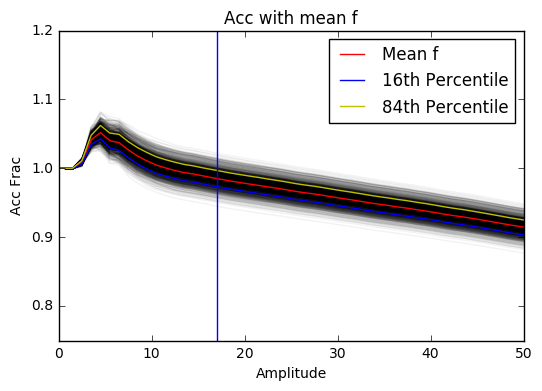

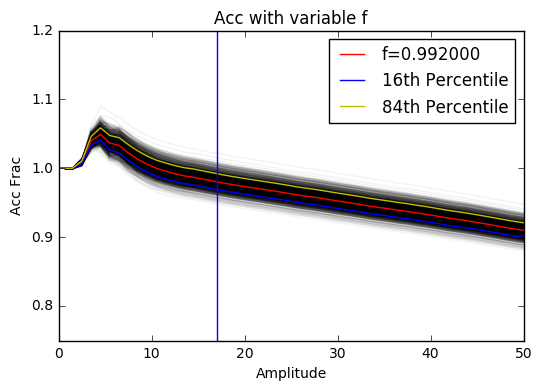

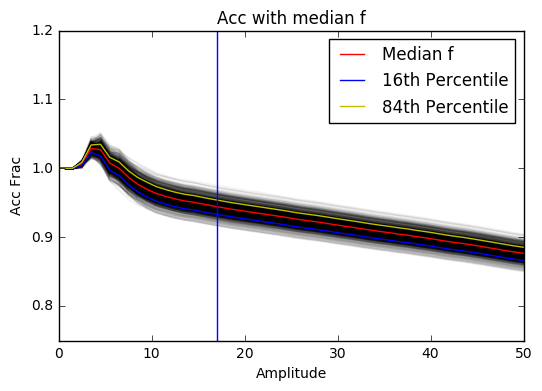

Mean:  0.0039466591928 0.00395564099463
Variable:  0.0037614600255 0.00383016918967
Median:  0.00359225361909 0.00389375508165


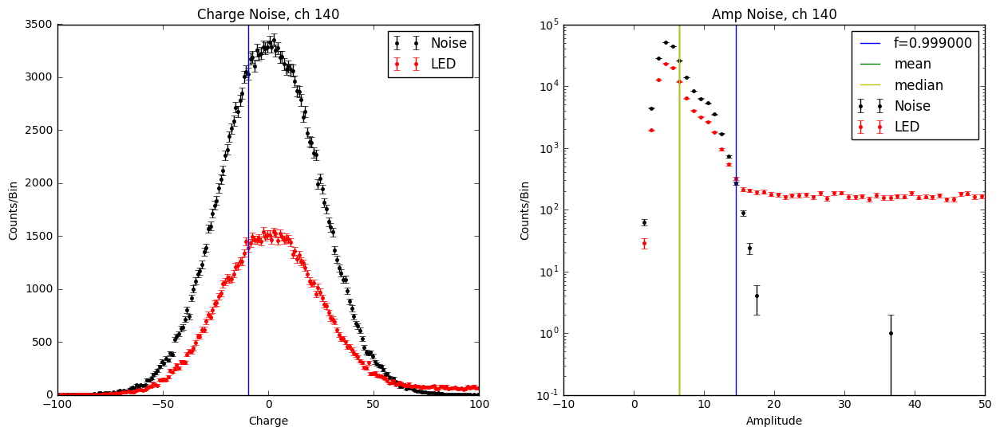

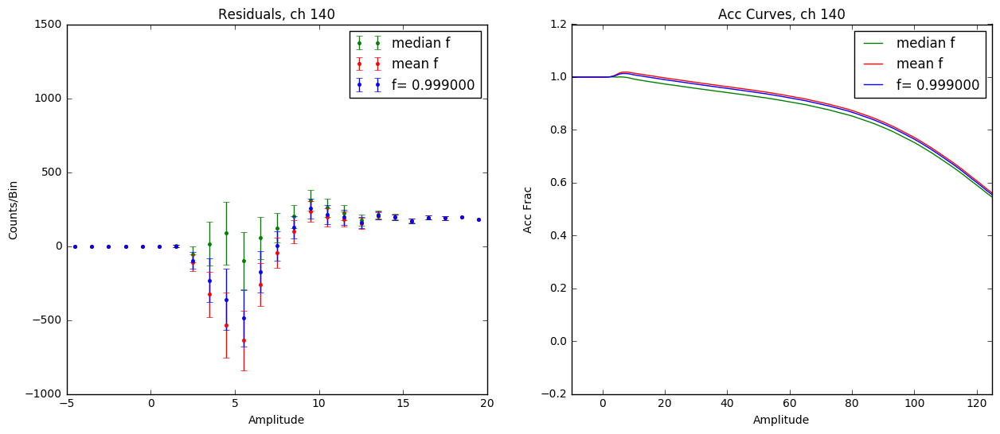

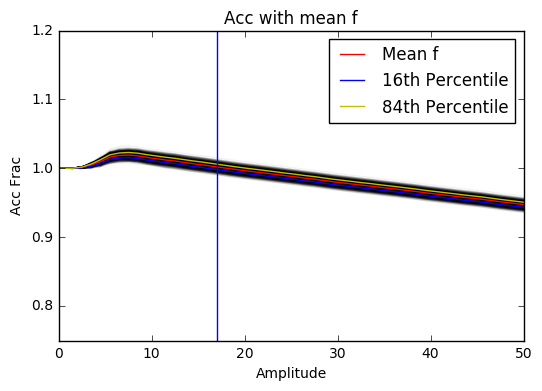

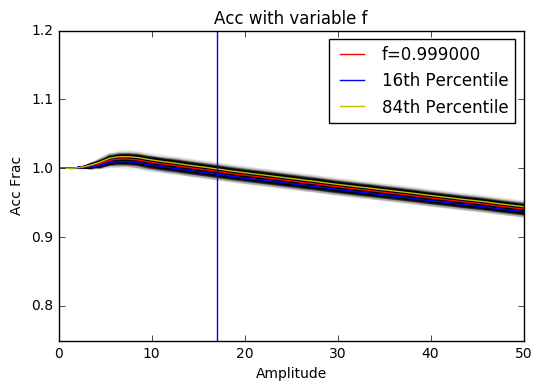

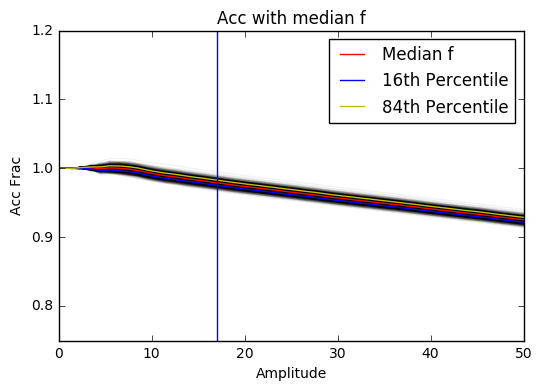

Mean:  0.00274446288292 0.00279228334767
Variable:  0.00266023775715 0.0026442952288
Median:  0.00281067192851 0.00279317560042


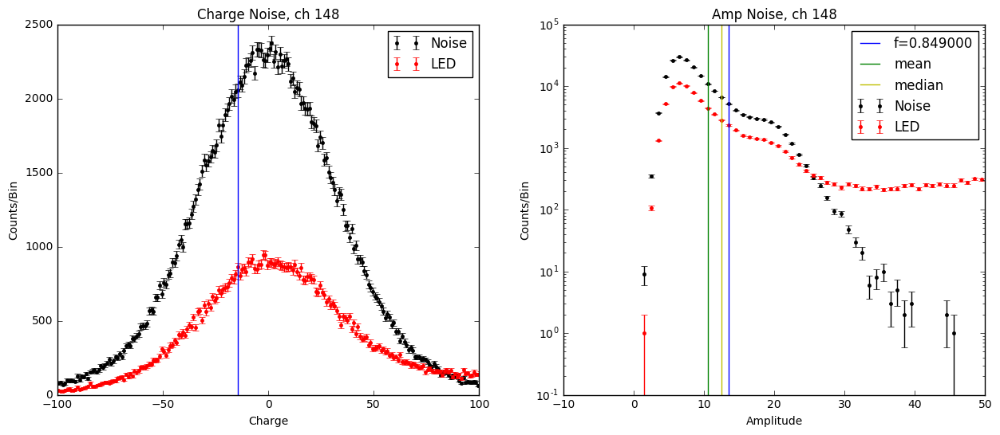

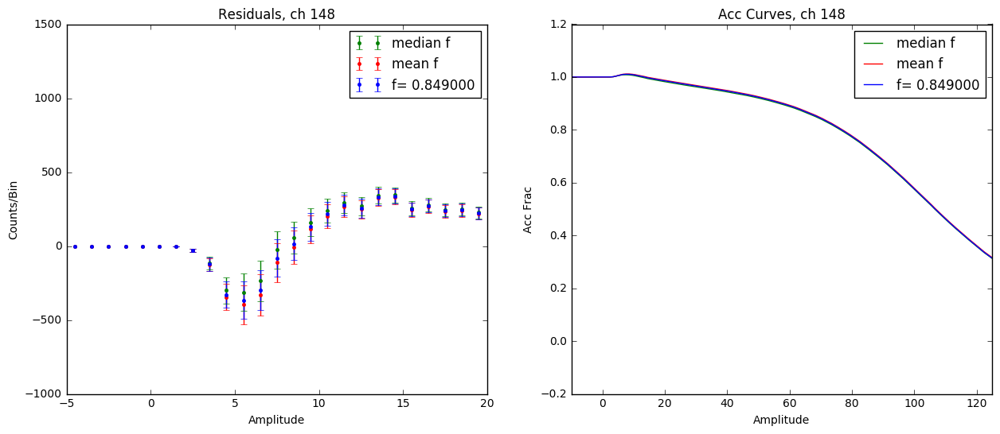

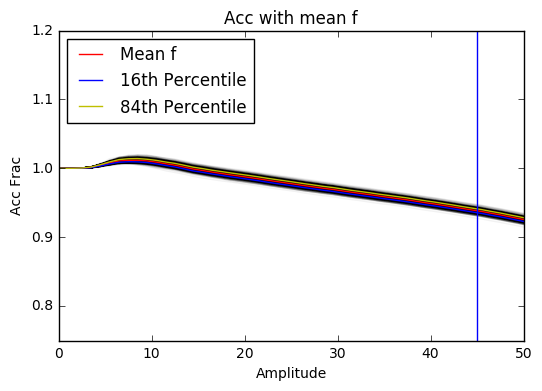

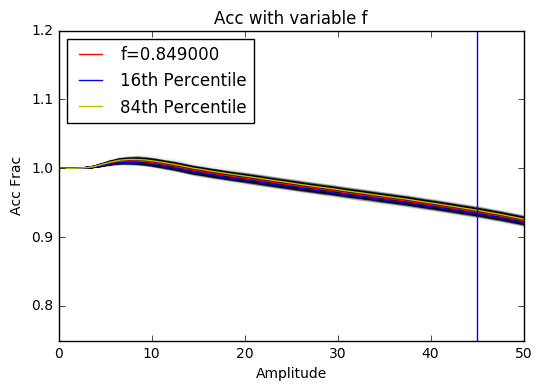

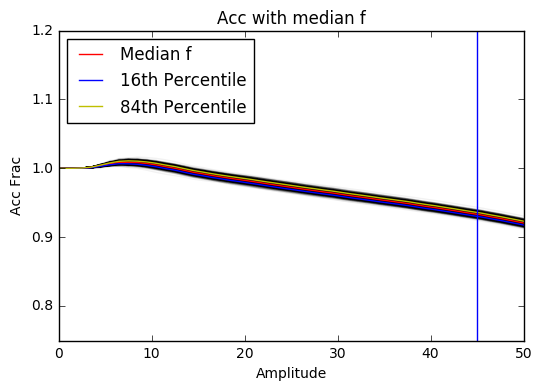

Mean:  0.00411699269389 0.00401933081386
Variable:  0.00371057177015 0.00393196586023
Median:  0.00344418549335 0.00361033110007


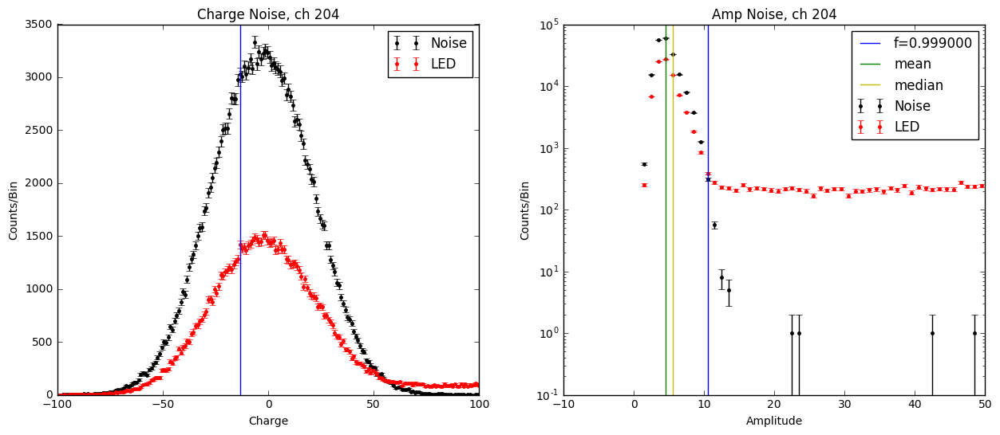

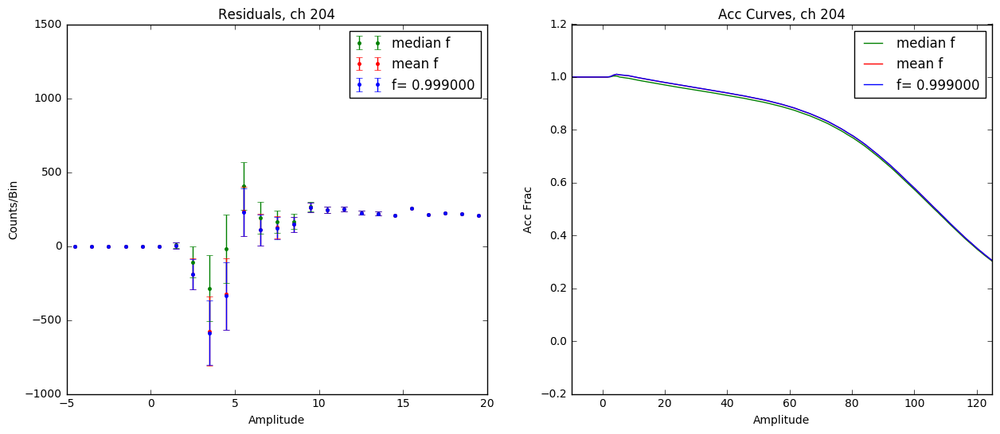

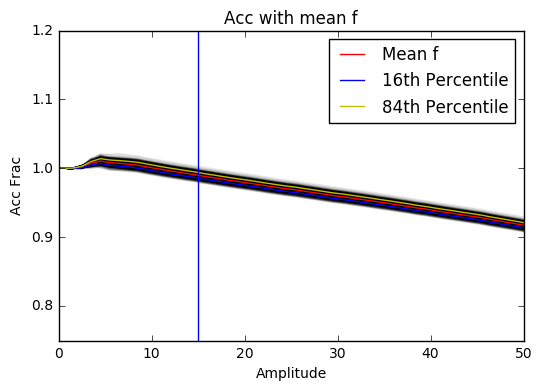

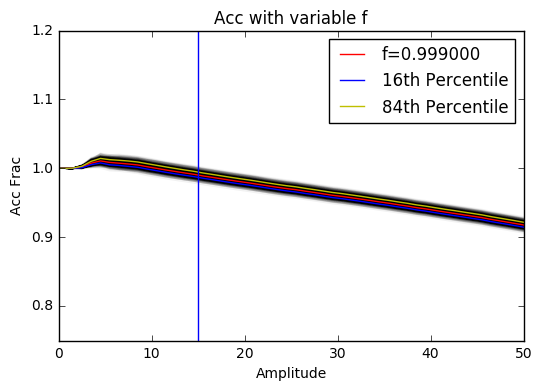

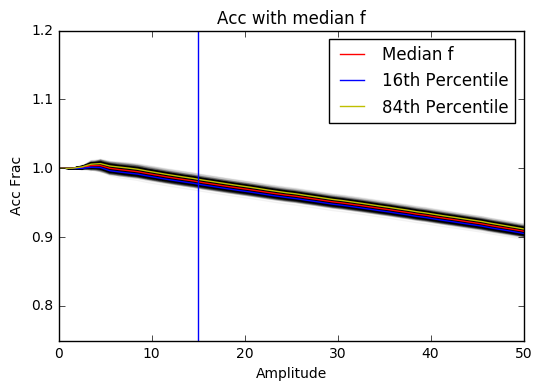

Mean:  0.00314533247702 0.00325373000027
Variable:  0.00304374692202 0.00319822719587
Median:  0.00317299974947 0.00296961367419


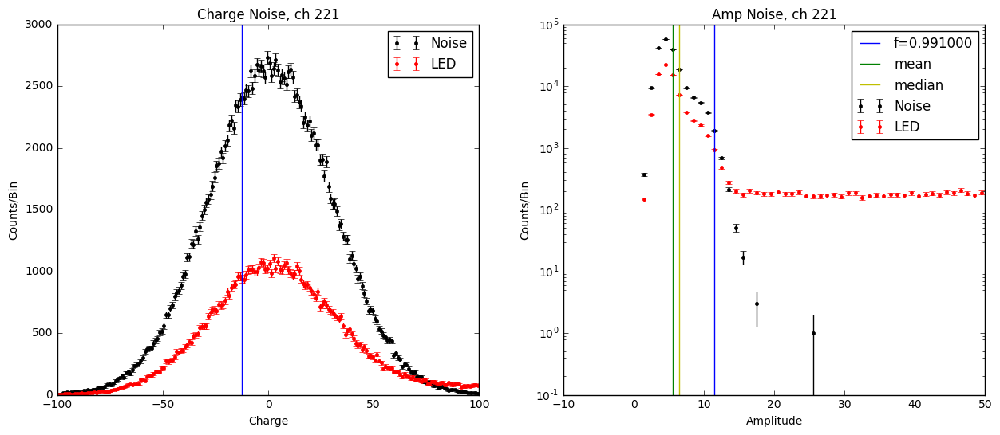

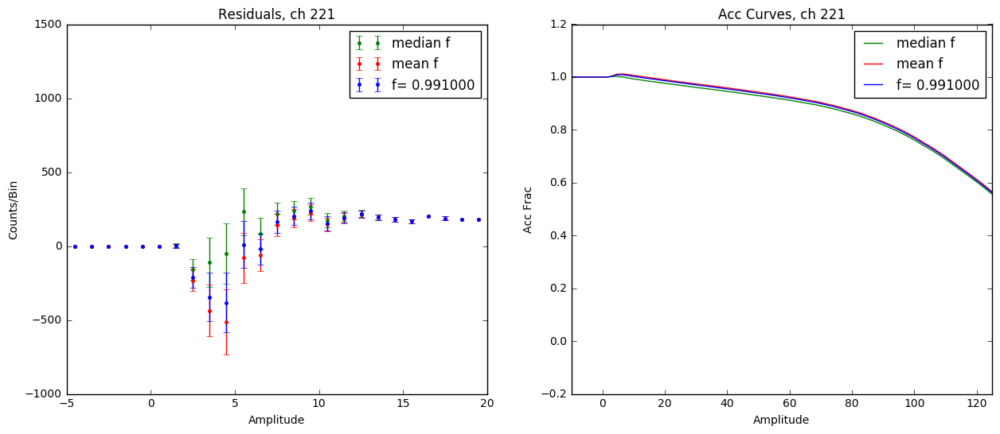

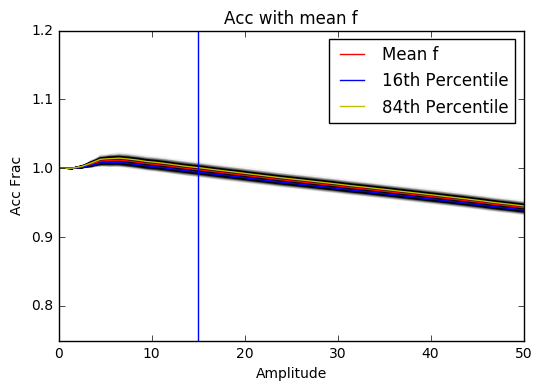

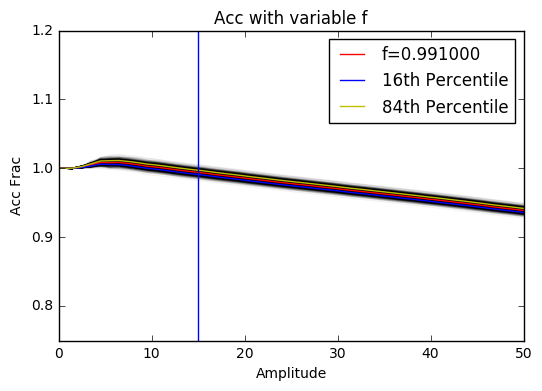

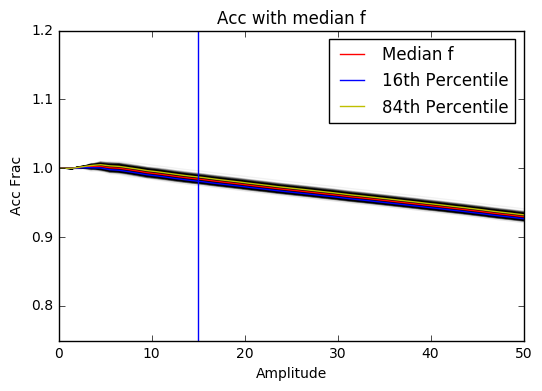

Mean:  0.00379981248809 0.00356729903726
Variable:  0.00330024535408 0.00326646919258
Median:  0.00344967565229 0.00328182105331


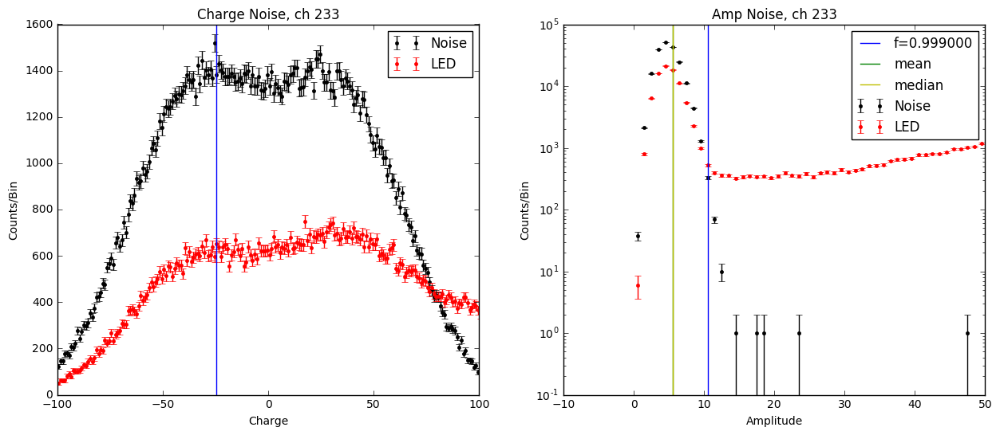

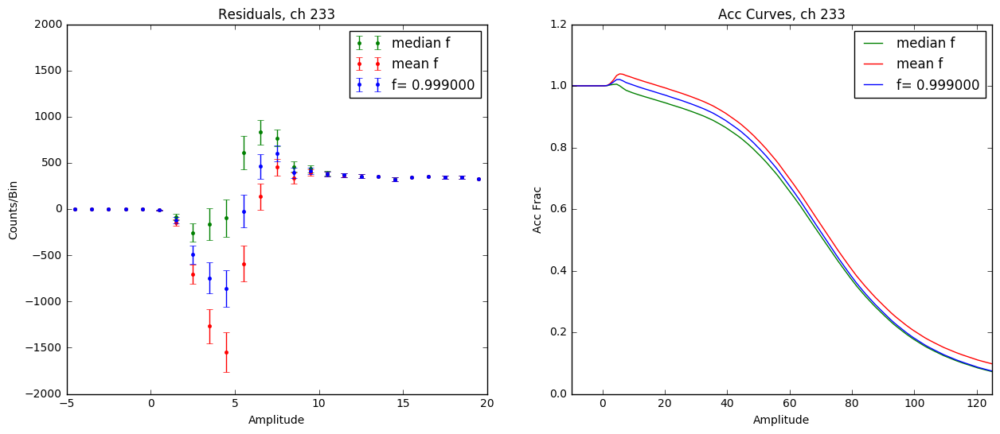

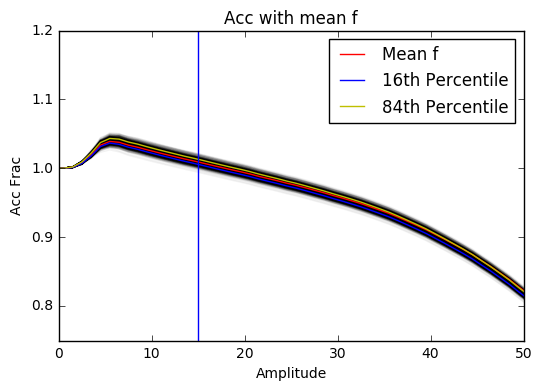

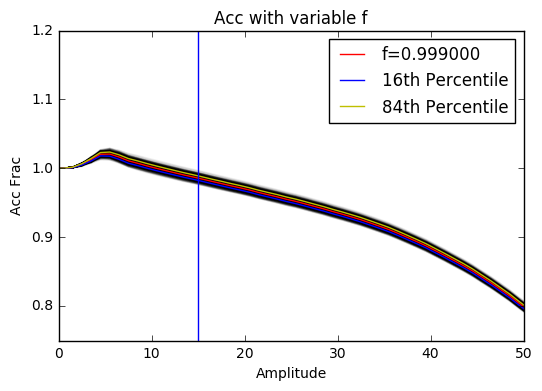

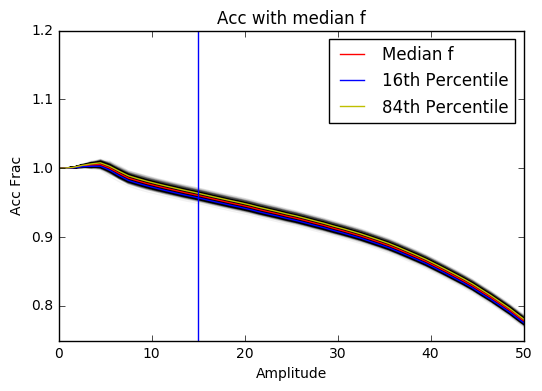

Mean:  0.00429583967369 0.00405223656972
Variable:  0.00393678680606 0.0037610926659
Median:  0.003637095398 0.00401682969698


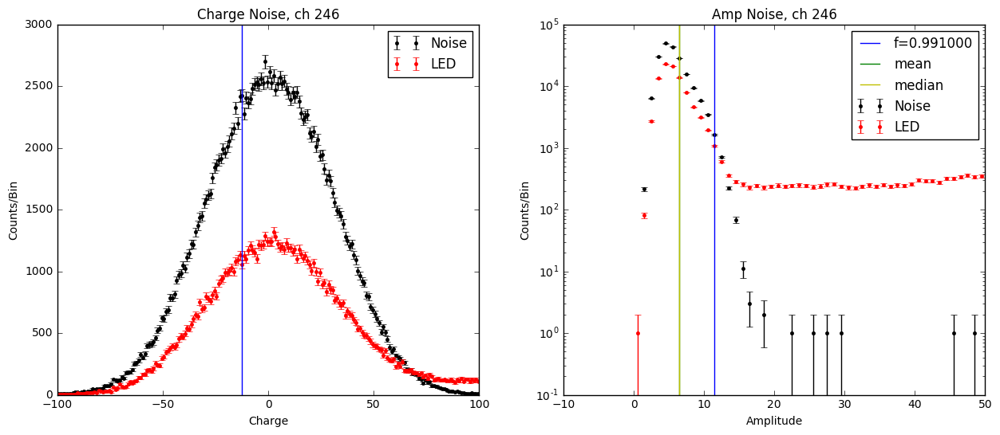

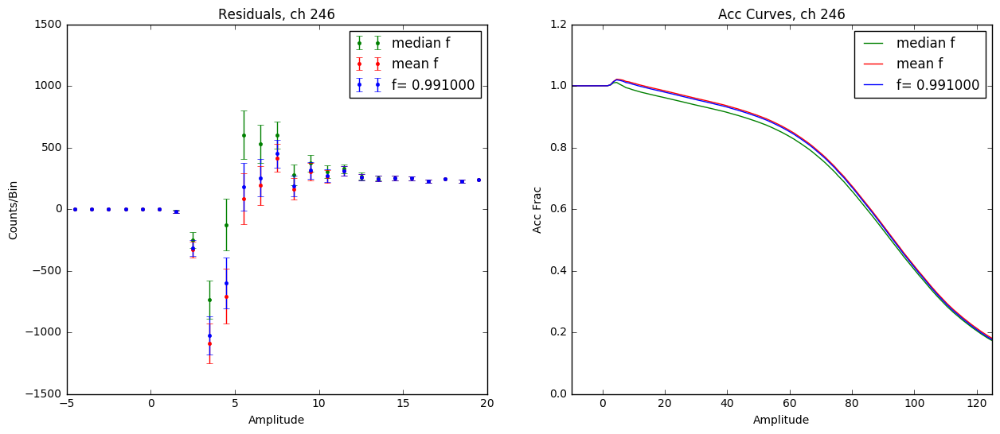

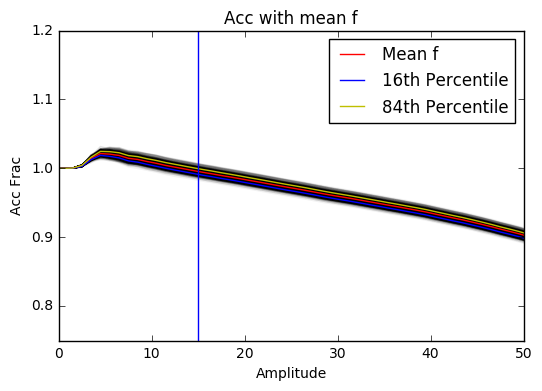

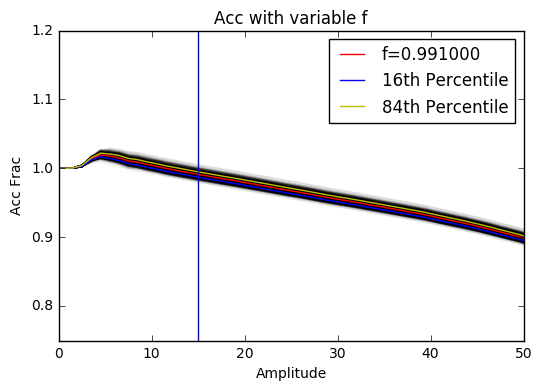

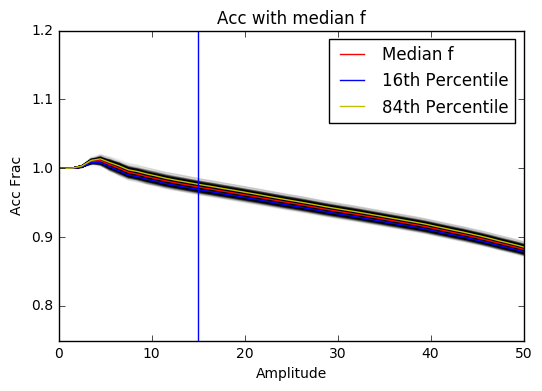

In [ ]:
high_t_ch=[38,64,66,67,89,108,110,120,126,140,148,204,221,233,246] 
for ch in high_t_ch:
    plot_thresh(ch, noise, noise_amp, noise_errs, amp_noise_errs, led, led_amp, led_errs, amp_led_errs)

/cvmfs/xenon.opensciencegrid.org/releases/anaconda/2.4/envs/pax_v6.8.0/lib/python3.4/site-packages/ipykernel/__main__.py:32: RuntimeWarning: invalid value encountered in true_divide
/cvmfs/xenon.opensciencegrid.org/releases/anaconda/2.4/envs/pax_v6.8.0/lib/python3.4/site-packages/ipykernel/__main__.py:35: RuntimeWarning: invalid value encountered in true_divide
/cvmfs/xenon.opensciencegrid.org/releases/anaconda/2.4/envs/pax_v6.8.0/lib/python3.4/site-packages/ipykernel/__main__.py:38: RuntimeWarning: invalid value encountered in true_divide


Mean:  0.0153015493815 0.0157865138453
Variable:  0.0140058284905 0.0133708461029
Median:  0.0143417432303 0.0143599655785


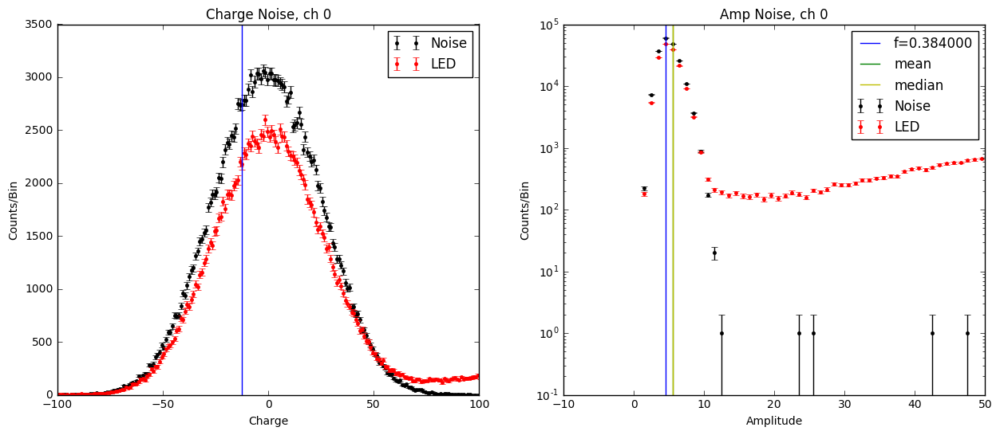

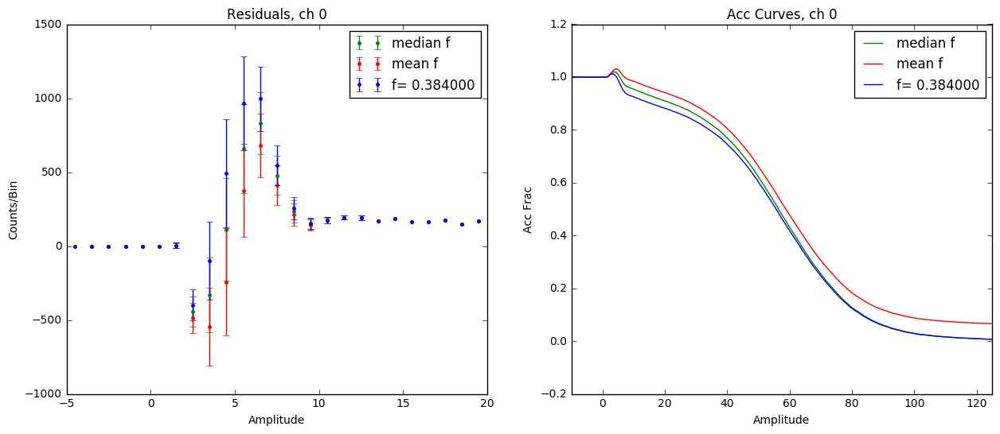

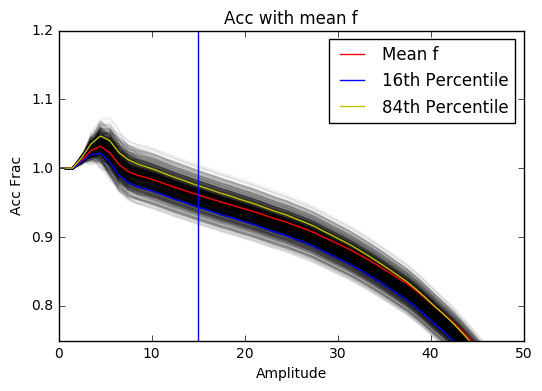

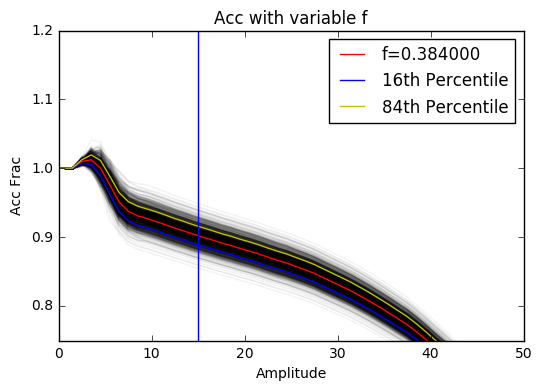

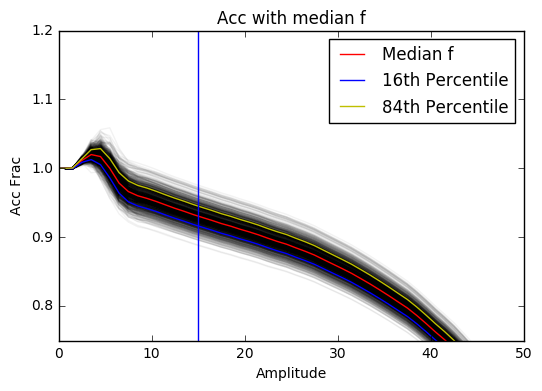

ch 1 is off
ch 2 is off
Mean:  0.0156709559269 0.0163074630191
Variable:  0.0134669315089 0.0136463196121
Median:  0.0157383541728 0.0160576777274


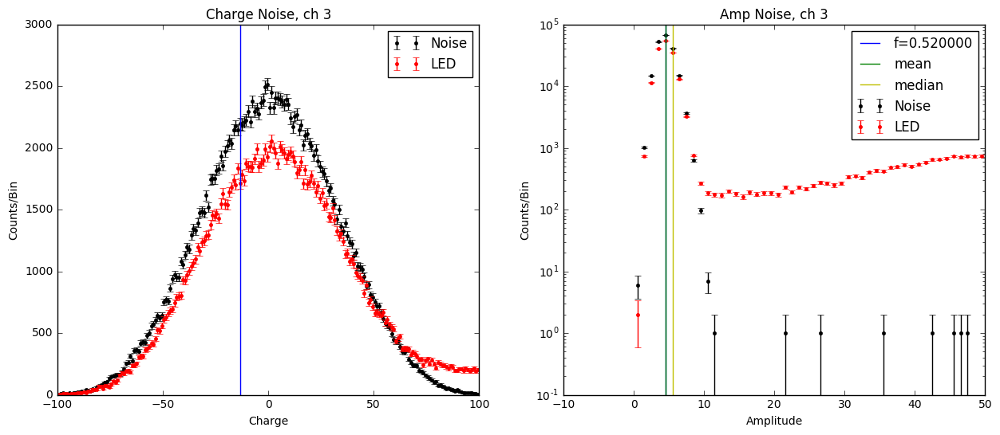

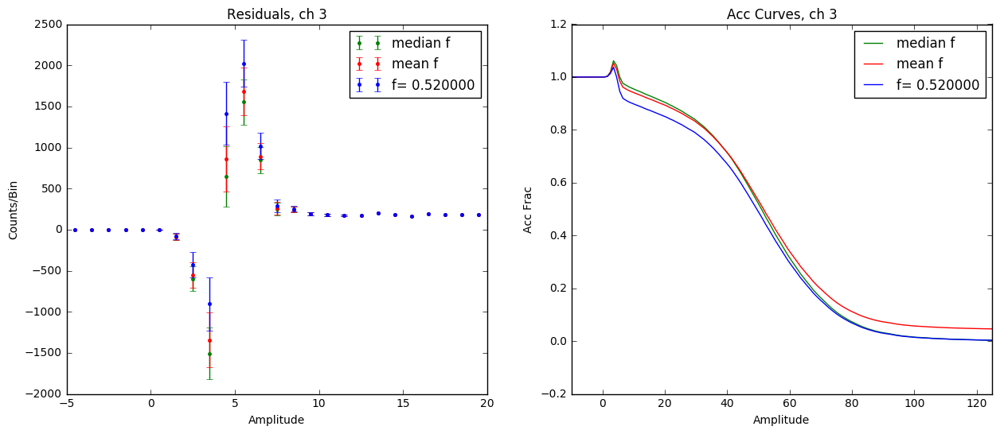

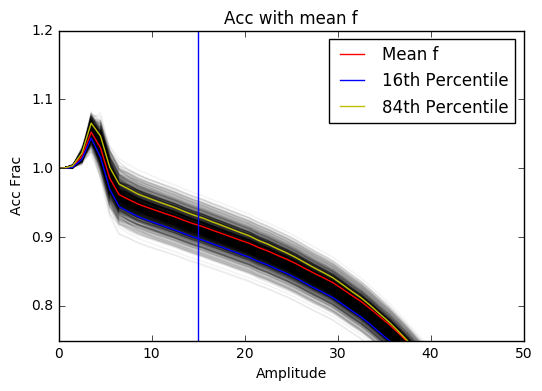

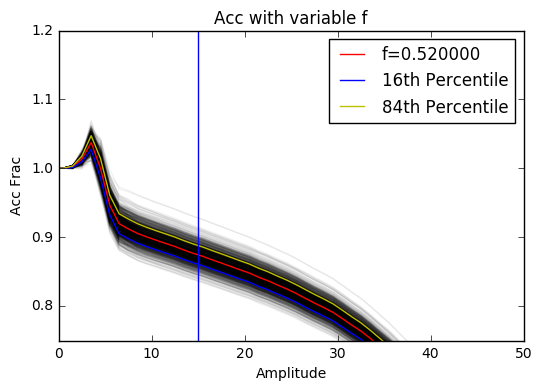

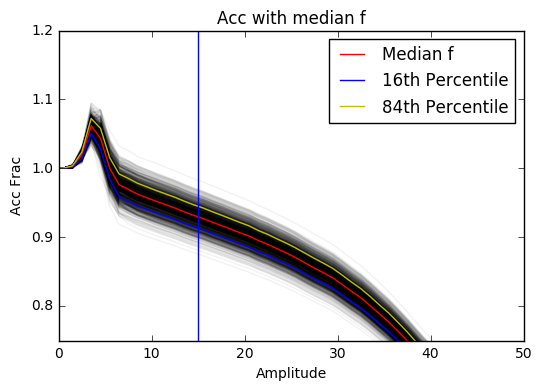

Mean:  0.0132884366079 0.012772032235
Variable:  0.011523167456 0.0116242061549
Median:  0.0110474691665 0.010474667097


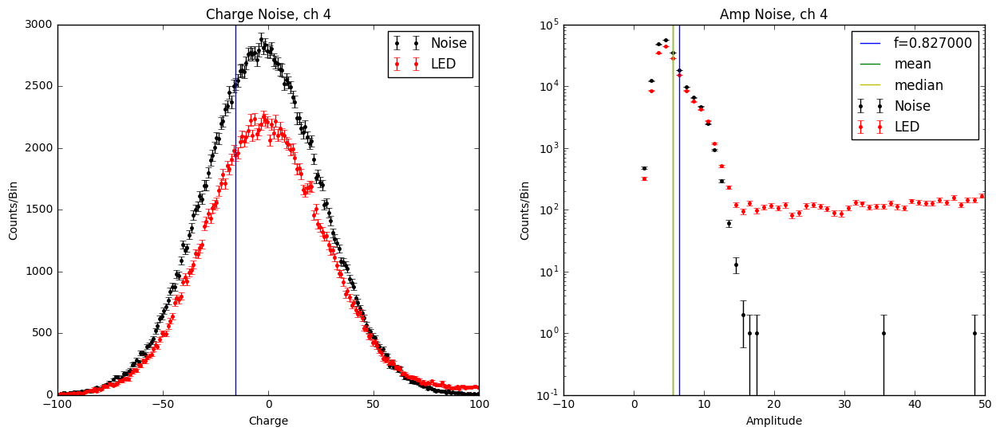

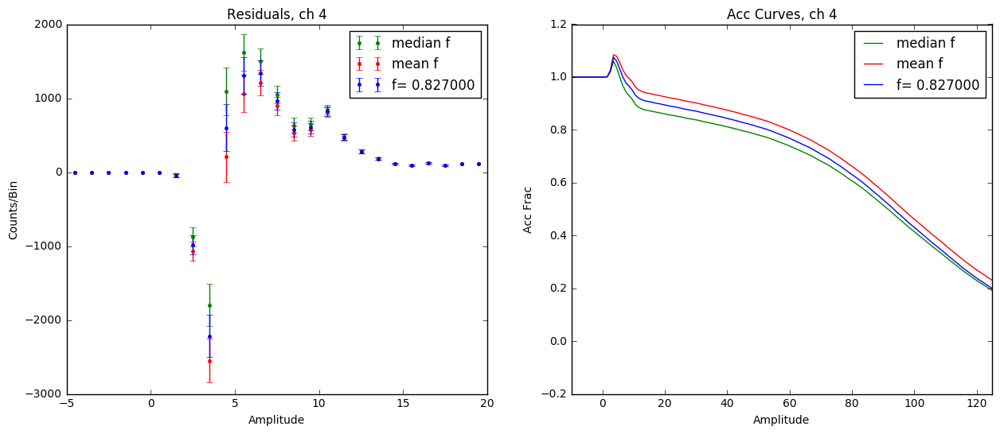

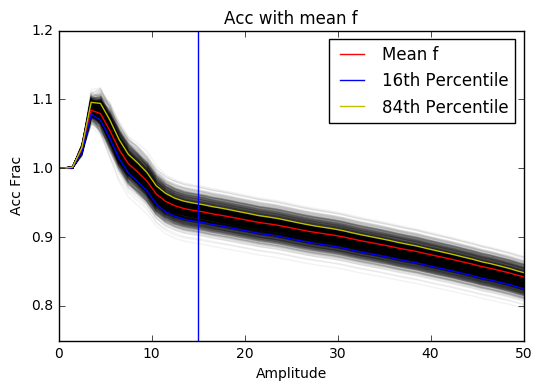

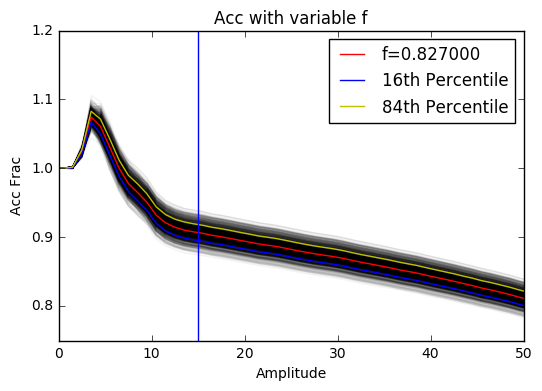

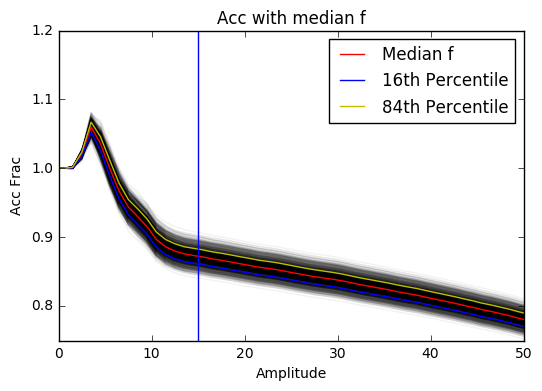

Mean:  0.0222826486298 0.0227663365691
Variable:  0.0174587322129 0.0174493135734
Median:  0.0153510912841 0.0148953398821


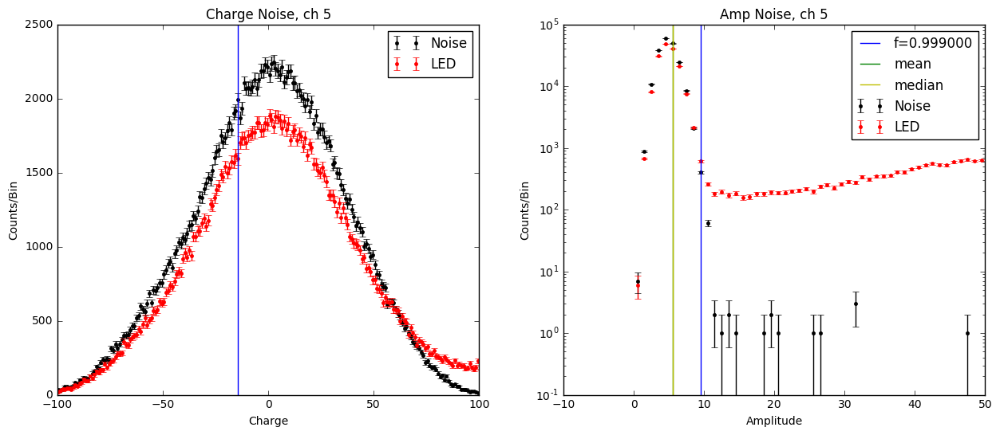

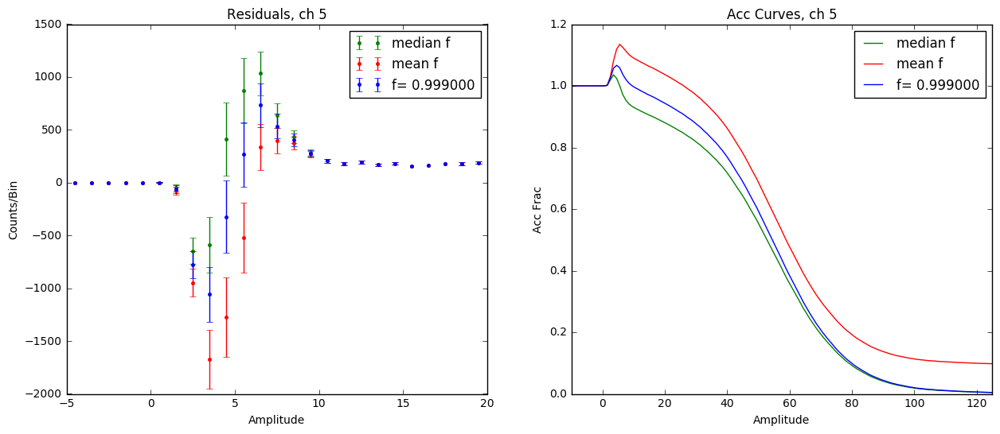

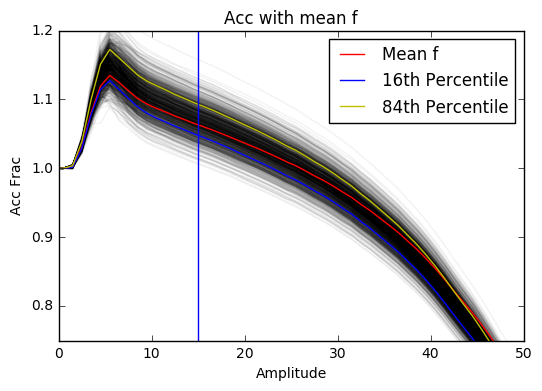

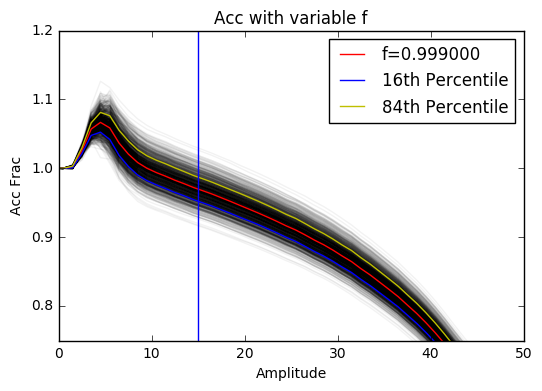

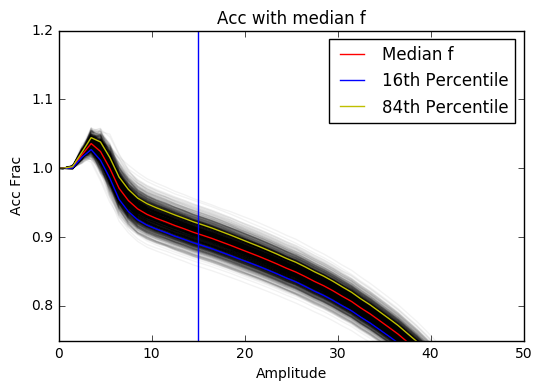

Mean:  0.0158289901906 0.0152408616758
Variable:  0.0161146024618 0.0163512404805
Median:  0.0162129604478 0.0172215387732


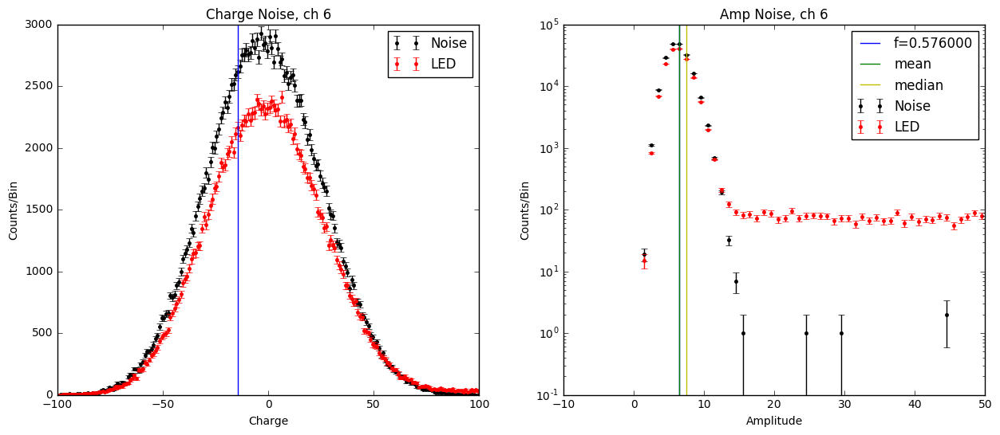

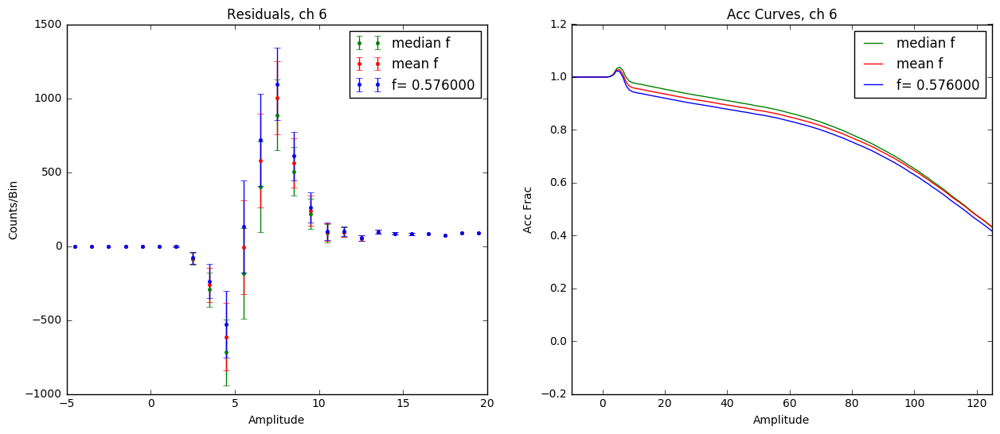

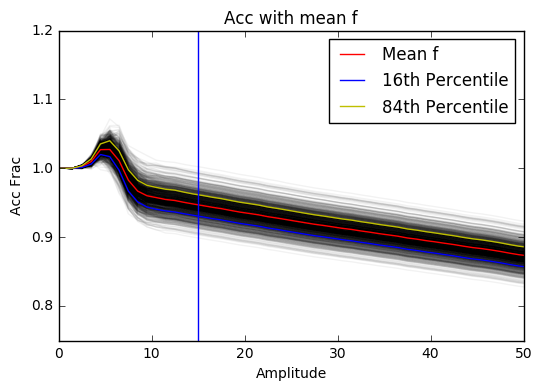

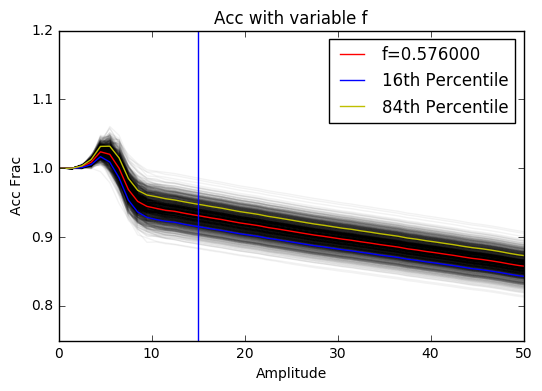

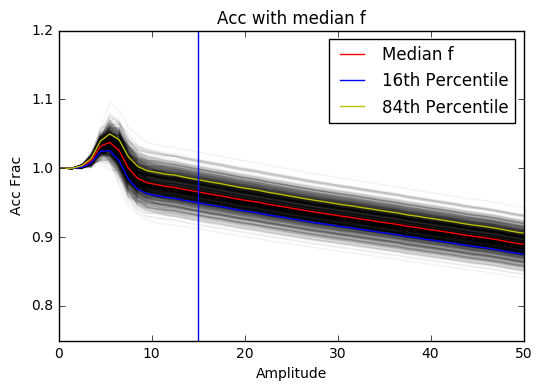

Mean:  0.020244062885 0.0202651715377
Variable:  0.0176146351396 0.0182918499267
Median:  0.0182351082253 0.0179964612348


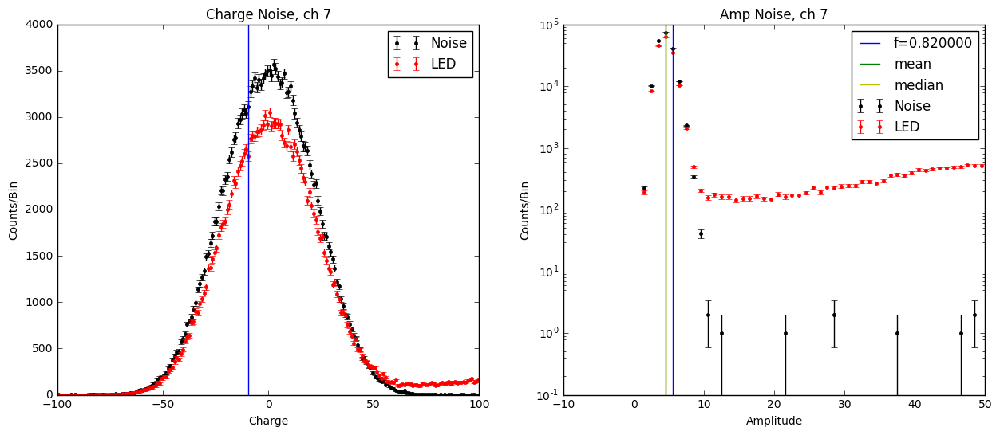

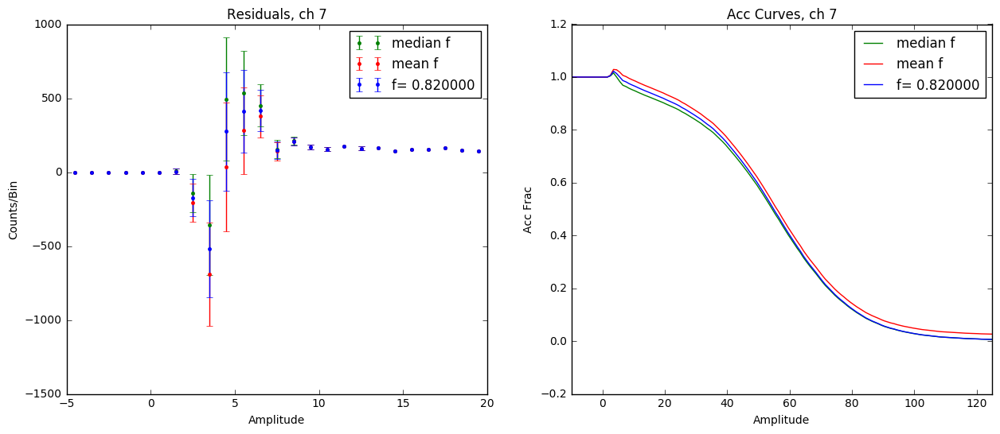

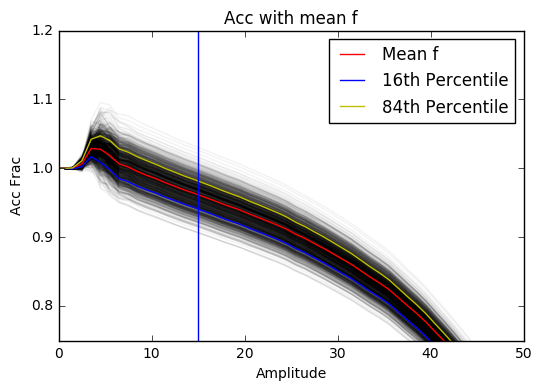

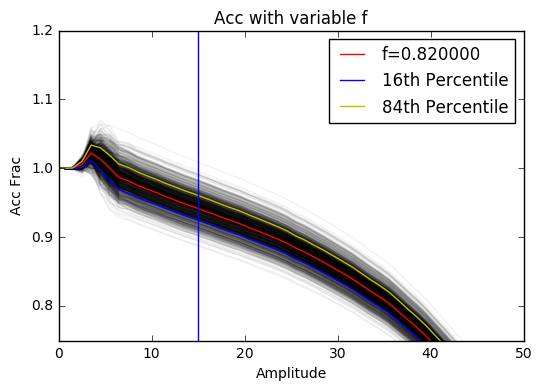

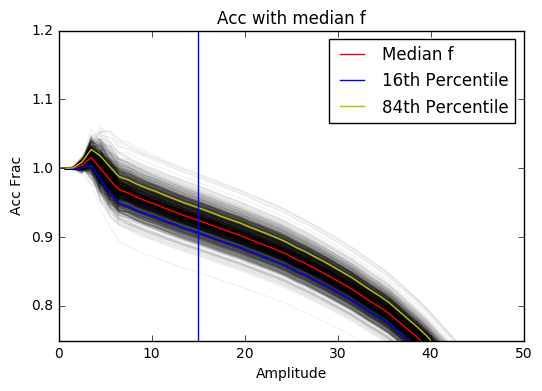

Mean:  0.019069072635 0.0188906821509
Variable:  0.0211542625975 0.0218936655237
Median:  0.0182305367618 0.0183753062574


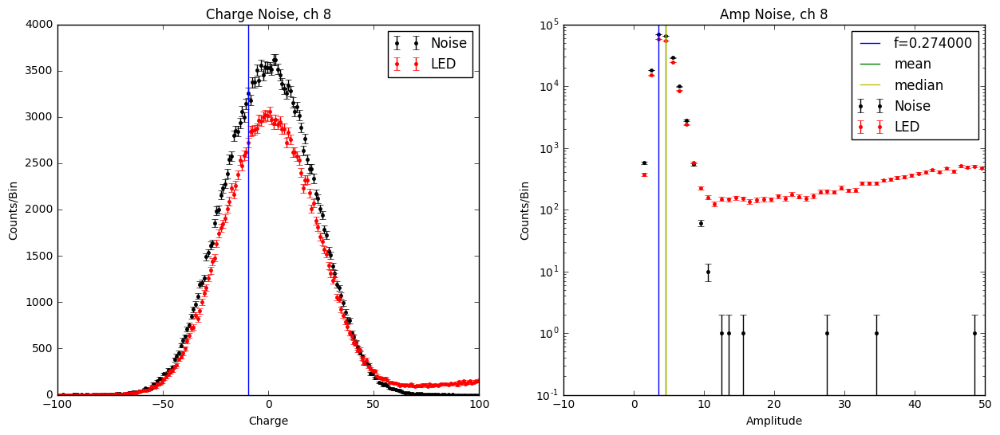

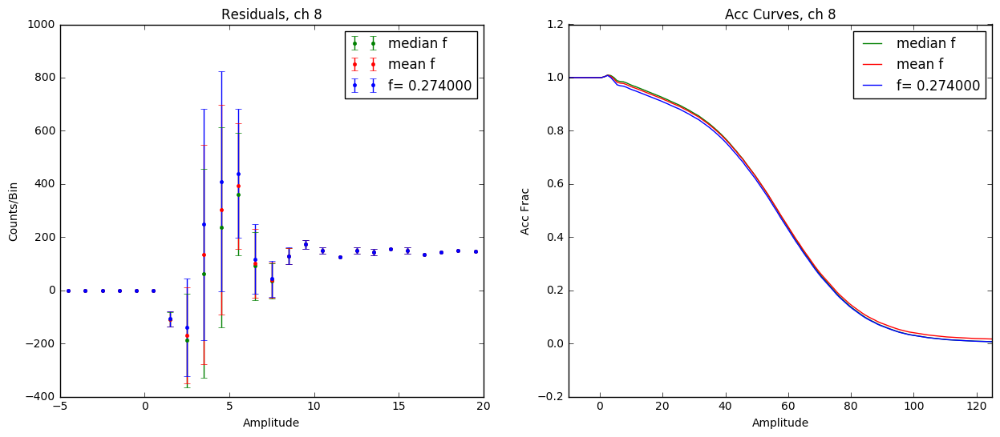

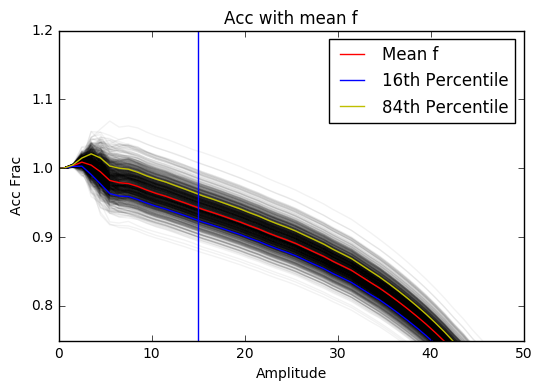

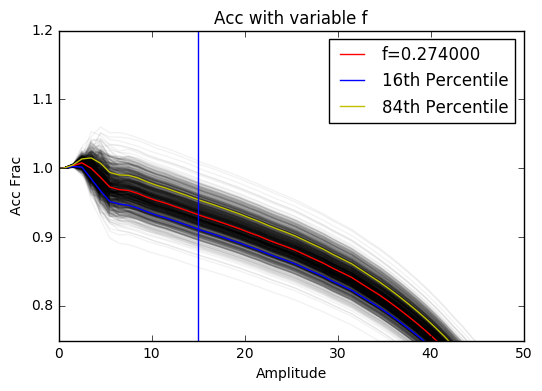

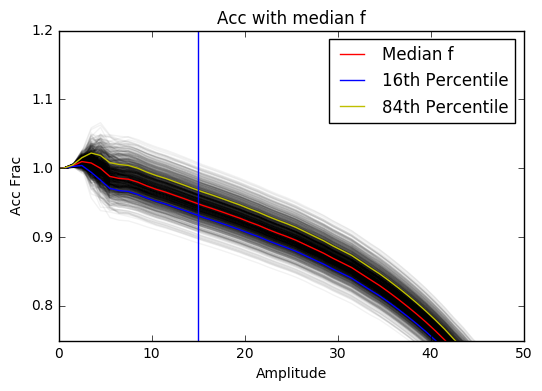

Mean:  0.0198992783667 0.0188709397311
Variable:  0.0180805921813 0.0180459596578
Median:  0.0173410018985 0.0176147246691


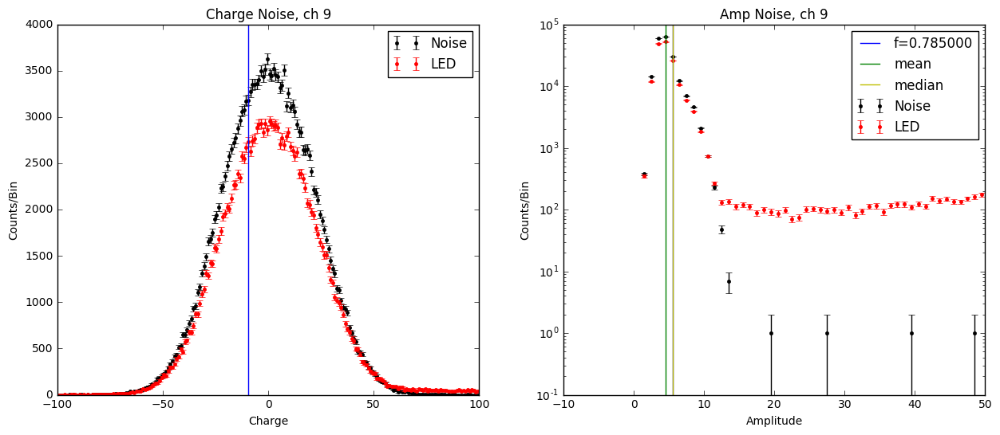

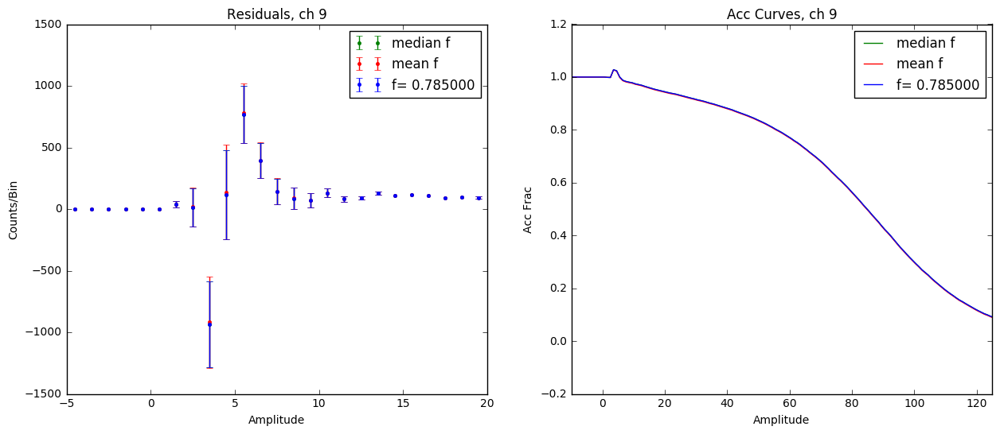

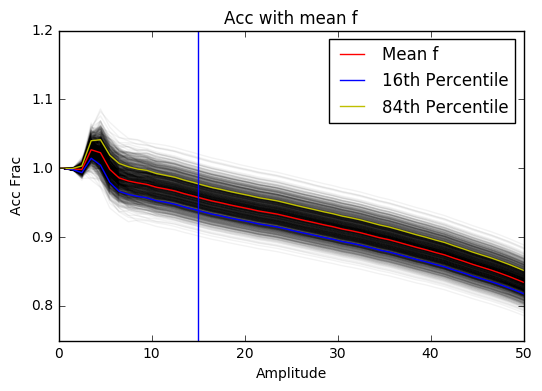

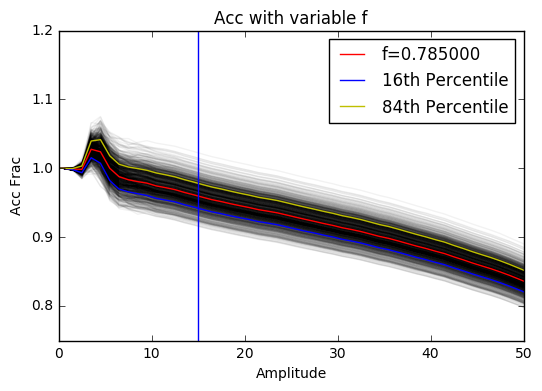

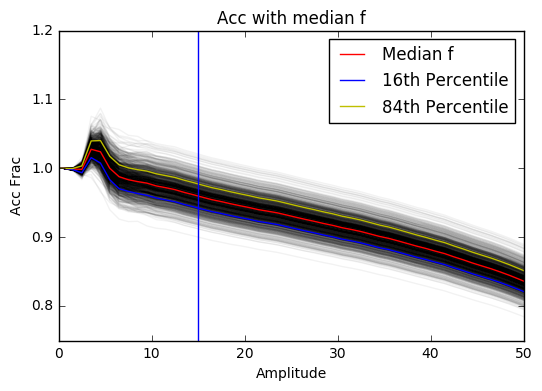

Mean:  0.0172438002528 0.0166334230772
Variable:  0.0166603418928 0.0155054058727
Median:  0.014899612503 0.015748442897


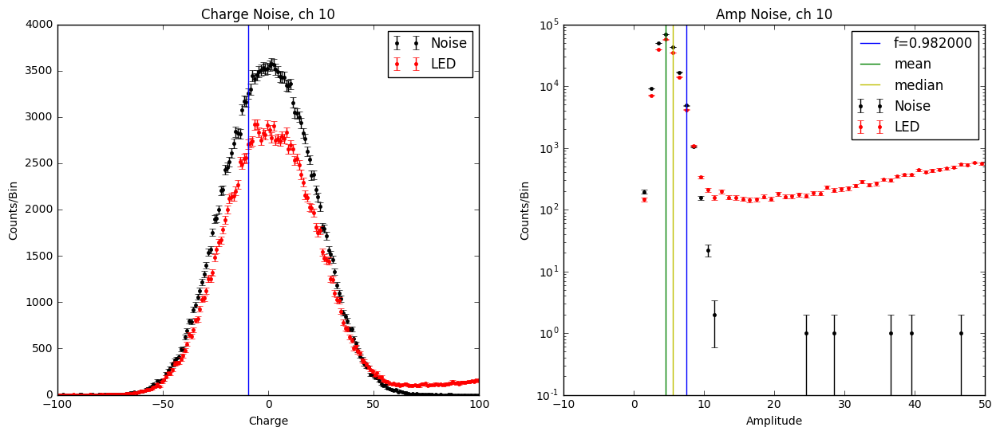

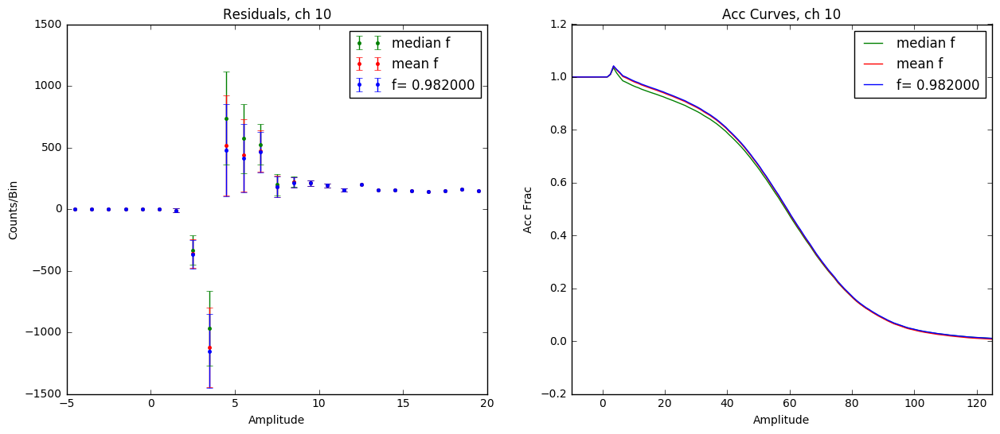

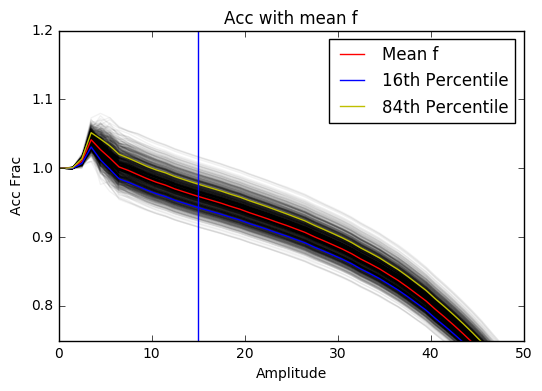

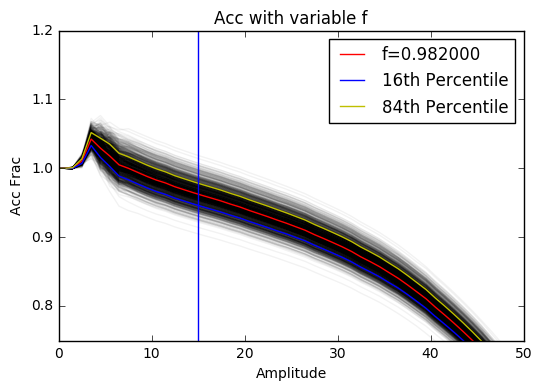

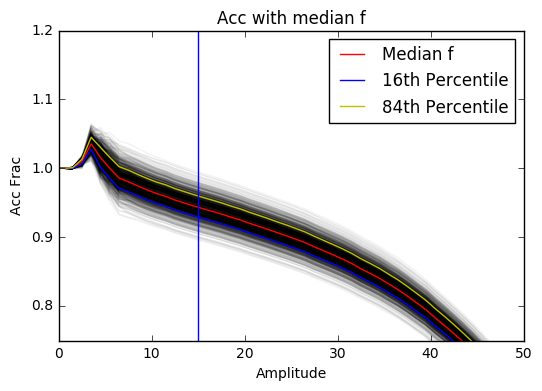

Mean:  0.0183142782119 0.0181520205275
Variable:  0.016505590535 0.0161207543293
Median:  0.018011470191 0.0171460188902


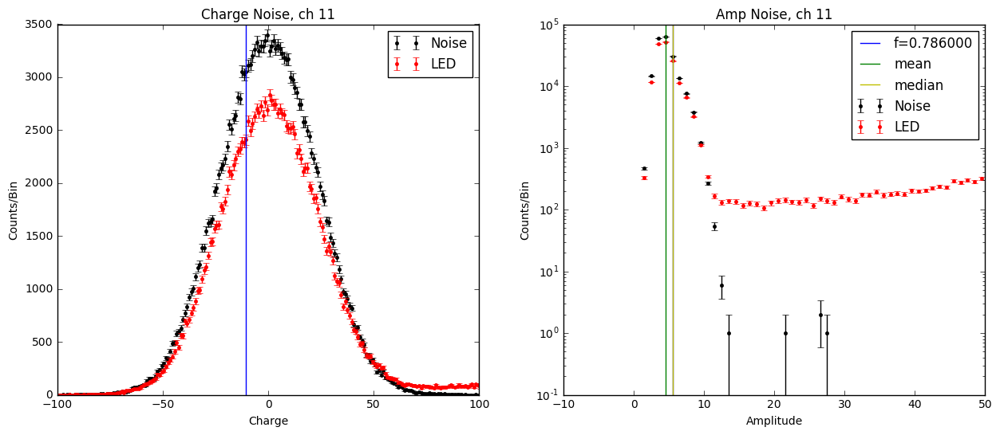

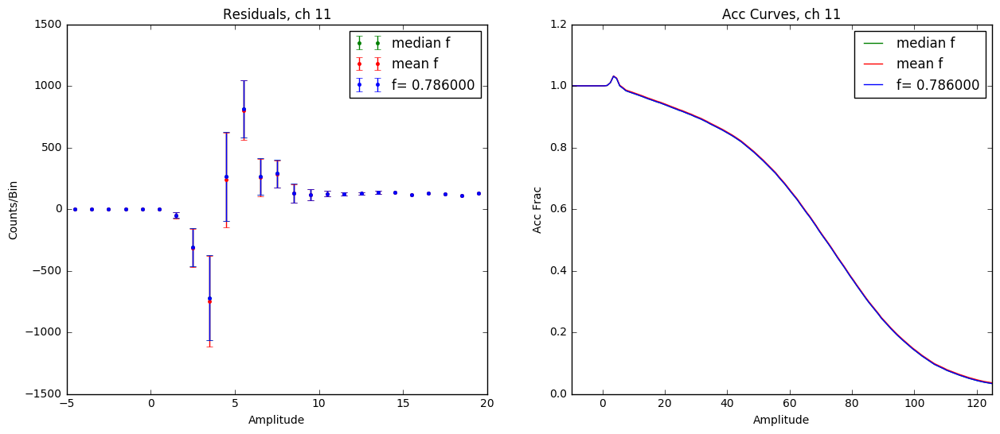

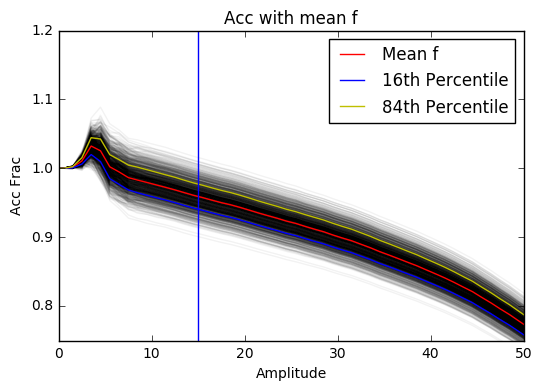

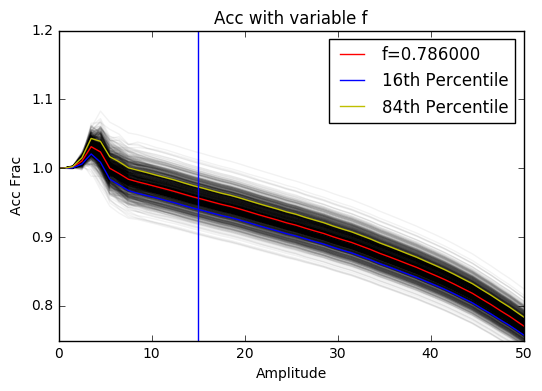

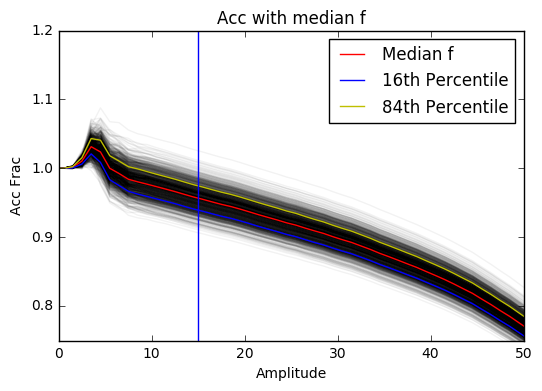

Mean:  0.0185275607919 0.0181149723446
Variable:  0.0166321050439 0.0170336466545
Median:  0.0171577245251 0.0173943698983


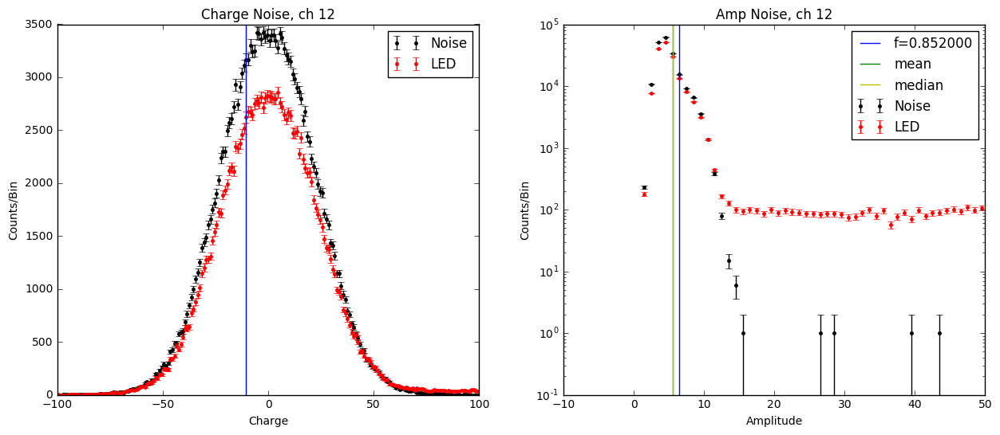

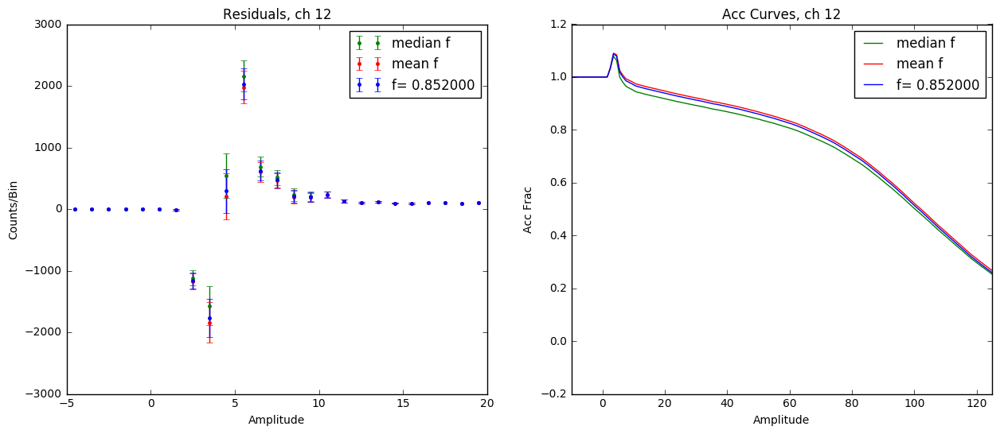

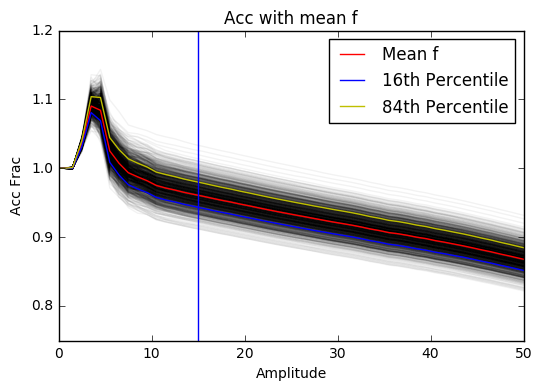

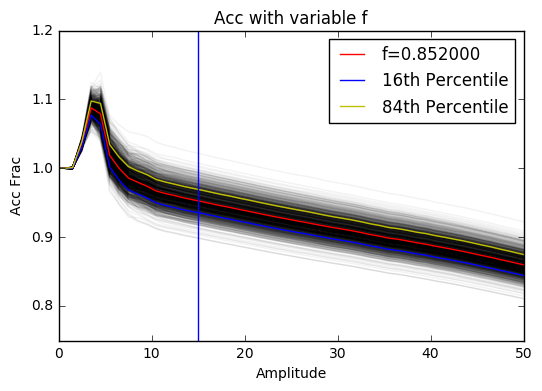

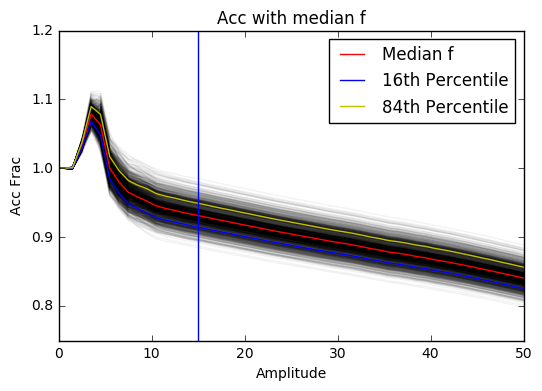

Mean:  0.0162570476389 0.0163487364481
Variable:  0.0160959679454 0.0160580193744
Median:  0.0152203506498 0.015146042222


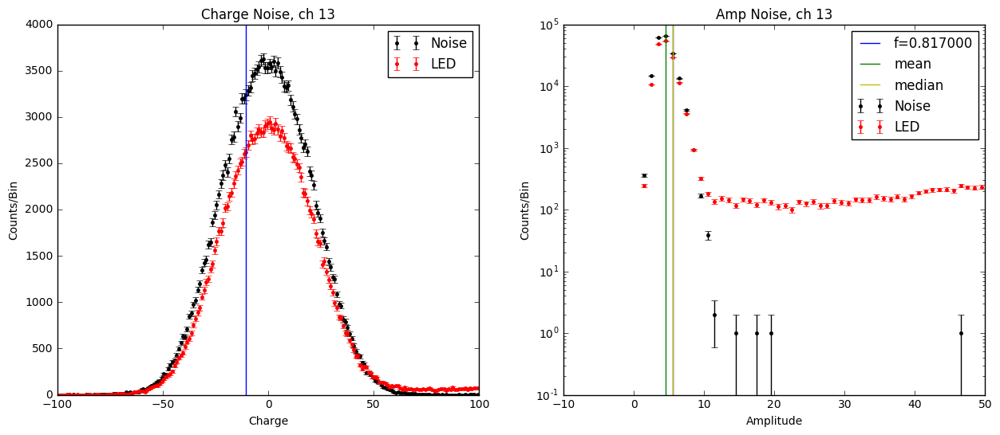

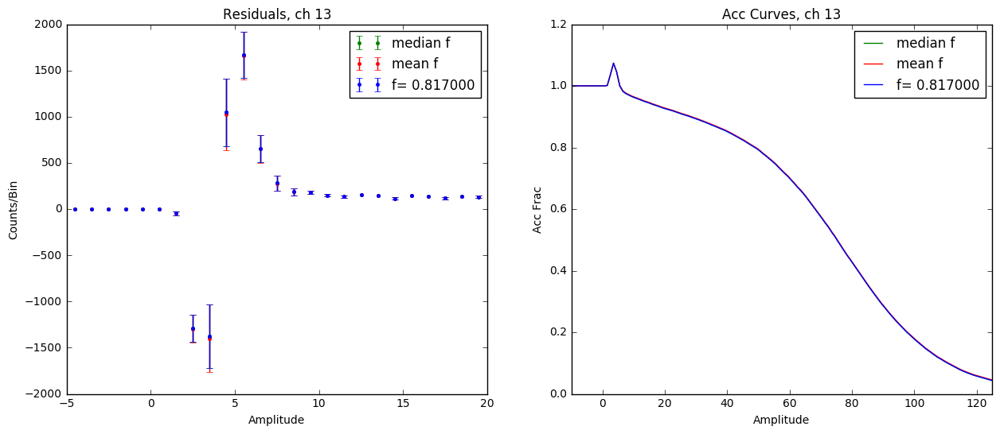

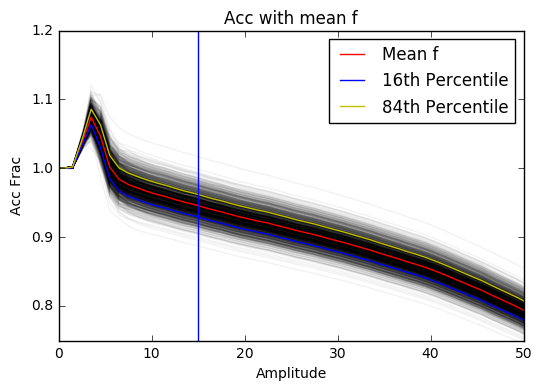

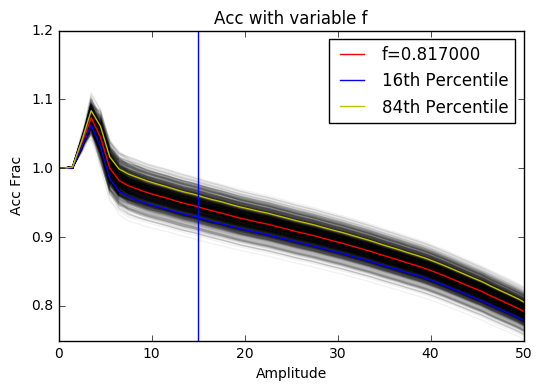

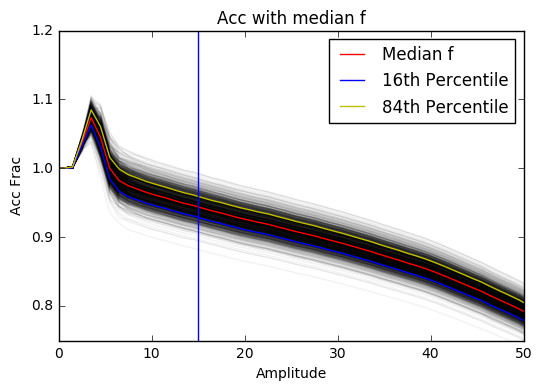

Mean:  0.0182924267374 0.0190723968316
Variable:  0.0159344148819 0.0163552896713
Median:  0.0165720055086 0.0158601715983


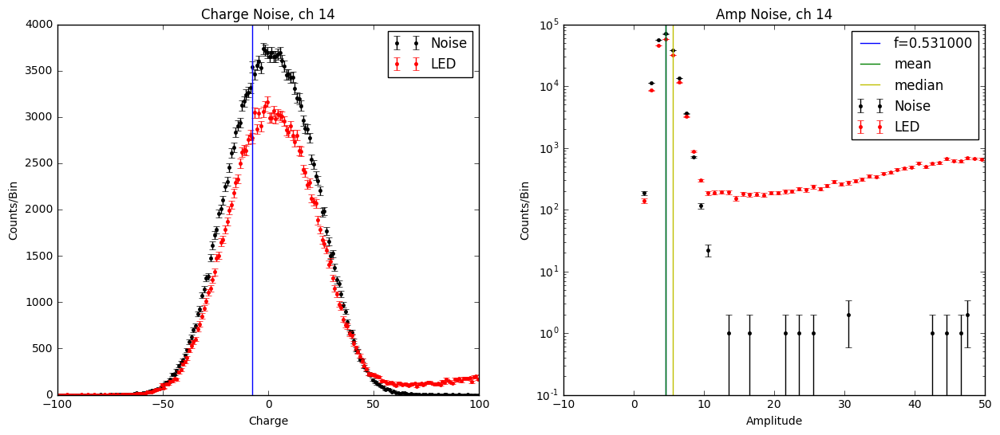

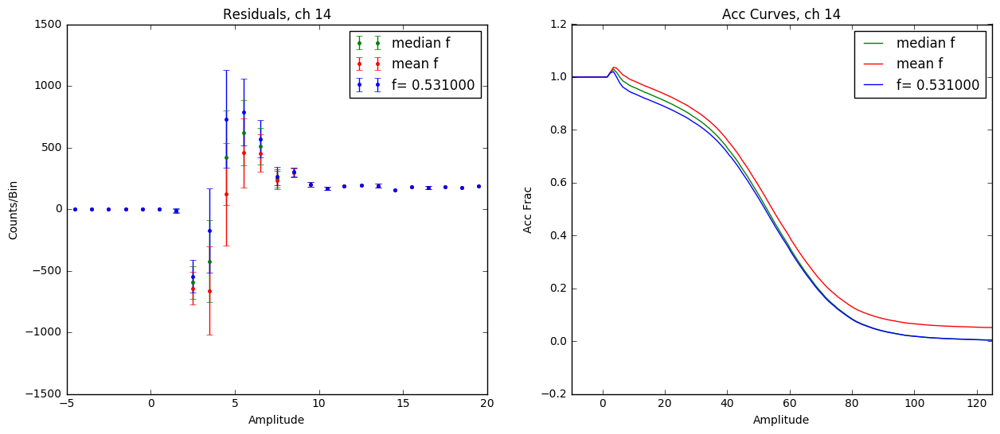

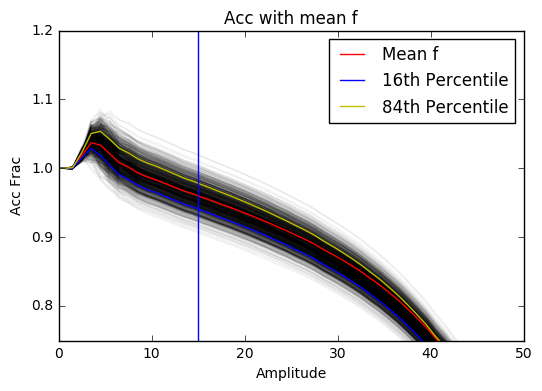

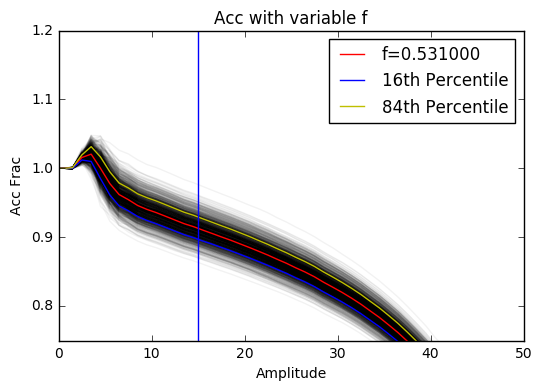

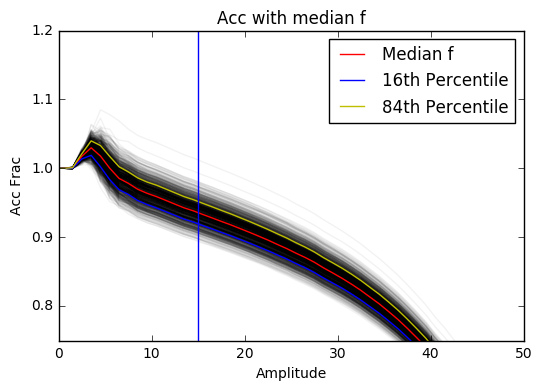

Mean:  0.0169733282308 0.0182937960723
Variable:  0.0165176771684 0.0155903465858
Median:  0.0149906058335 0.0160832763018


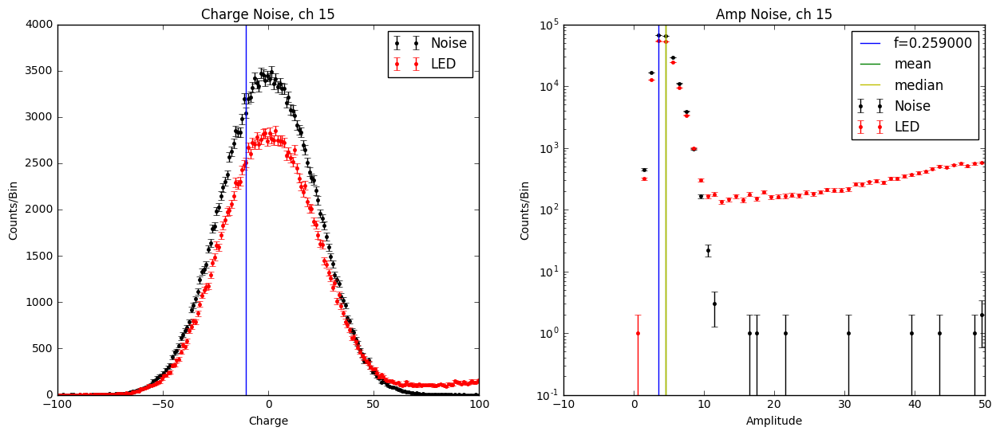

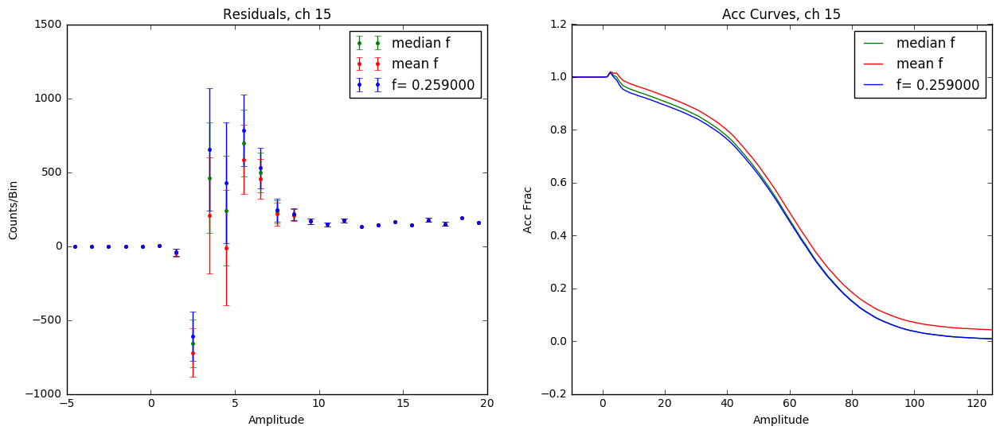

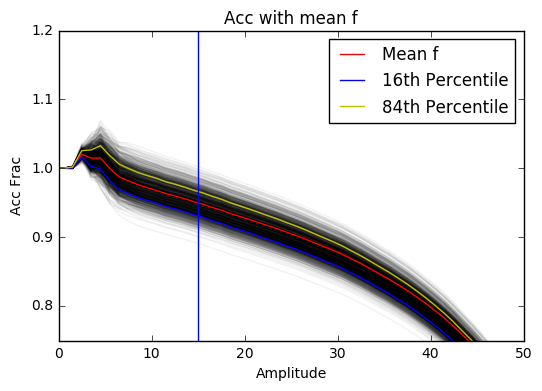

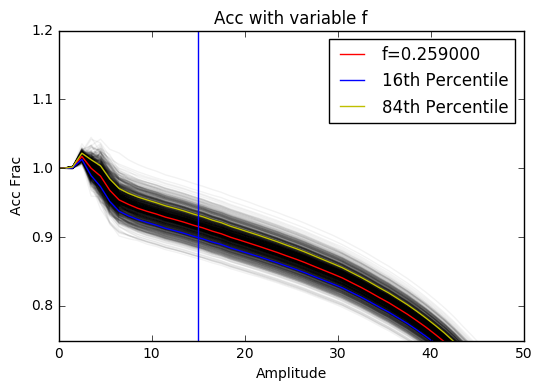

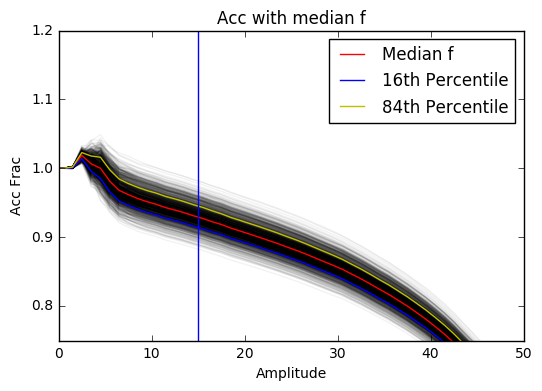

Mean:  0.020570030113 0.0216131084194
Variable:  0.0199338279696 0.0190576778576
Median:  0.0189176565508 0.019348971774


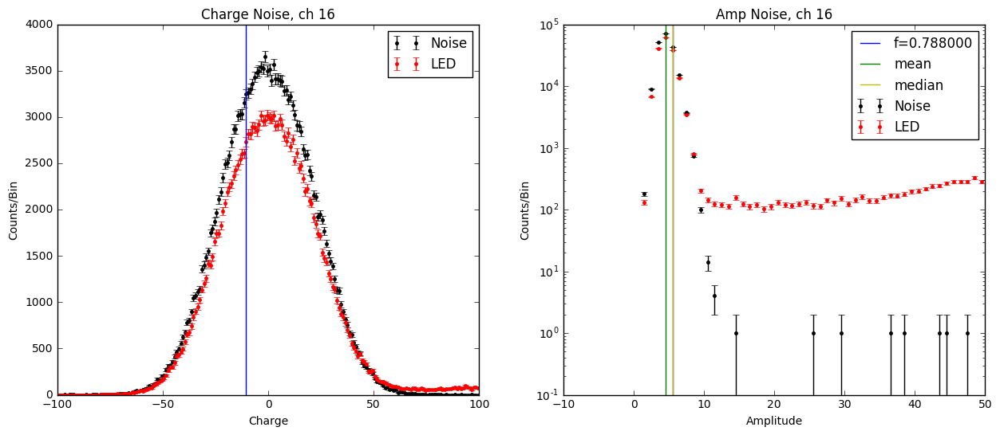

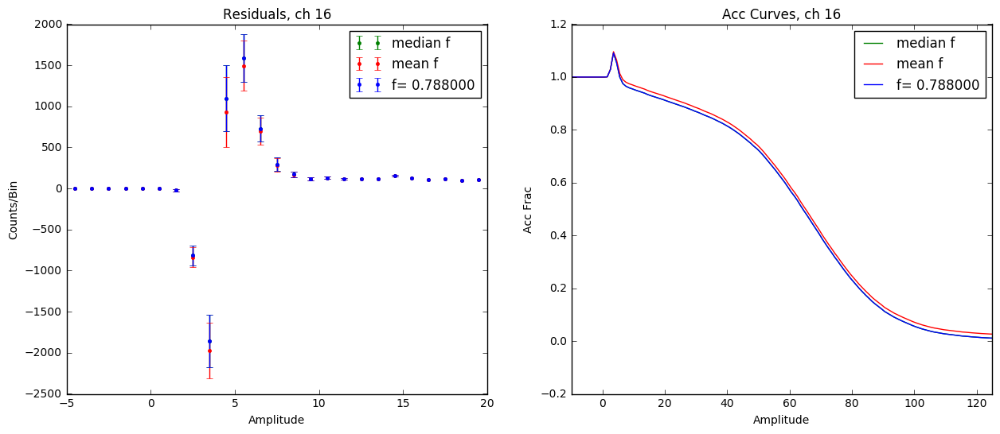

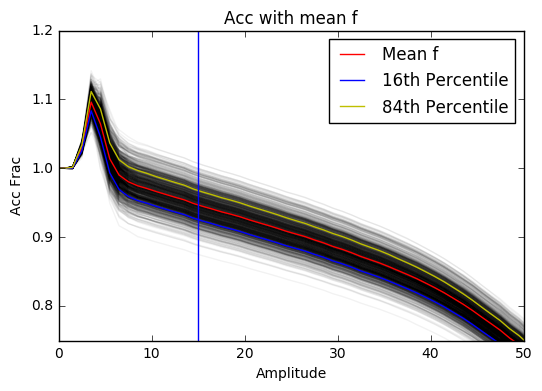

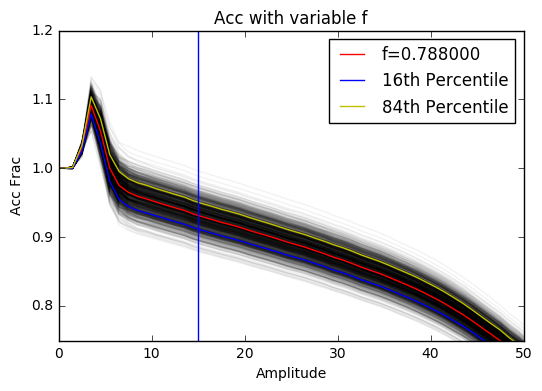

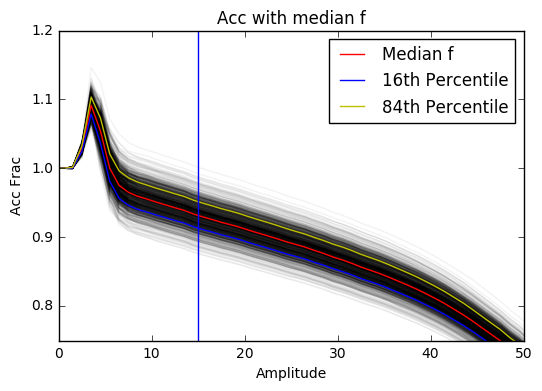

Mean:  0.0178874744668 0.0167441370908
Variable:  0.0149217952993 0.0153459693073
Median:  0.014361157951 0.014041355843


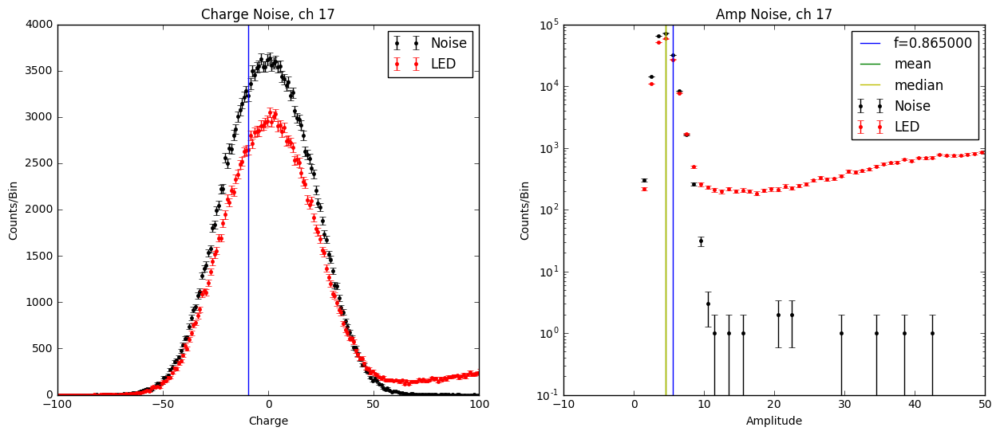

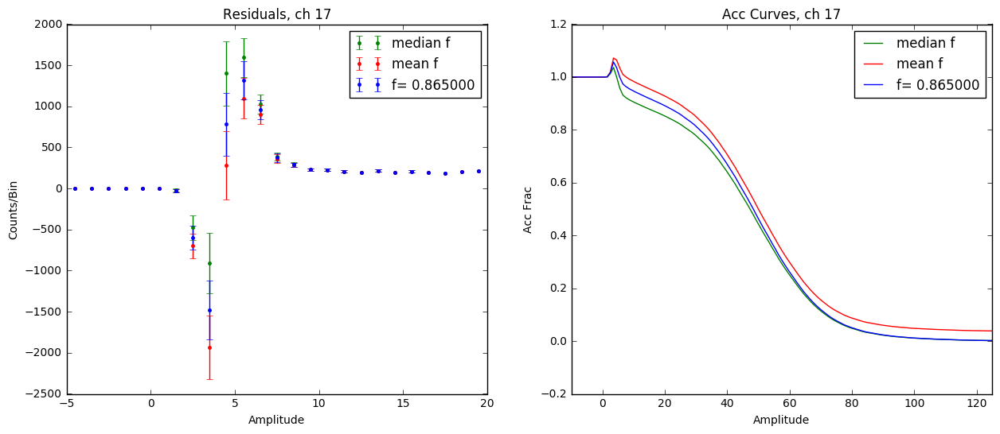

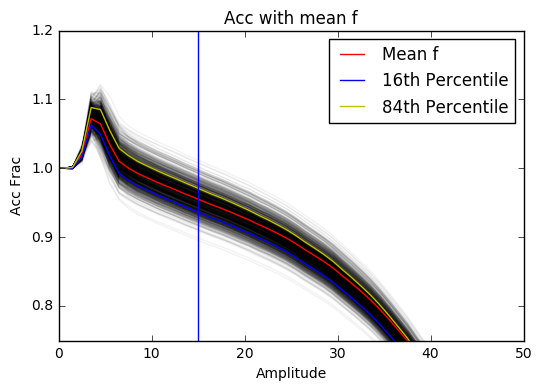

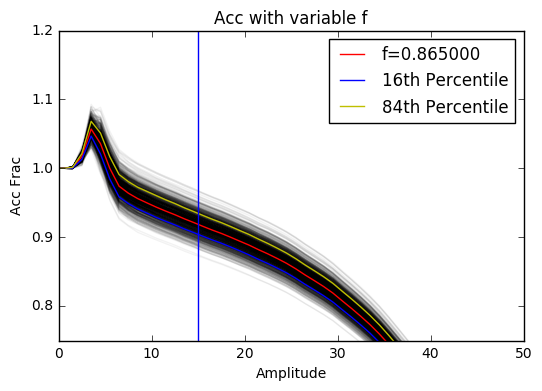

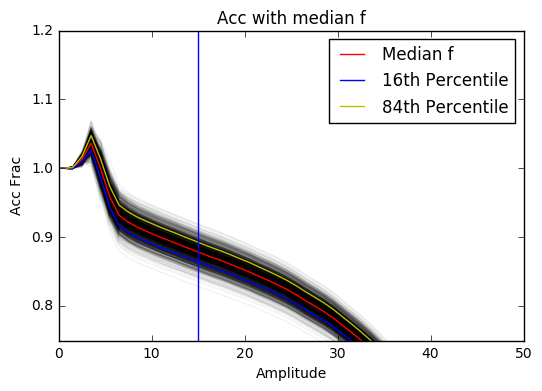

Mean:  0.0177307228567 0.0164687984017
Variable:  0.0155385036134 0.0152535589776
Median:  0.0155317198856 0.0168904306005


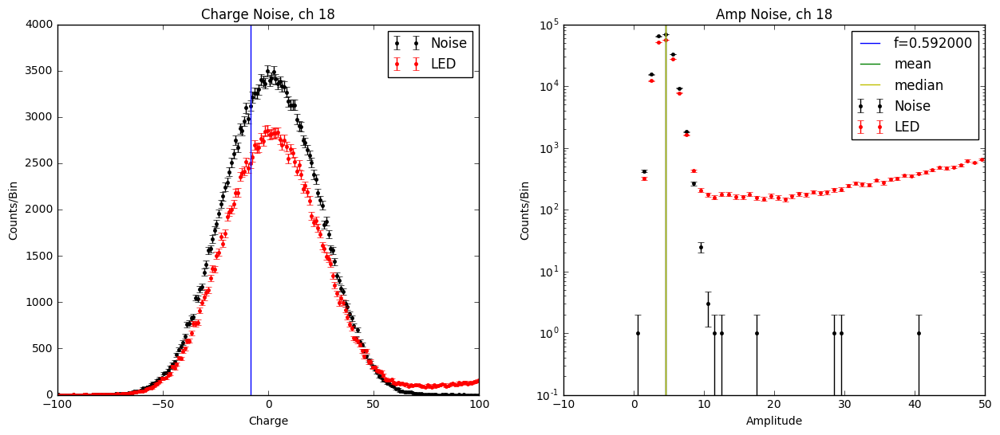

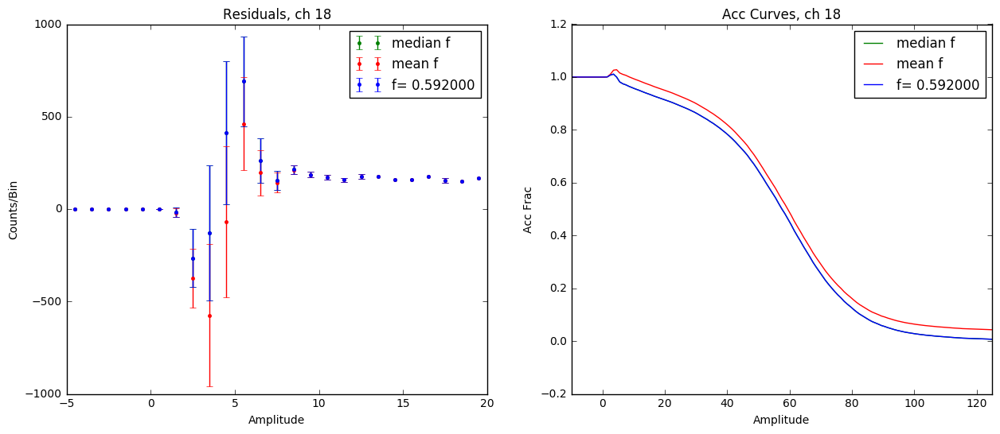

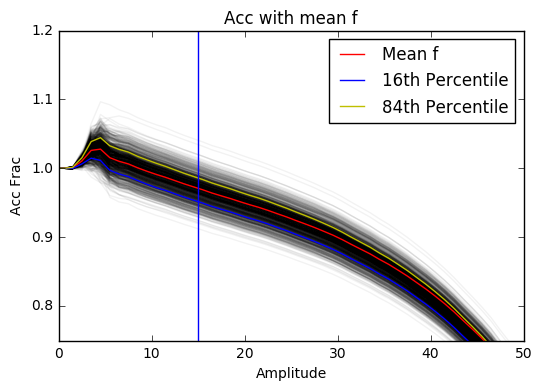

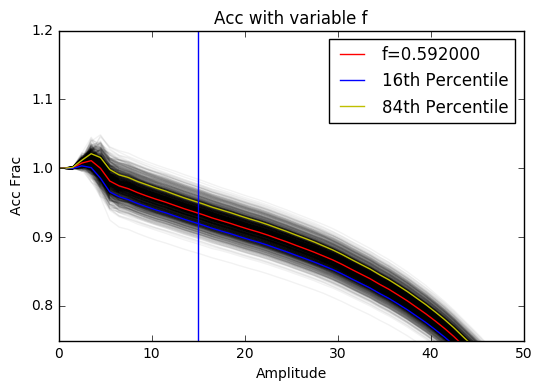

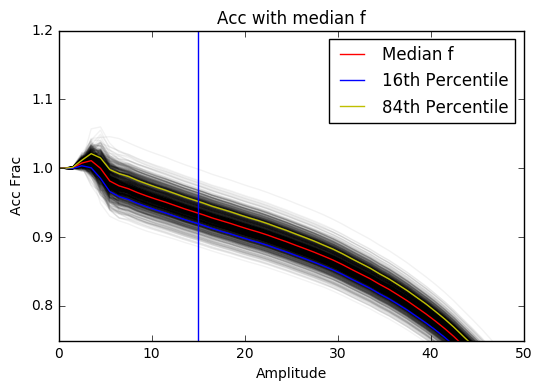

Mean:  0.0198490521647 0.0215012741665
Variable:  0.0380227500824 0.0341371368472
Median:  0.0150166841974 0.0160758577273


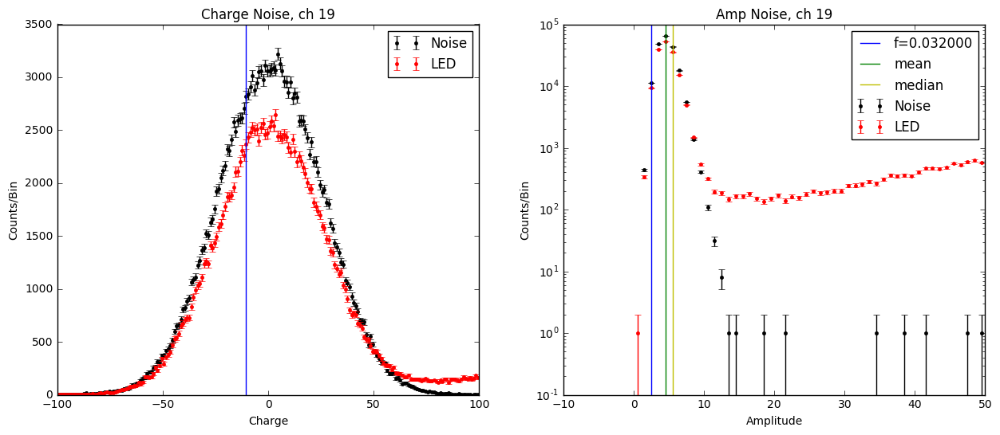

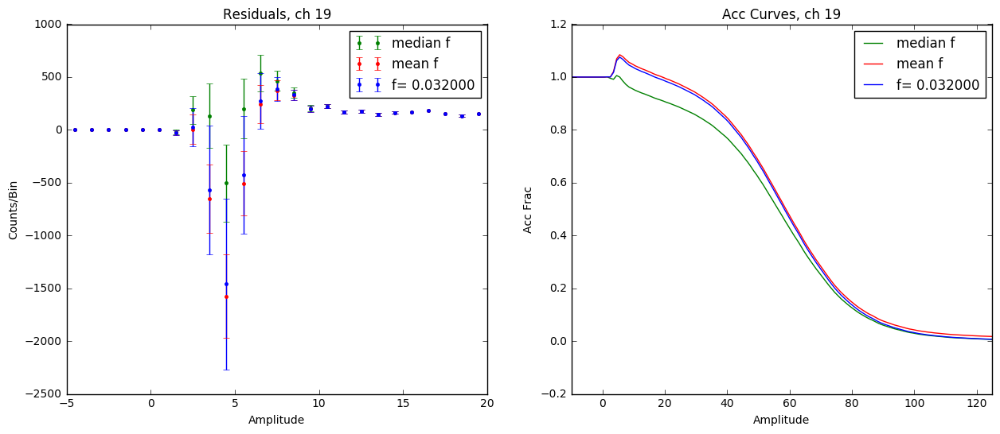

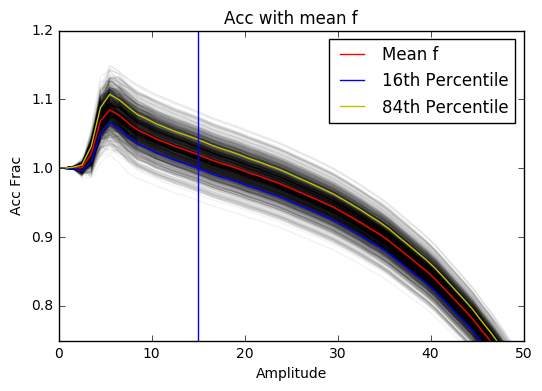

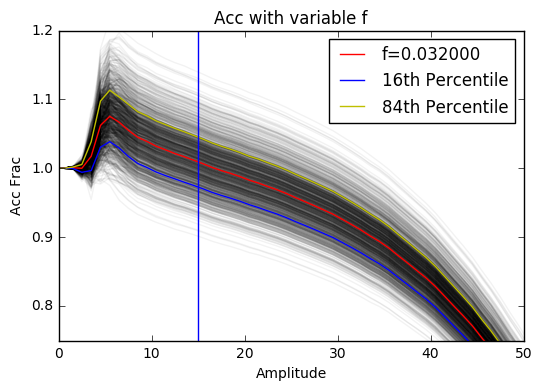

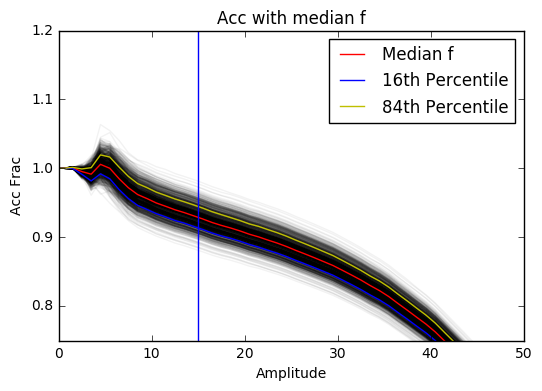

Mean:  0.018305307253 0.0175017878991
Variable:  0.0165224983559 0.017047341262
Median:  0.0143763445225 0.0152892922918


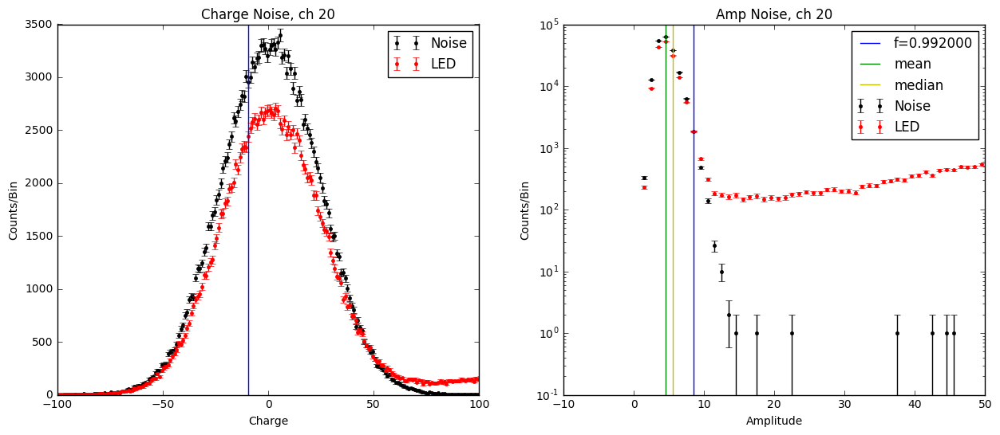

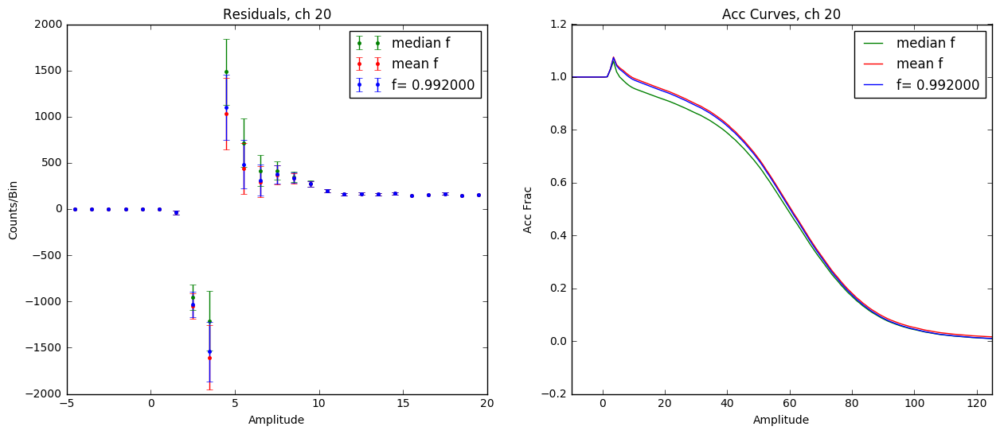

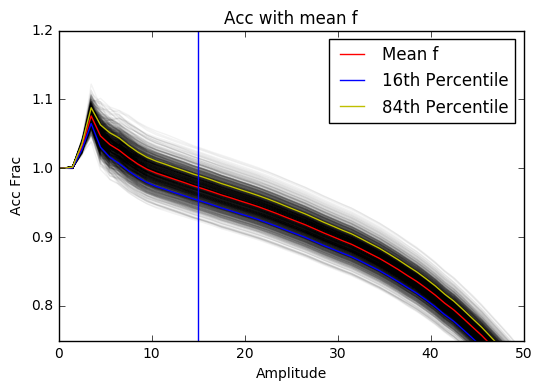

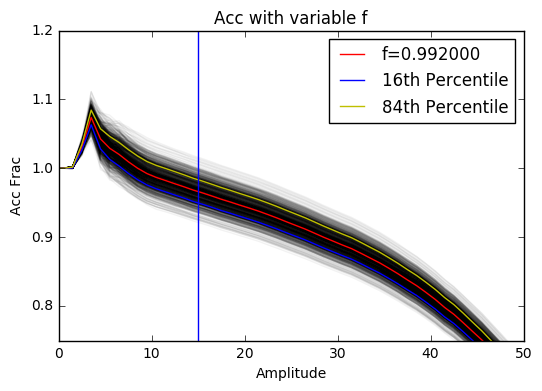

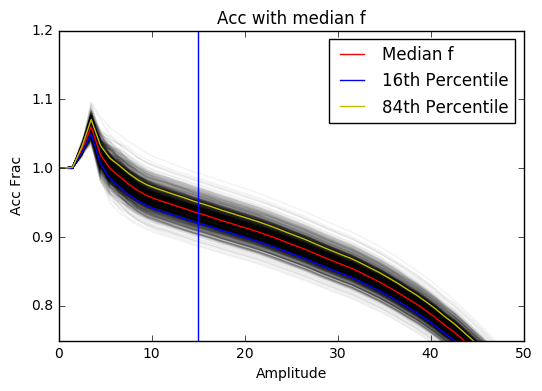

Mean:  0.0168527812891 0.0167228555866
Variable:  0.0152706122528 0.0157937036456
Median:  0.0152005615128 0.0161245785581


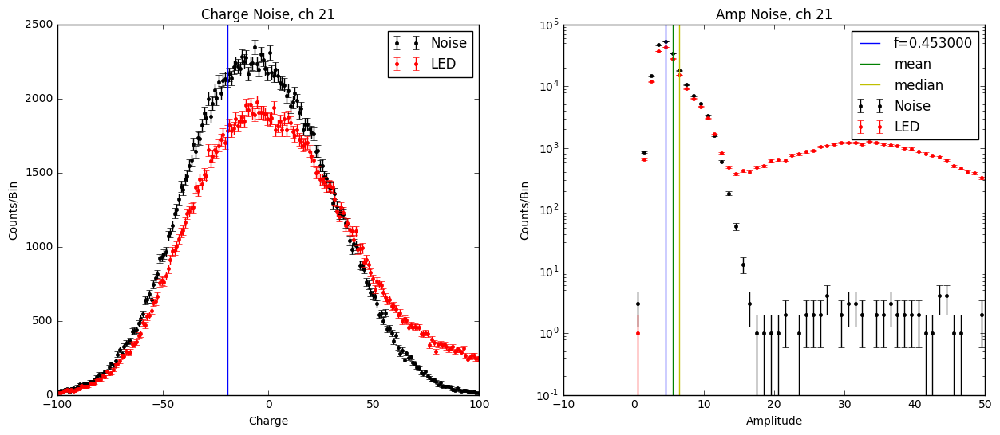

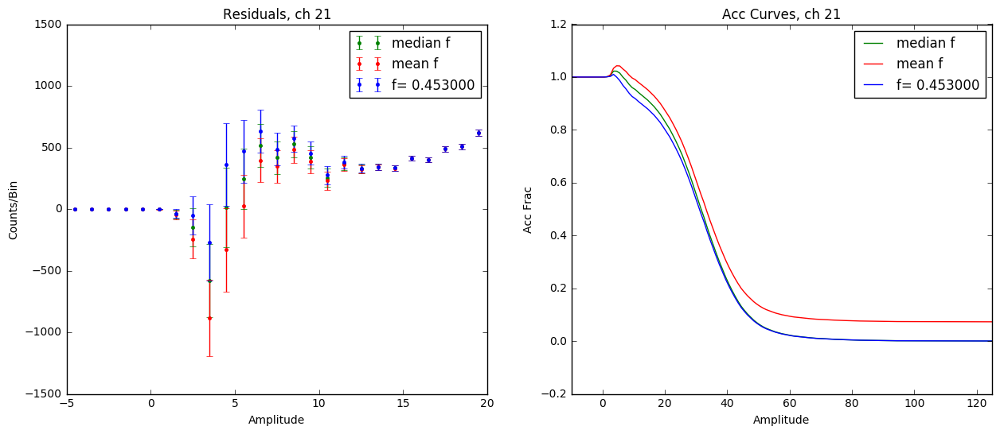

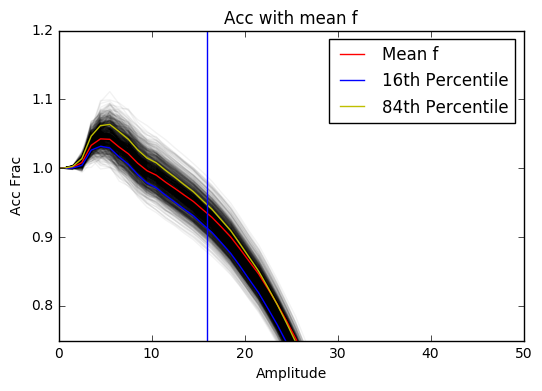

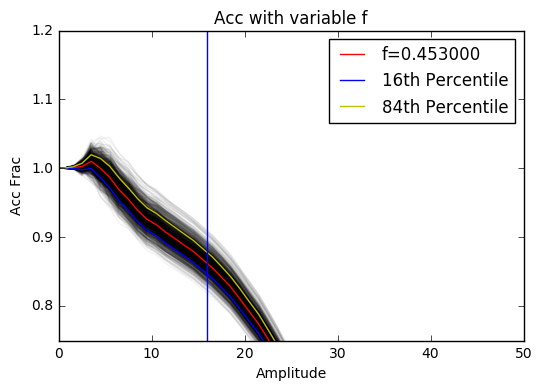

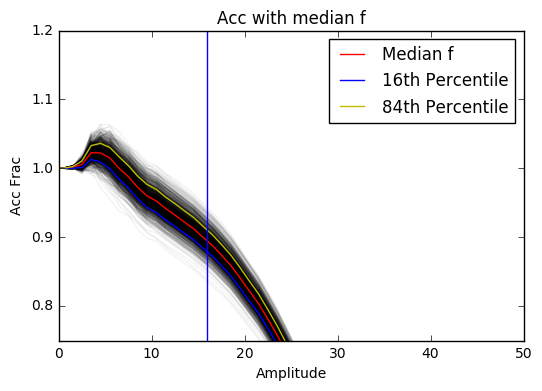

Mean:  0.0165968683182 0.0153830265786
Variable:  0.0134737078976 0.0134052513285
Median:  0.0138881577938 0.0131719278826


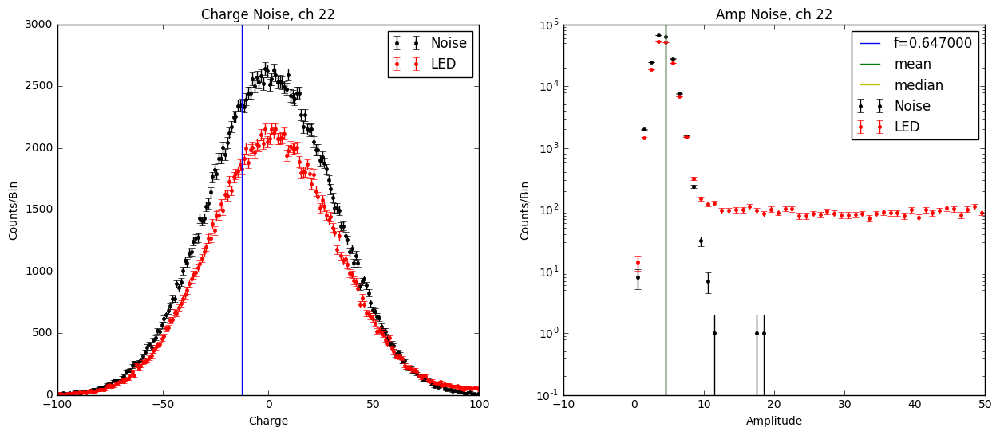

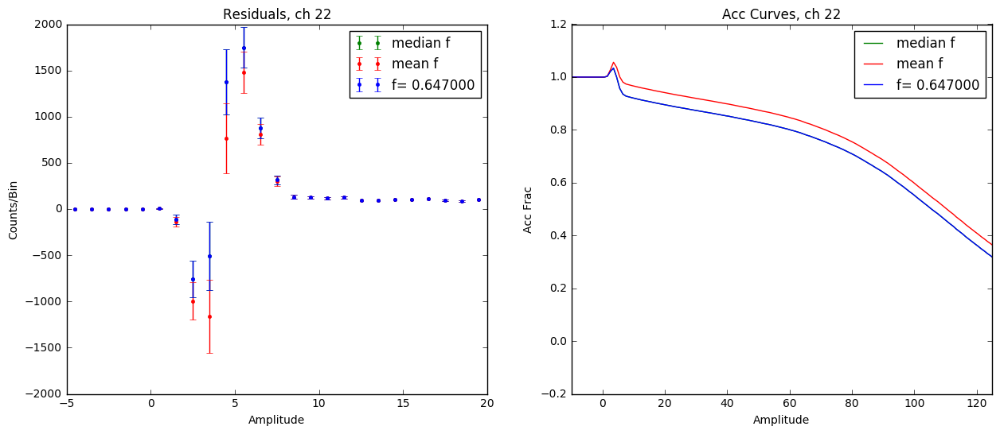

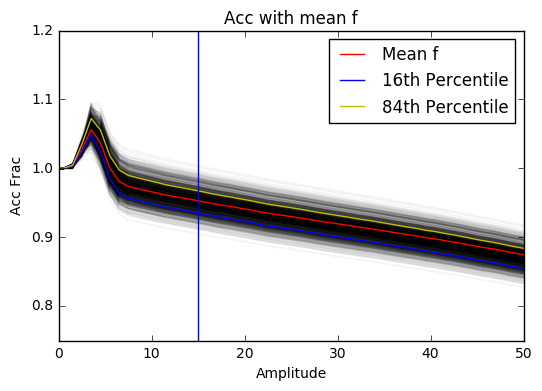

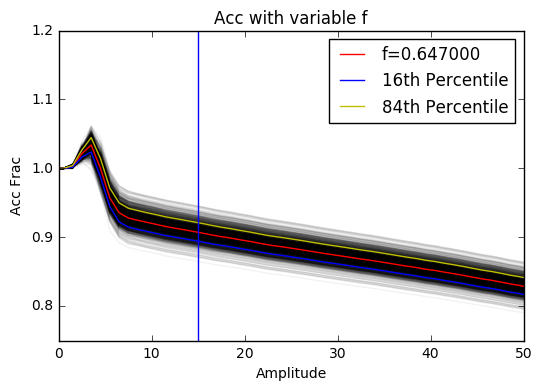

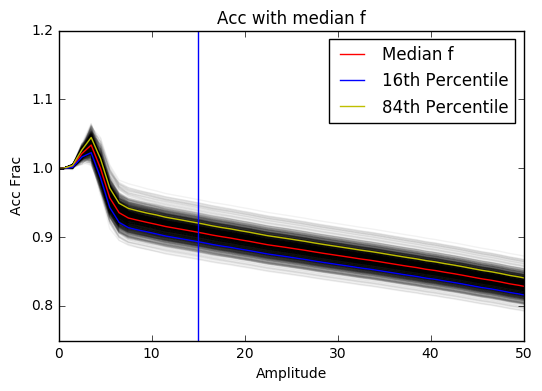

Mean:  0.0239891000045 0.025152231626
Variable:  0.0155429733453 0.0164547745964
Median:  0.0155623678874 0.0154882603542


In [ ]:
for ch in np.arange(248):
    plot_thresh(ch, noise, noise_amp, noise_errs, amp_noise_errs, led, led_amp, led_errs, amp_led_errs)

In [ ]:
amp_occ_dict0={}
amp_occ_dict1={}
q_occ_dict={}

amp_err0={}
amp_err1={}
q_err={}

for ch in np.arange(248):
    #if ch==139:
     #   continue
    q_thresh=correction_threshold(0.333, noise[:, ch])
    q_corr, q_corr_err = S.make_correction(val2corr2=bins[q_thresh]+0.5, space='charge')
    q_occ=-np.log(q_corr)
    q_occ_err=q_corr_err/q_corr
    q_occ_dict[ch]=q_occ[ch]
    q_err[ch]=q_occ_err[ch]
    
    amp_thresh0=correction_threshold(f_df.loc[ch, 0], noise_amp[:, ch])
    amp_thresh1=correction_threshold(f_df.loc[ch, 1], noise_amp[:, ch])
    
    amp_corr0, amp_corr_err0=S.make_correction(val2corr2=bins[amp_thresh0]+0.5, space='amplitude')
    amp_occ0=-np.log(amp_corr0)
    amp_occ_err0=amp_corr_err0/amp_corr0
    amp_occ_dict0[ch]=amp_occ0[ch]
    amp_err0[ch]=amp_occ_err0[ch]
    
    amp_corr1, amp_corr_err1=S.make_correction(val2corr2=bins[amp_thresh1]+0.5, space='amplitude')
    amp_occ1=-np.log(amp_corr1)
    amp_occ_err1=amp_corr_err1/amp_corr1
    amp_occ_dict1[ch]=amp_occ1[ch]
    amp_err1[ch]=amp_occ_err1[ch]
    


In [ ]:
amp_df0=pd.Series(amp_occ_dict0)
amp_df1=pd.Series(amp_occ_dict1)
q_df=pd.Series(q_occ_dict)
q_err_df=pd.Series(q_err)
amp_err_df0=pd.Series(amp_err0)
amp_err_df1=pd.Series(amp_err1)

amp_df0

In [ ]:
on_ch=np.where(q_df.values>0.05)[0]

print(on_ch)

plt.figure()
plt.errorbar(on_ch, amp_df0.loc[on_ch], yerr=amp_err_df0[on_ch], marker='.', linestyle='None', label='Low f Amp Occ')
plt.errorbar(on_ch, amp_df1.loc[on_ch], yerr=amp_err_df1[on_ch], marker='.', linestyle='None', label="High f Amp Occ")
plt.errorbar(on_ch, q_df.loc[on_ch], yerr=q_err_df[on_ch], marker='.', linestyle='None', label='Charge Occ')
plt.xlabel("Channel #")
plt.ylabel("Occupancy [PE/Trigger]")
plt.title("Occupancies for amp with different f values")
plt.legend(loc='best')
plt.ylim(0.2, 0.4)
plt.xlim(0, 125)
plt.show()

In [ ]:
amp_thresh_f1=[]
amp_thresh_f2=[]
amp_thresh_f3=[]
for ch in np.arange(248):
    fs=f_df.loc[ch, 0]
    fmed=np.median(f_df.loc[:,0])
    fmean=np.mean(f_df.loc[:,0])
    a_thresh1=correction_threshold(fs, noise_amp[:,ch])
    a_thresh2=correction_threshold(fmed, noise_amp[:,ch])
    a_thresh3=correction_threshold(fmean, noise_amp[:,ch])
    if amp_df0.loc[ch]>0.05:
        amp_thresh_f1.append(bins[a_thresh1][0]+0.5)
        amp_thresh_f2.append(bins[a_thresh2][0]+0.5)
        amp_thresh_f3.append(bins[a_thresh3][0]+0.5)
        if bins[a_thresh2]+0.5>10:
            print(ch, bins[a_thresh2]+0.5, amp_df0.loc[ch])
plt.figure()    
plt.hist(amp_thresh_f1, bins=10, label='Amp Thresholds, found f values')
plt.xlabel('Threshold Amplitude')
plt.ylabel('Counts')
plt.title("Amp Thresholds with Found F Values")

plt.figure()    
plt.hist(amp_thresh_f2, bins=10, label='Amp Thresholds, Median f')
plt.xlabel('Threshold Amplitude')
plt.ylabel('Counts')
plt.title("Amp Thresholds with Median f")

plt.figure()    
plt.hist(amp_thresh_f3, bins=10, label='Amp Thresholds, Mean f')
plt.xlabel('Threshold Amplitude')
plt.ylabel('Counts')
plt.title("Amp Thresholds with Mean f")
plt.show()

In [ ]:
print(f_df.loc[on_ch, 0])

plt.hist(f_df.loc[on_ch,0] , bins=10, range=(0,1))
plt.xlabel("f")
plt.ylabel("Counts")
plt.title("Frequency of Lower f values")
plt.show()

plt.hist(f_df.loc[on_ch, 1], bins=10, range=(0,1))
plt.xlabel("f")
plt.ylabel("Counts")
plt.title("Frequency of Higher f values")
plt.show()

In [ ]:
ch = 0
f = 0.1

fig, (a1, a2) = plt.subplots(1, 2, figsize=(15,6))
a1.errorbar(bins, noise[:,ch], yerr=noise_errs[:,ch], linestyle='None', color='navy')
a1.set_xlim(-100, 100)
a1.set_title('Ch %d charge pedestal' % ch)
a1.set_xlabel('charge [count*samples]')
a1.set_ylabel('counts/bin')

a2.plot(bins, noise_amp[:,ch], drawstyle='steps-mid', color='navy')
a2.set_xlim(-10, 30)
a2.set_title('Ch %d amplitude pedestal' % ch)
a2.set_xlabel('amplitude [ADC counts]')
a2.set_ylabel('counts/bin')
plt.show()

charge_thresh=np.zeros(248)
amp_thresh=np.zeros(248)
for chan in np.arange(248):
    charge_thresh[chan] = correction_threshold(f, noise[:,chan])
    amp_thresh[chan] = correction_threshold(f, noise_amp[:,chan])

fig, (a1, a2) = plt.subplots(1, 2, figsize=(15,6))
a1.plot(bins, np.cumsum(noise[:,ch])/np.sum(noise[:,ch]), color='navy')
a1.set_xlim(-100, 100)
a1.set_title('Ch %d f vs charge' % ch)
a1.set_xlabel('amplitude [ADC counts]')
a1.set_ylabel('noise fraction (f)')
a1.axhline(f, color='gray')
a1.axvline(bins[charge_thresh[ch]], color='gray')
a1.legend(loc='best')
a1.grid()

a2.plot(bins, np.cumsum(noise_amp[:,ch])/np.sum(noise_amp[:,ch]), color='navy')
a2.set_xlim(-10, 30)
a2.set_title('Ch %d f vs ampltude' % ch)
a2.set_xlabel('amplitude [ADC counts]')
a2.set_ylabel('noise fraction (f)')
a2.axhline(f, color='gray')
a2.axvline(bins[amp_thresh[ch]], color='gray')
a2.legend(loc='best')
a2.grid()


plt.show()
print("Amp Correction value: %f" % bins[amp_thresh[ch]])
print("Charge Correction value: %f" % bins[charge_thresh[ch]])

In [ ]:
# use this f to correct the noise and get a residual spectrum

corr, corr_err = S.make_correction(val2corr2=bins[charge_thresh[ch]]+0.5, space='charge')
occ = -np.log(corr)
occ_stat=corr_err/corr

amp_corr, amp_corr_err=S.make_correction(val2corr2=bins[amp_thresh[ch]]+0.5, space='amplitude')
amp_occ = -np.log(amp_corr)
amp_occ_stat=amp_corr_err/amp_corr

plt.figure(figsize=(9,6))
plt.errorbar(bins, led[:,ch], yerr=led_errs[:,ch], color='red', linestyle='None', label='LED')
plt.errorbar(bins, noise[:,ch], yerr=noise_errs[:,ch], color='black', linestyle='None', label='noise')
plt.yscale('log')
plt.grid()
plt.xlim(-100, 300)
plt.legend()
plt.show()

plt.figure(figsize=(9,6))
plt.errorbar(bins, led[:,ch], yerr=led_errs[:,ch], color='red', linestyle='None', label='LED')
plt.errorbar(bins, corr[ch]*noise[:,ch], yerr=corr[ch]*noise_errs[:,ch], color='navy', linestyle='None', 
             label='corrected noise')
plt.yscale('log')
plt.grid()
plt.xlim(-100, 300)
plt.legend()
plt.show()

plt.figure(figsize=(9,6))
plt.plot(bins, led[:, ch] - corr[ch]*noise[:,ch], color='navy', drawstyle='steps-mid', label='residual')
#plt.yscale('log')
plt.grid()
plt.xlim(-100, 300)
plt.legend()
plt.show()


In [ ]:

plt.figure(figsize=(9,6))
plt.plot(bins, led_amp[:,ch], color='red', drawstyle='steps-mid', label='LED')
plt.plot(bins, noise_amp[:,ch], color='black', drawstyle='steps-mid', label='noise')
plt.yscale('log')
plt.grid()
plt.xlim(-10, 30)
plt.legend()
plt.show()

plt.figure(figsize=(9,6))
plt.errorbar(bins, led_amp[:,ch], color='red', drawstyle='steps-mid', label='LED')
plt.errorbar(bins, corr[ch]*noise_amp[:,ch], color='navy', drawstyle='steps-mid', 
             label='corrected noise')
plt.yscale('log')
plt.grid()
plt.xlim(-10, 30)
plt.legend()
plt.show()

plt.figure(figsize=(9,6))
plt.plot(bins, led_amp[:, ch] - corr[ch]*noise_amp[:,ch], color='navy', drawstyle='steps-mid', label='residual')
#plt.yscale('log')
plt.grid()
plt.xlim(-10, 30)
plt.legend()
plt.show()

In [ ]:
ch=5

sigma_acorr_anoise=amp_corr*noise_amp*np.sqrt( (amp_corr_err/amp_corr)**2 + (amp_noise_errs/noise_amp)**2)
sigma_ampcorr_ampspace_res=np.sqrt( amp_led_errs**2 + sigma_acorr_anoise**2).T

sigma_qcorr_anoise=corr*noise_amp*np.sqrt( (corr_err/corr)**2 + (amp_noise_errs/noise_amp)**2)
sigma_qcorr_ampspace_res=np.sqrt( amp_led_errs**2 + sigma_qcorr_anoise**2).T

sigma_acorr_qnoise=amp_corr*noise_amp*np.sqrt( (amp_corr_err/amp_corr)**2 + (noise_errs/noise)**2)
sigma_ampcorr_qspace_res=np.sqrt( led_errs**2 + sigma_acorr_qnoise**2).T

sigma_qcorr_qnoise=corr*noise*np.sqrt( (corr_err/corr)**2 + (noise_errs/noise)**2)
sigma_qcorr_qspace_res=np.sqrt( led_errs**2 + sigma_qcorr_qnoise**2).T

#print(*led_errs[:,ch])
#print(*sigma_qcorr_qnoise[:,ch])
#print(*sigma_qcorr_qspace_res[ch,:])
#print(*sigma_ampcorr_qspace_res[ch,:])

#print(np.shape(sigma_res), np.shape(sigma_amp_res))

fig, (a1, a2,) = plt.subplots(1, 2, figsize=(15,6))
#Charge Space, Charge Corr
a1.errorbar(bins, led[:, ch], yerr=led_errs[:,ch], linestyle='None', marker='.', label='Charge LED', color='r')
a1.errorbar(bins, corr[ch]*noise[:, ch], yerr=noise_errs[:, ch], linestyle="None", marker='.', label="Charge Noise, Charge Corr", color="k")
a1.errorbar(bins, noise[:, ch], yerr=noise_errs[:, ch], linestyle="None", marker='.', label="Charge Noise", color="g")
a1.set_title("Charge LED/Noise, Charge Correction, ch %d" %ch)
a1.set_xlabel("Charge[Counts*Samples]")
a1.set_ylabel("Counts/Bin")
a1.set_xlim(-50, 50)
a1.legend(loc='best')

#Charge Space, Amp Corr
a2.errorbar(bins, led[:, ch], yerr=led_errs[:,ch], linestyle='None', marker='.', label='Charge LED', color='r')
a2.errorbar(bins, amp_corr[ch]*noise[:, ch], yerr=noise_errs[:, ch], linestyle="None", marker='.', label="Charge Noise, Amp Corr", color="k")
a2.errorbar(bins, noise[:, ch], yerr=noise_errs[:, ch], linestyle="None", marker='.', label="Charge Noise", color="g")
a2.set_title("Charge LED/Noise, Amp Correction, ch %d" %ch)
a2.set_xlabel("Charge[Counts*Samples]")
a2.set_ylabel("Counts/Bin")
a2.set_xlim(-50, 50)
a2.legend(loc='best')


fig, (a1, a2,) = plt.subplots(1, 2, figsize=(15,6))
#Amp Space, Charge Corr
a1.errorbar(bins, led_amp[:, ch], yerr=amp_led_errs[:,ch], linestyle='None', marker='.', label='Amp LED', color='r')
a1.errorbar(bins, corr[ch]*noise_amp[:, ch], yerr=amp_noise_errs[:, ch], linestyle="None", marker='.', label="Amp Noise, Charge Corr", color="k")
a1.errorbar(bins, noise_amp[:, ch], yerr=amp_noise_errs[:, ch], linestyle="None", marker='.', label="Amp Noise", color="g")
a1.set_title("Amp LED/Noise, Charge Correction, ch %d" %ch)
a1.set_xlabel("Amplitude [ADC Counts]")
a1.set_ylabel("Counts/Bin")
a1.set_yscale('log')
a1.set_xlim(0, 15)
a1.legend(loc='best')

#Amp Space, Amp Corr
a2.errorbar(bins, led_amp[:, ch], yerr=amp_led_errs[:,ch], linestyle='None', marker='.', label='Amp LED', color='r')
a2.errorbar(bins, amp_corr[ch]*noise_amp[:, ch], yerr=amp_noise_errs[:, ch], linestyle="None", marker='.', label="Amp Noise, Amp Corr", color="k")
a2.errorbar(bins, noise_amp[:, ch], yerr=amp_noise_errs[:, ch], linestyle="None", marker='.', label="Amp Noise", color="g")
a2.set_title("Amp LED/Noise, Amp Correction, ch %d" %ch)
a2.set_xlabel("Amplitude [ADC Counts]")
a2.set_ylabel("Counts/Bin")
a2.set_yscale('log')
a2.set_xlim(0, 15)
a2.legend(loc='best')

#Residuals
fig, (a1, a2,) = plt.subplots(1, 2, figsize=(15,6))
#Charge Space Res
a1.errorbar(bins, led[:, ch]-corr[ch]*noise[:, ch], yerr=sigma_qcorr_qspace_res[ch, :], linestyle='None', marker='.', label='Charge Res, Charge Corr', color='b')
a1.errorbar(bins, led[:, ch]-amp_corr[ch]*noise[:, ch], yerr=sigma_ampcorr_qspace_res[ch, :], linestyle='None', marker='.', label='Charge Res, Amp Corr', color='r')
a1.set_title("Charge Residual, ch %d" %ch)
a1.set_xlabel("Charge [Counts*Samples]")
a1.set_ylabel("Counts/Bin")
#a1.set_yscale('log')
a1.set_xlim(0,150)
a1.set_ylim(-500,500)
a1.legend(loc='best')

#Amp Space Res
a2.errorbar(bins, led_amp[:, ch]-corr[ch]*noise_amp[:, ch], yerr=sigma_qcorr_ampspace_res[ch, :], linestyle='None', marker='.', label='Amp Res, Charge Corr', color='b')
a2.errorbar(bins, led_amp[:, ch]-amp_corr[ch]*noise_amp[:, ch], yerr=sigma_ampcorr_ampspace_res[ch, :], linestyle='None', marker='.', label='Amp Res, Amp Corr', color='r')
a2.set_title("Amp Residual, ch %d" %ch)
a2.set_xlabel("Amplitude [ADC Counts]")
a2.set_ylabel("Counts/Bin")
#a2.set_yscale('log')
a2.set_xlim(-0, 20)
a2.legend(loc='best')



plt.show()
print("Amplitude Correciton: ", amp_corr[ch])
print("Charge Correction: ", corr[ch])

#### Histogram of differences, plot larger occ differences

In [ ]:

diffs=occ-amp_occ

ch_diffs=[]
for chan in np.arange(248):
    if abs(diffs[chan])>0.05:
        ch_diffs.append(chan)
        print(chan, diffs[chan])

print(occ[ch_diffs])
print(amp_occ[ch_diffs])
plt.figure()
plt.plot(ch_diffs, occ[ch_diffs], marker='.', linestyle='None', label='Charge Occs')
plt.plot(ch_diffs, amp_occ[ch_diffs], marker='.', linestyle='None', label="Amp Occs")
plt.title("Biggest Difference Occs")
plt.xlabel("Channels")
plt.ylabel("Occupancy [PE/Trigger]")
plt.legend(loc='best')
plt.show()

plt.hist(diffs, bins=30, label="Charge Occ - Amp Occ")
plt.title("Difference Between Occ Methods")
plt.xlabel("Occupancy")
plt.ylabel("Counts")
plt.legend(loc='best', prop={'size':10})
plt.show()

#### Histogram of fractional differences, plot largest frac occ differences

In [ ]:
frac_diffs=(occ-amp_occ)/amp_occ

diff_ch=[]
big_diff=[]
for chan in np.arange(248):
    if abs(frac_diffs[chan])>0.25:
        #if occ[ch]>0.05 and amp_occ[ch]>0.05:
        diff_ch.append(chan)
        big_diff.append(frac_diffs[chan])
        print(chan, frac_diffs[chan])

plt.figure()
plt.errorbar(diff_ch, occ[diff_ch], yerr=occ_stat[diff_ch], marker='.', linestyle='None', label='Charge Occs')
plt.errorbar(diff_ch, amp_occ[diff_ch], yerr=amp_occ_stat[diff_ch], marker='.', linestyle='None', label="Amp Occs")
plt.title("Biggest Fractional Difference Occs")
plt.xlabel("Channel #")
plt.ylabel("Occupancy [PE/Trigger]")
plt.legend(loc='best')
plt.xlim(-2, 250)
plt.show()

plt.hist(frac_diffs, bins=50, label="(Charge Occ - Amp Occ)/Amp_Occ")
plt.title("Fractional Difference Between Occ Methods")
plt.xlabel("% Occupancy Difference")
plt.ylabel("Counts")
plt.legend(loc='best', prop={'size':7})
plt.show()

In [ ]:
corr_diffs=[]

for chan in diff_ch:
    corr_diffs.append((corr[chan]-amp_corr[chan])/amp_corr[chan])
    print(ch, corr[chan], amp_corr[chan])
    plt.figure()
    plt.errorbar(bins, led[:, chan], yerr=led_errs[:, chan], linestyle='None', marker='.', color='r', label='Charge LED')
    plt.errorbar(bins, noise[:, chan], yerr=noise_errs[:, chan], linestyle='None', marker='.', color='k', label='Charge Noise')
    plt.title("Charge LED/Noise, ch %d" %chan)
    plt.xlabel("Charge [Counts*Samples]")
    plt.ylabel("Counts/Bin")
    plt.xlim(-200,200)
    plt.legend(loc='best')
    #plt.yscale('log')
    plt.show()
    
    plt.figure()
    plt.errorbar(bins, led_amp[:, chan], yerr=amp_led_errs[:, chan], linestyle='None', marker='.', color='r', label='Amp LED')
    plt.errorbar(bins, noise_amp[:, chan], yerr=noise_errs[:, chan], linestyle='None', marker='.', color='k', label='Amp Noise')
    plt.title("Amp LED/Noise, ch %d" %chan)
    plt.xlabel("Amplitude [ADC Counts]")
    plt.ylabel("Counts/Bin")
    plt.legend(loc='best')
    plt.xlim(-20,150)
    plt.yscale('log')
    plt.show()
    

In [ ]:
plt.hist(corr_diffs, bins=10, label="(Q Corr-Amp_Corr)/Amp_Corr")
plt.title("Frac Diff between corr Methods")
plt.xlabel("% diff between corr methods")
plt.ylabel("Counts")
plt.legend(loc='best', prop={'size':10})
plt.show()

In [ ]:
plt.figure()
plt.plot(np.arange(248), occ, linestyle='None', marker='.', label='Charge Occs')
plt.plot(np.arange(248), amp_occ, linestyle='None', marker='.', label='Amp Occs')
plt.title("All Channel Occs")
plt.xlabel("Channel #")
plt.ylabel("Occupancy [PE/Trigger]")
plt.legend(loc='best')
plt.show()

In [ ]:
q_res=led_amp[:, ch] - corr[ch]*noise_amp[:,ch]
amp_res=led_amp[:, ch] - amp_corr[ch]*noise_amp[:,ch]

q_acc=A_func(q_res)
amp_acc=A_func(amp_res)

plt.figure()
plt.plot(bins, q_acc, label="Charge Corr Acc", color='r')
plt.plot(bins, amp_acc, label="Amp Corr Acc", color='y')
plt.plot(bins, (q_acc+amp_acc)/2, label="Average", color='k')
plt.xlabel('Amplitude [ADC Counts]')
plt.ylabel("Acc Frac")
plt.title("Acc Curves, ch %d" %ch)
plt.legend()
plt.xlim(-10, 450)
plt.show()

In [ ]:
MC_curves=acc_MC(q_res, sigma_qcorr_ampspace_res[ch, :], total_curves=1000)
amp_MC_curves=acc_MC(amp_res, sigma_ampcorr_ampspace_res[ch, :], total_curves=1000)

minus_MC=np.percentile(MC_curves, 16, axis=1)
plus_MC=np.percentile(MC_curves, 84, axis=1)

minus_amp_MC=np.percentile(amp_MC_curves, 16, axis=1)
plus_amp_MC=np.percentile(amp_MC_curves, 84, axis=1)

q_acc_errs=np.array([abs(minus_MC-np.mean(MC_curves, axis=1)), plus_MC-np.mean(MC_curves, axis=1)])
amp_acc_errs=np.array([abs(minus_amp_MC-np.mean(amp_MC_curves, axis=1)), plus_amp_MC-np.mean(amp_MC_curves, axis=1)])

t=bins[amp_thresh[ch]]

plt.figure()
for row in range(len(MC_curves.T)):
    plt.plot(bins, MC_curves.T[row], color='k', alpha=0.05)
plt.plot(bins, q_acc, label="Charge Corr Acc", color='r')
plt.plot(bins, minus_MC, label="16th Percentile", color='b')
plt.plot(bins, plus_MC, label="84th Percentile", color='y')
plt.legend(loc='best')
plt.xlim(0,15)
plt.xlabel("Amplitude [ADC Counts]")
plt.ylabel("Acc Frac")
plt.title("Q Corr MC, ch %d" %ch)
plt.ylim(0.5, 1.3)
plt.axvline(x=t, color='gray', label="Threshold")
plt.show()

plt.figure()
for row in range(len(amp_MC_curves.T)):
    plt.plot(bins, amp_MC_curves.T[row], color='k', alpha=0.05)
plt.plot(bins, amp_acc, label="Amp Corr Acc", color='r')
plt.plot(bins, minus_amp_MC, label="16th Percentile", color='b')
plt.plot(bins, plus_amp_MC, label="84th Percentile", color='y')
plt.legend(loc='best')
plt.xlabel("Amplitude [ADC Counts]")
plt.ylabel("Acc Frac")
plt.title("Amp Corr MC, ch %d" %ch)
plt.xlim(0,15)
plt.ylim(0.5, 1.3)
plt.axvline(x=t, color='gray', label="Threshold")
plt.show()

print("Threshold: ", t)
print("Q Corr Errs: ", q_acc_errs[0, amp_thresh[ch]], q_acc_errs[1, amp_thresh[ch]])
print("Amp Corr Errs: ", amp_acc_errs[0,amp_thresh[ch]], amp_acc_errs[1,amp_thresh[ch]])

In [ ]:
q_up={}
q_low={}

amp_up={}
amp_low={}

for chan in np.arange(248):
    q_up[chan]=q_acc_errs[1, amp_thresh[chan]]
    q_low[chan]=q_acc_errs[1, amp_thresh[chan]]
    
    amp_up[chan]=amp_acc_errs[1, amp_thresh[chan]]
    amp_low[chan]=amp_acc_errs[0, amp_thresh[chan]]

print(q_up)
q_up_df=pd.Series(q_up)
q_low_df=pd.Series(q_low)

amp_up_df=pd.Series(amp_up)
amp_low_df=pd.Series(amp_low)

amp_up_df

In [ ]:
on_ch=np.where(occ>0.05)[0]
amp_on_ch=np.where(amp_occ>0.05)[0]
print(np.sum(q_up_df.loc[on_ch])**2/len(on_ch))
print(np.sum(amp_up_df.loc[amp_on_ch])**2/len(amp_on_ch))

In [ ]:
plt.figure()
plt.errobar(on_ch, q_acc[t], yerr=)